In [1]:
# Import Python Standard Library dependencies
from functools import partial
from pathlib import Path

# Import utility functions
from cjm_pil_utils.core import get_img_files
from cjm_psl_utils.core import download_file, file_extract
from cjm_pytorch_utils.core import tensor_to_pil
from cjm_torchvision_tfms.core import ResizeMax, PadSquare, CustomRandomIoUCrop

# Import the distinctipy module
from distinctipy import distinctipy

# Import matplotlib for creating plots
import matplotlib.pyplot as plt

# Import numpy
import numpy as np

# Import the pandas package
import pandas as pd

# Do not truncate the contents of cells and display all rows and columns
pd.set_option('max_colwidth', None, 'display.max_rows', None, 'display.max_columns', None)

# Import PIL for image manipulation
from PIL import Image, ImageDraw

# Import PyTorch dependencies
import torch
from torch.utils.data import Dataset, DataLoader

# Import torchvision dependencies
import torchvision
torchvision.disable_beta_transforms_warning()
from torchvision.tv_tensors import BoundingBoxes, Mask
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks
import torchvision.transforms.v2  as transforms

# Import tqdm for progress bar
from tqdm.auto import tqdm

In [2]:
# Define path to store datasets
dataset_dir = Path("")
# Create the dataset directory if it does not exist
dataset_dir.mkdir(parents=True, exist_ok=True)



# Creating a Series with the paths and converting it to a DataFrame for display
pd.Series({
    "Dataset Directory:": dataset_dir, 
    
}).to_frame().style.hide(axis='columns')

Dataset Directory:,.


In [3]:
img_dir = dataset_dir/'AKUDENTALlast/'
# Get all image files in the 'img_dir' directory
img_dict = {
    file.stem : file # Create a dictionary that maps file names to file paths
    for file in get_img_files(img_dir) # Get a list of image files in the image directory
}

# Print the number of image files
print(f"Number of Images: {len(img_dict)}")

# Display the first five entries from the dictionary using a Pandas DataFrame
pd.DataFrame.from_dict(img_dict, orient='index').head()

Number of Images: 333


,0
1,AKUDENTALlast\1.jpg
10,AKUDENTALlast\10.jpg
100,AKUDENTALlast\100.jpg
101,AKUDENTALlast\101.jpg
102,AKUDENTALlast\102.jpg


In [4]:
# Import Python Standard Library dependencies
from functools import partial
from pathlib import Path

# Import utility functions
from cjm_pil_utils.core import get_img_files
from cjm_psl_utils.core import download_file, file_extract
from cjm_pytorch_utils.core import tensor_to_pil
from cjm_torchvision_tfms.core import ResizeMax, PadSquare, CustomRandomIoUCrop

# Import the distinctipy module
from distinctipy import distinctipy

# Import matplotlib for creating plots
import matplotlib.pyplot as plt

# Import numpy
import numpy as np

# Import the pandas package
import pandas as pd

# Do not truncate the contents of cells and display all rows and columns
pd.set_option('max_colwidth', None, 'display.max_rows', None, 'display.max_columns', None)

# Import PIL for image manipulation
from PIL import Image, ImageDraw

# Import PyTorch dependencies
import torch
from torch.utils.data import Dataset, DataLoader

# Import torchvision dependencies
import torchvision
torchvision.disable_beta_transforms_warning()
from torchvision.tv_tensors import BoundingBoxes, Mask
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks
import torchvision.transforms.v2  as transforms
import json
# Import tqdm for progress bar
from tqdm.auto import tqdm
with open('instances.json') as f:
    coco_data = json.load(f)

# Create DataFrames using explicit COCO structure
# 1. Categories
categories_df = pd.DataFrame(coco_data['categories']).set_index('id')

# 2. Images
images_df = pd.DataFrame(coco_data['images']).set_index('id')

# 3. Annotations
annotations_df = pd.json_normalize(coco_data['annotations']).rename(columns={
    'image_id': 'image_id',
    'bbox': 'bbox',
    'category_id': 'category_id',
    'segmentation': 'segmentation'
})

# Merge annotations with image info
annotation_df = pd.merge(
    annotations_df,
    images_df,
    left_on='image_id',
    right_index=True
)

# Add category names
annotation_df['label'] = annotation_df['category_id'].map(categories_df['name'])

# Group by image
grouped_df = annotation_df.groupby('file_name').agg({
    'segmentation': list,
    'label': list,
    'bbox': list,
    'height': 'first',
    'width': 'first'
}).rename(columns={
    'segmentation': 'segmentations',
    'label': 'labels',
    'bbox': 'bboxes'
})

# Reset index to get image_id as column
annotation_df = grouped_df.reset_index().set_index('file_name')

print(annotation_df.head())
# annotation_df.head()



img_dict = {img_key: f'./AKUDENTALlast/{img_key}' for img_key in annotation_df.index}

In [5]:
with open('instances_tufts_maskrcnn.json') as f:
    coco_data_tufts = json.load(f)

# Create DataFrames using explicit COCO structure
# 1. Categories
categories_df_tufts = pd.DataFrame(coco_data_tufts['categories']).set_index('id')

# 2. Images
images_df_tufts = pd.DataFrame(coco_data_tufts['images']).set_index('id')

# 3. Annotations
annotations_df_tufts = pd.json_normalize(coco_data_tufts['annotations']).rename(columns={
    'image_id': 'image_id',
    'bbox': 'bbox',
    'category_id': 'category_id',
    'segmentation': 'segmentation'
})

# Merge annotations with image info
annotation_df_tufts = pd.merge(
    annotations_df_tufts,
    images_df_tufts,
    left_on='image_id',
    right_index=True
)

# Add category names
annotation_df_tufts['label'] = annotation_df_tufts['category_id'].map(categories_df_tufts['name'])

# Group by image
grouped_df_tufts = annotation_df_tufts.groupby('file_name').agg({
    'segmentation': list,
    'label': list,
    'bbox': list,
    'height': 'first',
    'width': 'first'
}).rename(columns={
    'segmentation': 'segmentations',
    'label': 'labels',
    'bbox': 'bboxes'
})

# Reset index to get image_id as column
annotation_df_tufts = grouped_df_tufts.reset_index().set_index('file_name')
print(annotation_df_tufts.head())
img_dict_tufts = {img_key: f'./tufts_palmer/{img_key}' for img_key in annotation_df_tufts.index}

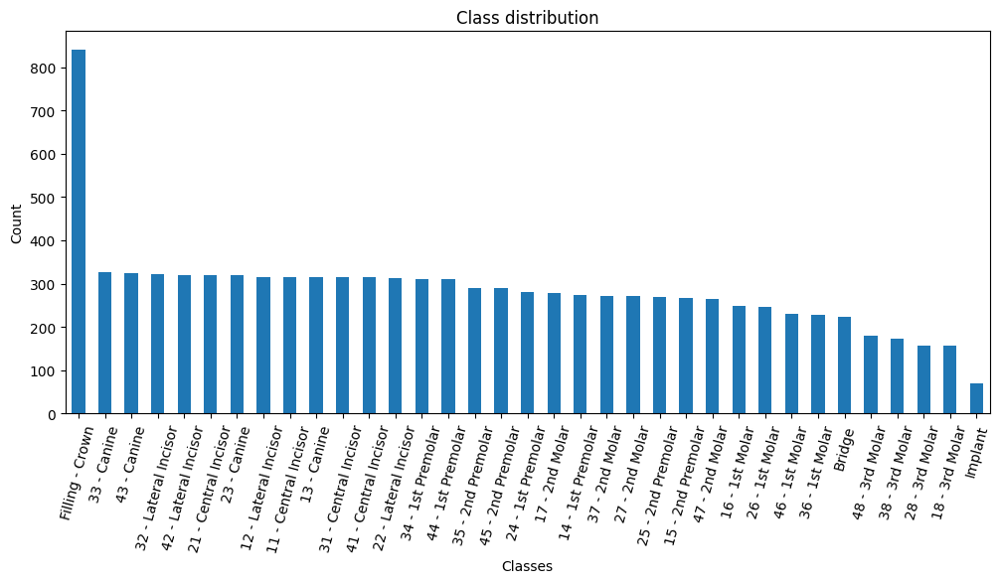

In [6]:
# Get a list of unique labels in the 'annotation_df' DataFrame
class_names = annotation_df['labels'].explode().unique().tolist()
class_names = categories_df['name'].tolist()
# Display labels using a Pandas DataFrame
pd.DataFrame(class_names)
class_counts = pd.DataFrame(annotation_df['labels'].explode().tolist()).value_counts()

plot_labels = [index[0] for index in class_counts.index]

# Plot the distribution
class_counts.plot(kind='bar', figsize=(12, 5))
plt.title('Class distribution')
plt.ylabel('Count')
plt.xlabel('Classes')
plt.xticks(range(len(class_counts.index)), plot_labels, rotation=75)  # Set the x-axis tick labels
plt.show()

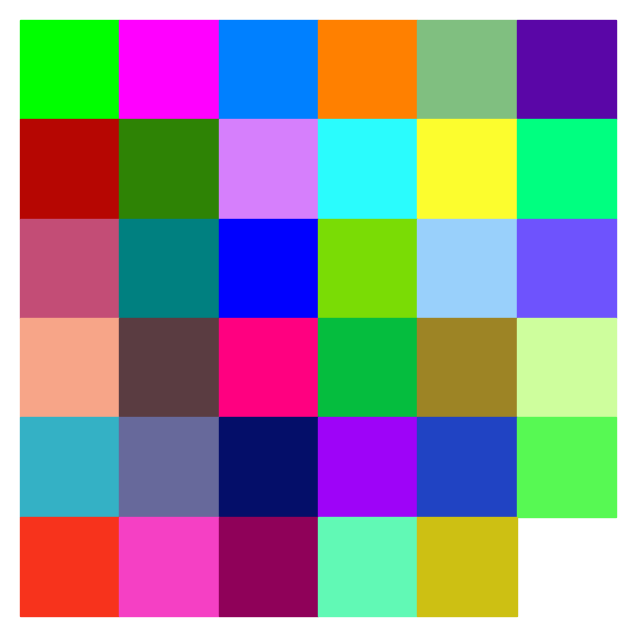

In [7]:

# Generate a list of colors with a length equal to the number of labels
colors = distinctipy.get_colors(len(class_names))

# Make a copy of the color map in integer format
int_colors = [tuple(int(c*255) for c in color) for color in colors]

# Generate a color swatch to visualize the color map
distinctipy.color_swatch(colors)

The file ./KFOlCnqEu92Fr1MmEU9vAw.ttf already exists and overwrite is set to False.
Image Dims: (2943, 1435)


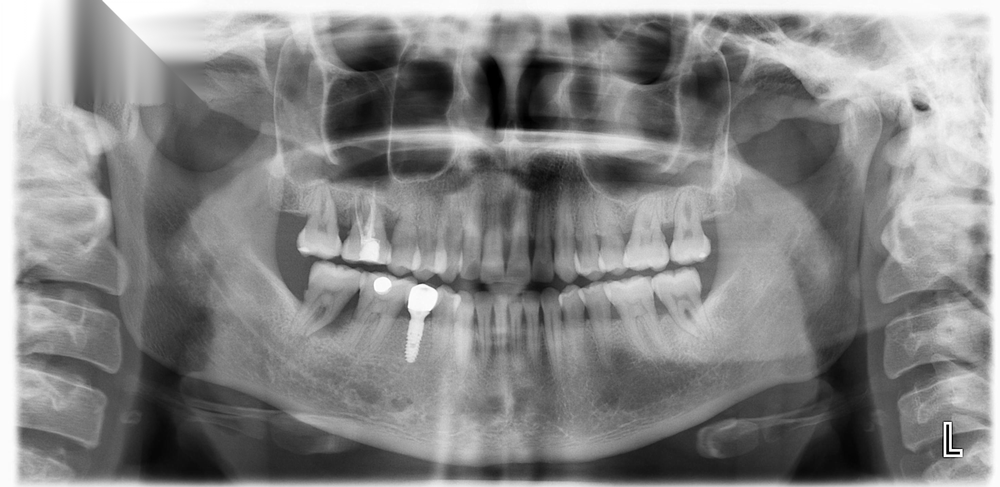

In [22]:
# Set the name of the font file
font_file = 'KFOlCnqEu92Fr1MmEU9vAw.ttf'

# Download the font file
download_file(f"https://fonts.gstatic.com/s/roboto/v30/{font_file}", "./")

draw_bboxes = partial(draw_bounding_boxes, fill=False, width=2, font=font_file, font_size=25)
# Get the file ID of the first image file
file_id = list(img_dict.keys())[73]

# Open the associated image file as a RGB image
sample_img = Image.open(img_dict[file_id]).convert('RGB')

# Print the dimensions of the image
print(f"Image Dims: {sample_img.size}")

# Show the image
sample_img

In [23]:
# Get the row from the 'annotation_df' DataFrame corresponding to the 'file_id'

def create_polygon_mask(image_size, vertices):
    """
    Create a grayscale image with a white polygonal area on a black background.

    Parameters:
    - image_size (tuple): A tuple representing the dimensions (width, height) of the image.
    - vertices (list): A list of tuples, each containing the x, y coordinates of a vertex
                        of the polygon. Vertices should be in clockwise or counter-clockwise order.

    Returns:
    - PIL.Image.Image: A PIL Image object containing the polygonal mask.
    """

    # Create a new black image with the given dimensions
    mask_img = Image.new('L', image_size, 0)
    
    # Draw the polygon on the image. The area inside the polygon will be white (255).
    ImageDraw.Draw(mask_img, 'L').polygon(vertices, fill=(255))

    # Return the image with the drawn polygon
    return mask_img

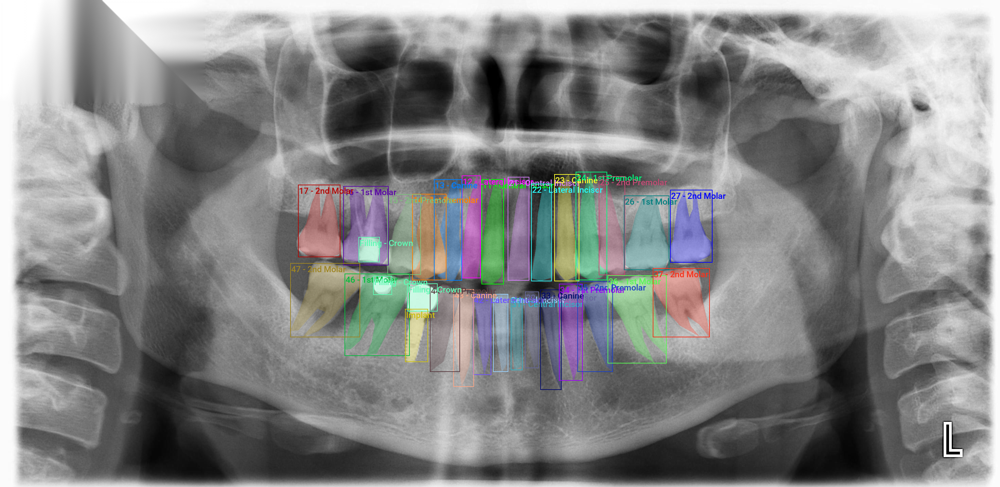

In [24]:
# Extract the polygon points for segmentation mask
polygon_points = annotation_df.loc[file_id]['segmentations']

# Generate mask images from polygons
mask_imgs = [create_polygon_mask(sample_img.size, polygon[0]) for polygon in polygon_points]

# Convert mask images to tensors
masks = torch.concat([Mask(transforms.PILToTensor()(mask_img), dtype=torch.bool) for mask_img in mask_imgs])

# Extract the labels and bounding box annotations for the sample image
labels = annotation_df.loc[file_id]['labels']
bboxes = annotation_df.loc[file_id]['bboxes']

# Annotate the sample image with segmentation masks
annotated_tensor = draw_segmentation_masks(
    image=transforms.PILToTensor()(sample_img), 
    masks=masks, 
    alpha=0.3, 
    colors=[int_colors[i] for i in [class_names.index(label) for label in labels]]
)

# Annotate the sample image with labels and bounding boxes
annotated_tensor = draw_bboxes(
    image=annotated_tensor, 
    boxes=torchvision.ops.box_convert(torch.Tensor(bboxes), 'xywh', 'xyxy'),
    labels=labels, 
    colors=[int_colors[i] for i in [class_names.index(label) for label in labels]]
)

tensor_to_pil(annotated_tensor)

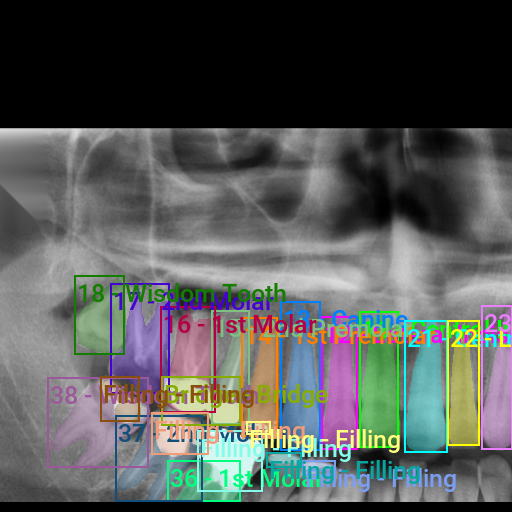

Source Image:,"(2943, 1435)"
Cropped Image:,"(1262, 920)"
Resized Image:,"(511, 373)"
Padded Image:,"(511, 511)"
Resized Padded Image:,"(512, 512)"


In [ ]:
train_sz=512
# Create a RandomIoUCrop object
# Create a RandomIoUCrop object
iou_crop = CustomRandomIoUCrop(min_scale=0.3, 
                               max_scale=1.0, 
                               min_aspect_ratio=0.5, 
                               max_aspect_ratio=2.0, 
                               sampler_options=[0.0, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0],
                               trials=400, 
                               jitter_factor=0.25)

# Create a `ResizeMax` object
resize_max = ResizeMax(max_sz=train_sz)

# Create a `PadSquare` object
pad_square = PadSquare(shift=True, fill=0)
# Prepare bounding box targets
# Get colors for dataset sample
sample_colors = [int_colors[i] for i in [class_names.index(label) for label in labels]]

# Prepare bounding box targets
targets = {
    'masks': Mask(masks), 
    'boxes': BoundingBoxes(torchvision.ops.box_convert(torch.Tensor(bboxes), 'xywh', 'xyxy'), 
                           format='xyxy', 
                           canvas_size=sample_img.size[::-1]), 
    'labels': torch.Tensor([class_names.index(label) for label in labels])
}

# Crop the image
cropped_img, targets = iou_crop(sample_img, targets)

# Resize the image
resized_img, targets = resize_max(cropped_img, targets)

# Pad the image
padded_img, targets = pad_square(resized_img, targets)

# Ensure the padded image is the target size
resize = transforms.Resize([train_sz] * 2, antialias=True)
resized_padded_img, targets = resize(padded_img, targets)
sanitized_img, targets = transforms.SanitizeBoundingBoxes()(resized_padded_img, targets)

# Annotate the sample image with segmentation masks
annotated_tensor = draw_segmentation_masks(
    image=transforms.PILToTensor()(sanitized_img), 
    masks=targets['masks'], 
    alpha=0.3, 
    colors=sample_colors
)

# Annotate the augmented image with updated labels and bounding boxes
annotated_tensor = draw_bboxes(
    image=annotated_tensor, 
    boxes=targets['boxes'], 
    labels=[class_names[int(label.item())] for label in targets['labels']], 
    colors=[int_colors[i] for i in [class_names.index(label) for label in labels]]
)

# Display the annotated image
display(tensor_to_pil(annotated_tensor))

pd.Series({
    "Source Image:": sample_img.size,
    "Cropped Image:": cropped_img.size,
    "Resized Image:": resized_img.size,
    "Padded Image:": padded_img.size,
    "Resized Padded Image:": resized_padded_img.size,
}).to_frame().style.hide(axis='columns')

In [ ]:
import torch
from torch.utils.data import Dataset
from PIL import Image, ImageDraw
import torchvision
from torchvision import transforms
from torchvision.models.detection import MaskRCNN
import pandas as pd
from torchvision.ops import masks_to_boxes
from torchvision.transforms import functional as F

def create_polygon_mask(image_size, polygon_points):
    """
    Helper function to create a mask from polygon points.
    
    :param image_size: Tuple (width, height)
    :param polygon_points: List of points defining the polygon (x, y)
    :return: PIL Image with the mask
    """
    mask = Image.new('L', image_size, 0)  # Create a blank mask (black)
    draw = ImageDraw.Draw(mask)
    draw.polygon(polygon_points, outline=1, fill=1)  # Draw the polygon
    return mask

class DentalDataset(Dataset):
    """
    A PyTorch Dataset class for COCO-style instance segmentation.
    
    Attributes:
    _img_keys : list
        List of image keys (identifiers).
    _annotation_df : pandas.DataFrame
        DataFrame containing annotations for images.
    _img_dict : dict
        Dictionary mapping image keys to their file paths.
    _class_to_idx : dict
        Dictionary mapping class names to class indices.
    _transforms : torchvision.transforms (optional)
        Transformations to be applied to the images and targets.
    """
    
    def __init__(self, img_keys, annotation_df, img_dict, class_to_idx, transforms=None):
        """
        Initializes the dataset with image keys, annotations, image dictionary,
        class mappings, and optional transforms.
        """
        super(DentalDataset, self).__init__()
        
        self._img_keys = img_keys  # List of image keys
        self._annotation_df = annotation_df  # DataFrame containing annotations
        self._img_dict = img_dict  # Dictionary mapping image keys to image paths
        self._class_to_idx = class_to_idx  # Dictionary mapping class names to class indices
        self._transforms = transforms  # Image transforms to be applied
               # Make sure the annotation dataframe is indexed correctly
        # If annotation_df doesn't use img_keys as index, create a mapping
        self.use_direct_indexing = all(key in self._annotation_df.index for key in self._img_keys)
        if not self.use_direct_indexing:
            # Create mapping from position to dataframe index
            self.index_mapping = {i: key for i, key in enumerate(self._img_keys)}

    def __len__(self):
        # Returns the number of items in the dataset
        return len(self._img_keys)
        
    def __getitem__(self, index):
        # Retrieves an image and its corresponding target by index
        
        
        if index >= len(self._img_keys):
            raise IndexError(f"Index {index} out of range for dataset of size {len(self._img_keys)}")
            
        # Get the correct key based on indexing method
        if self.use_direct_indexing:
            img_key = self._img_keys[index]
            annotation = self._annotation_df.loc[img_key]
        else:
            # Use position-based indexing
            img_key = self._img_keys[index]
            # Find the annotation by position or key
            try:
                annotation = self._annotation_df.iloc[index]
            except IndexError:
                # If index is out of range, try to find by key
                if img_key in self._annotation_df.index:
                    annotation = self._annotation_df.loc[img_key]
                else:
                    raise KeyError(f"Key {img_key} not found in annotation DataFrame")
        image, target = self._load_image_and_target(annotation, index)
        
        # Apply transformations if any
        if self._transforms:
            image, target = self._transforms(image, target)
        
        return image, target

    def _load_image_and_target(self, annotation, index):
        """
        Loads an image and its corresponding target data (masks, boxes, labels)
        from the annotation DataFrame.
        """
        # Load the image
        # Get the image filename/key - handle different DataFrame structures
        if hasattr(annotation, 'name'):
            img_key = annotation.name  # If annotation is a Series with a name
        else:
            # If annotation doesn't have a name, use the index from _img_keys
            img_key = self._img_keys[index]
   
        # Load the image
        filepath = self._img_dict[img_key]
        image = Image.open(filepath).convert('RGB')

        # Process the segmentation data
        segmentations = annotation['segmentations']
        labels = annotation['labels']
        
        # Convert the labels from strings to class indices
        labels = torch.tensor([self._class_to_idx[label] for label in labels], dtype=torch.int64)

        # Create the segmentation masks
        areas=[]
        mask_imgs = []
        for segmentation in segmentations:
            
            # Assume segmentation is a polygon or a similar structure
            mask_img = create_polygon_mask(image.size, segmentation[0])  # Polygon mask
            mask_imgs.append(mask_img)
            # Print the shape of each mask

        
        # Convert masks to tensor
        masks = Mask(torch.concat([Mask(transforms.PILToTensor()(mask_img), dtype=torch.bool) for mask_img in mask_imgs]))
        #mask_tensor = F.pil_to_tensor(mask_img).to(torch.bool)  # Convert to tensor
        areas = [mask.sum().item() for mask in masks]

        
        # Convert masks to tensor


        # Generate bounding box annotations from segmentation masks
        bboxes = BoundingBoxes(data=torchvision.ops.masks_to_boxes(masks), format='xyxy', canvas_size=image.size[::-1])
        
        # Set `iscrowd` to 0 for all elements
        iscrowd = torch.zeros(len(masks,), dtype=torch.int64)
        # area = (bboxes[:, 3] - bboxes[:, 1]) * (bboxes[:, 2] - bboxes[:, 0])
        # Prepare the target with area and iscrowd information
        target = {
            'image_id': index,  # Image index
            'masks': masks,
            'boxes': bboxes,
            'labels': labels,
            'area': areas,  # Areas for each mask
            'iscrowd': iscrowd  # All `iscrowd` values are 0
        }
        
        return image, target


[(<PIL.Image.Image image mode=RGB size=2943x1435 at 0x294CDA52CE0>, {'image_id': 1, 'masks': Mask([[[False, False, False,  ..., False, False, False],
       [False, False, False,  ..., False, False, False],
       [False, False, False,  ..., False, False, False],
       ...,
       [False, False, False,  ..., False, False, False],
       [False, False, False,  ..., False, False, False],
       [False, False, False,  ..., False, False, False]],

      [[False, False, False,  ..., False, False, False],
       [False, False, False,  ..., False, False, False],
       [False, False, False,  ..., False, False, False],
       ...,
       [False, False, False,  ..., False, False, False],
       [False, False, False,  ..., False, False, False],
       [False, False, False,  ..., False, False, False]],

      [[False, False, False,  ..., False, False, False],
       [False, False, False,  ..., False, False, False],
       [False, False, False,  ..., False, False, False],
       ...,
       [Fals

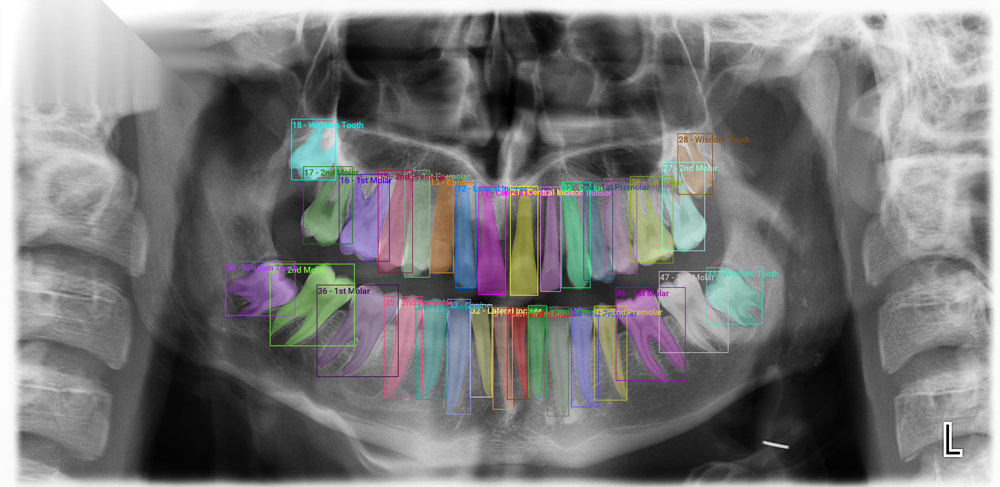

In [ ]:
# Create a mapping from class names to class indices


class_names = categories_df['name'].to_list()

# Add the background class
class_names = ['background'] + class_names
class_to_idx = {c: i for i, c in enumerate(class_names)}

# Instantiate the dataset using the defined transformations
train_dataset = DentalDataset(list(img_dict.keys()), annotation_df, img_dict, class_to_idx)

# Print the number of samples in the training dataset
pd.Series({
    'Training dataset size:': len(train_dataset),
}).to_frame().style.hide(axis='columns')
dataset_sample = train_dataset[1]



print([dataset_sample])
# Get colors for dataset sample
sample_colors = [int_colors[int(i.item())] for i in dataset_sample[1]['labels']]

# Annotate the sample image with segmentation masks
annotated_tensor = draw_segmentation_masks( 
    image=transforms.PILToTensor()(dataset_sample[0]),
    
    masks=dataset_sample[1]['masks'], 
    alpha=0.3, 
    colors=sample_colors
)

# Annotate the sample image with bounding boxes
annotated_tensor = draw_bboxes(
    image=annotated_tensor, 
    boxes=dataset_sample[1]['boxes'], 
    labels=[class_names[int(i.item())] for i in dataset_sample[1]['labels']], 
    colors=sample_colors
)

tensor_to_pil(annotated_tensor)


In [ ]:
print(class_to_idx)

{'background': 0, '11 - Central Incisor': 1, '12 - Lateral Incisor': 2, '13 - Canine': 3, '14 - 1st Premolar': 4, '15 - 2nd Premolar': 5, '16 - 1st Molar': 6, '17 - 2nd Molar': 7, '18 - Wisdom Tooth': 8, '21 - Central Incisor': 9, '22 - Lateral Incisor': 10, '23 - Canine': 11, '24 - 1st Premolar': 12, '25 - 2nd Premolar': 13, '26 - 1st Molar': 14, '27 - 2nd Molar': 15, '28 - Wisdom Tooth': 16, '31 - Central Incisor': 17, '32 - Lateral Incisor': 18, '33 - Canine': 19, '34 - 1st Premolar': 20, '35 - 2nd Premolar': 21, '36 - 1st Molar': 22, '37 - 2nd Molar': 23, '38 - Wisdom Tooth': 24, '41 - Central Incisor': 25, '42 - Lateral Incisor': 26, '43 - Canine': 27, '44 - 1st Premolar': 28, '45 - 2nd Premolar': 29, '46 - 1st Molar': 30, '47 - 2nd Molar': 31, '48 - Wisdom Tooth': 32, 'Bridge - Bridge': 33, 'Filling - Filling': 34, 'Implant - Implant': 35}


In [ ]:
# Import Python Standard Library dependencies
import datetime
from functools import partial
from glob import glob
import json
import math
import multiprocessing
import os
from pathlib import Path
import random
from typing import Any, Dict, Optional

# Import utility functions
from cjm_psl_utils.core import download_file, file_extract, get_source_code
from cjm_pil_utils.core import resize_img, get_img_files, stack_imgs
from cjm_pytorch_utils.core import pil_to_tensor, tensor_to_pil, get_torch_device, set_seed, denorm_img_tensor, move_data_to_device
from cjm_pandas_utils.core import markdown_to_pandas, convert_to_numeric, convert_to_string
from cjm_torchvision_tfms.core import ResizeMax, PadSquare, CustomRandomIoUCrop

# Import the distinctipy module
from distinctipy import distinctipy

# Import matplotlib for creating plots
import matplotlib.pyplot as plt

# Import numpy
import numpy as np

# Import the pandas package
import pandas as pd

# Set options for Pandas DataFrame display
pd.set_option('max_colwidth', None)  # Do not truncate the contents of cells in the DataFrame
pd.set_option('display.max_rows', None)  # Display all rows in the DataFrame
pd.set_option('display.max_columns', None)  # Display all columns in the DataFrame

# Import PIL for image manipulation
from PIL import Image, ImageDraw

# Import PyTorch dependencies
import torch
from torch.amp import autocast
from torch.cuda.amp import GradScaler
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchtnt.utils import get_module_summary
import torchvision
torchvision.disable_beta_transforms_warning()
from torchvision.tv_tensors import BoundingBoxes, Mask
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks
import torchvision.transforms.v2  as transforms
from torchvision.transforms.v2 import functional as TF

# Import Mask R-CNN
from torchvision.models.detection import maskrcnn_resnet50_fpn_v2, MaskRCNN
from torchvision.models.detection import MaskRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

# Import tqdm for progress bar
from tqdm.auto import tqdm

In [ ]:
# Set the seed for generating random numbers in PyTorch, NumPy, and Python's random module.
seed = 1234
set_seed(seed)
device = get_torch_device()
dtype = torch.double

# The name for the project
project_name = f"pytorch-mask-r-cnn-instance-segmentation_last"

# The path for the project folder
project_dir = Path(f"./{project_name}/")

# Create the project directory if it does not already exist
project_dir.mkdir(parents=True, exist_ok=True)

# Define path to store datasets
dataset_dir = Path("./AKUDENTALlast")
# Create the dataset directory if it does not exist
dataset_dir.mkdir(parents=True, exist_ok=True)

pd.Series({
    "Project Directory:": project_dir, 
    "Dataset Directory:": dataset_dir
}).to_frame().style.hide(axis='columns')

Project Directory:,pytorch-mask-r-cnn-instance-segmentation_last
Dataset Directory:,AKUDENTALlast


In [ ]:
# Initialize a Mask R-CNN model with pretrained weights
model = maskrcnn_resnet50_fpn_v2(weights='DEFAULT')

# Get the number of input features for the classifier
in_features_box = model.roi_heads.box_predictor.cls_score.in_features
in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels

# Get the numbner of output channels for the Mask Predictor
dim_reduced = model.roi_heads.mask_predictor.conv5_mask.out_channels

# Replace the box predictor
model.roi_heads.box_predictor = FastRCNNPredictor(in_channels=in_features_box, num_classes=len(class_names))

# Replace the mask predictor
model.roi_heads.mask_predictor = MaskRCNNPredictor(in_channels=in_features_mask, dim_reduced=dim_reduced, num_classes=len(class_names))

# Set the model's device and data type
model.to(device=device)

# Add attributes to store the device and model name for later reference
model.device = device
model.name = 'maskrcnn_resnet50_fpn_v2'

In [ ]:
# Get the list of image IDs
img_keys = list(img_dict.keys())
tufts_img_keys=list(img_dict_tufts.keys())

# Shuffle the image IDs
random.shuffle(img_keys)

# Define the percentage of the images that should be used for training
train_pct = 0.8
val_pct = 0.2

# Calculate the index at which to split the subset of image paths into training and validation sets
train_split = int(len(img_keys)*train_pct)
val_split = int(len(img_keys)*(train_pct+val_pct))

# Split the subset of image paths into training and validation sets
train_keys = img_keys[:train_split]
val_keys = img_keys[train_split:]

# Print the number of images in the training and validation sets
pd.Series({
    "Training Samples:": len(train_keys),
    "Validation Samples:": len(val_keys)
}).to_frame().style.hide(axis='columns')

Training Samples:,266
Validation Samples:,67


In [ ]:
# Compose transforms for data augmentation
# data_aug_tfms = transforms.Compose(
#     transforms=[
#         iou_crop,
#         transforms.ColorJitter(
#                 brightness = (0.875, 1.125),
#                 contrast = (0.5, 1.5),
#                 saturation = (0.5, 1.5),
#                 hue = (-0.05, 0.05),
#         ),
#         transforms.RandomGrayscale(),
#         transforms.RandomEqualize(),
#         transforms.RandomPosterize(bits=3, p=0.5),
        
#     ],
# )

# # Compose transforms to resize and pad input images
# resize_pad_tfm = transforms.Compose([
#     resize_max,
#     pad_square,
#     transforms.Resize([train_sz] * 2, antialias=True)
# ])

# # Compose transforms to sanitize bounding boxes and normalize input data
# final_tfms = transforms.Compose([
#     transforms.ToImage(),
#     transforms.ToDtype(torch.float32, scale=True),
#     transforms.SanitizeBoundingBoxes(),
# ])

# # Define the transformations for training and validation datasets
# train_tfms = transforms.Compose([
#     data_aug_tfms,
#     resize_pad_tfm,
#     final_tfms
# ])
# valid_tfms = transforms.Compose([resize_pad_tfm, final_tfms])
valid_tfms = transforms.Compose([
    transforms.Resize(512,max_size=1024),

    transforms.ToImage(),
    
    transforms.ToDtype(torch.float32, scale=True),
    transforms.SanitizeBoundingBoxes(),
    #transforms.RandomHorizontalFlip(p=1),
])
train_tfms = transforms.Compose([
    
    transforms.ToImage(),
    
    transforms.Resize(512,max_size=1024),
    transforms.ToDtype(torch.float32, scale=True),
    transforms.GaussianBlur(kernel_size=(3, 3), sigma=(0.5, 1.0)),  # Mild blur
   
    #transforms.Normalize(mean=[0.5], std=[0.5]),  # Normalize
    
    transforms.ToDtype(torch.float32, scale=True),
    transforms.SanitizeBoundingBoxes(),
    #transforms.RandomHorizontalFlip(p=1),
])

In [ ]:


# Instantiate the datasets using the defined transformations
train_dataset = DentalDataset(train_keys, annotation_df, img_dict, class_to_idx,train_tfms)
valid_dataset = DentalDataset(val_keys, annotation_df, img_dict, class_to_idx, valid_tfms)

# Print the number of samples in the training and validation datasets
pd.Series({
    'Training dataset size:': len(train_dataset),
    'Validation dataset size:': len(valid_dataset)}
).to_frame().style.hide(axis='columns')

Training dataset size:,266
Validation dataset size:,67


In [ ]:
# Generate timestamp for the training session (Year-Month-Day_Hour_Minute_Second)
timestamp = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

# Create a directory to store the checkpoints if it does not already exist
checkpoint_dir = Path(project_dir/f"{timestamp}")

# Create the checkpoint directory if it does not already exist
checkpoint_dir.mkdir(parents=True, exist_ok=True)

# The model checkpoint path
checkpoint_path = checkpoint_dir/f"{model.name}.pth"

# Create a color map and write it to a JSON file
color_map = {'items': [{'label': label, 'color': color} for label, color in zip(class_names, colors)]}
with open(f"{checkpoint_dir}/{dataset_dir.name}-colormap.json", "w") as file:
    json.dump(color_map, file)

# Print the name of the file that the color map was written to
print(f"{checkpoint_dir}/{dataset_dir.name}-colormap.json")

pytorch-mask-r-cnn-instance-segmentation_last\2025-04-29_12-48-12/AKUDENTALlast-colormap.json


In [ ]:
# Set the training batch size
bs = 4

# Set the number of worker processes for loading data.
num_workers = 0
train_dataset = DentalDataset(train_keys, annotation_df, img_dict, class_to_idx,train_tfms)
valid_dataset = DentalDataset(val_keys, annotation_df, img_dict, class_to_idx, valid_tfms)
# Define parameters for DataLoader
data_loader_params = {
    'batch_size': bs,  # Batch size for data loading
    'num_workers': num_workers,  # Number of subprocesses to use for data loading
    'persistent_workers': False,  # If True, the data loader will not shutdown the worker processes after a dataset has been consumed once. This allows to maintain the worker dataset instances alive.
    'pin_memory': 'cuda' in device,  # If True, the data loader will copy Tensors into CUDA pinned memory before returning them. Useful when using GPU.
    'pin_memory_device': device if 'cuda' in device else '',  # Specifies the device where the data should be loaded. Commonly set to use the GPU.
    'collate_fn': lambda batch: tuple(zip(*batch)),
}
# Create DataLoader for training data. Data is shuffled for every epoch.
train_dataloader = DataLoader(train_dataset, **data_loader_params, shuffle=True)

# Create DataLoader for validation data. Shuffling is not necessary for validation data.
valid_dataloader = DataLoader(valid_dataset, **data_loader_params)

# Print the number of batches in the training and validation DataLoaders
pd.Series({
    'Number of batches in train DataLoader:': len(train_dataloader),
    'Number of batches in validation DataLoader:': len(valid_dataloader)}
).to_frame().style.hide(axis='columns')

Number of batches in train DataLoader:,67
Number of batches in validation DataLoader:,17


In [24]:
import os
import csv
import numpy as np
import torch
from torch.utils.data import DataLoader
from torchvision.models.detection import maskrcnn_resnet50_fpn_v2
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from sklearn.model_selection import train_test_split
import pandas as pd
from engine import train_one_epoch, evaluate
from tqdm.auto import tqdm
import IPython.display

# Global parameters
num_epochs = 150
lr = 0.001
batch_size = 4
num_workers = 0
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

def train_model(model, train_loader, val_loader, device, num_epochs, lr, save_dir, epoch_ranges):
    """Train model once with saving at different epoch ranges."""
    os.makedirs(save_dir, exist_ok=True)
    
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr)
    lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=10, factor=0.5, verbose=True)
    
    log_file = os.path.join(save_dir, "training_log.csv")
    with open(log_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow([
            "Epoch", "Train Loss", "Train Loss Box", "Train Loss Mask",
            "Val Bbox mAP", "Val Bbox mAP_50", "Val Bbox mAP_75",
            "Val Segm mAP", "Val Segm mAP_50", "Val Segm mAP_75", "LR"
        ])
    
    best_maps = {f"{start}-{end}": 0.0 for start, end in epoch_ranges}
    val_epochs = []
    val_bbox_maps = []
    val_segm_maps = []
    
    for epoch in range(num_epochs):
        if epoch % 5 == 0:
            IPython.display.clear_output(wait=True)
            print(f"Training - Epoch {epoch + 1}/{num_epochs}")
        
        train_metrics = train_one_epoch(model, optimizer, train_loader, device, epoch, print_freq=10)
        coco_evaluator = evaluate(model, val_loader, device=device)
        
        bbox_stats = coco_evaluator.coco_eval['bbox'].stats if 'bbox' in coco_evaluator.coco_eval else [0]*12
        segm_stats = coco_evaluator.coco_eval['segm'].stats if 'segm' in coco_evaluator.coco_eval else [0]*12
        
        lr_scheduler.step(1.0 - segm_stats[0])
        
        val_epochs.append(epoch + 1)
        val_bbox_maps.append(bbox_stats[0])
        val_segm_maps.append(segm_stats[0])
        
        with open(log_file, "a", newline="") as f:
            writer = csv.writer(f)
            writer.writerow([
                epoch + 1,
                train_metrics.meters['loss'].global_avg,
                train_metrics.meters['loss_box_reg'].global_avg,
                train_metrics.meters['loss_mask'].global_avg,
                bbox_stats[0], bbox_stats[1], bbox_stats[2],
                segm_stats[0], segm_stats[1], segm_stats[2],
                optimizer.param_groups[0]['lr']
            ])
        
        for start, end in epoch_ranges:
            range_key = f"{start}-{end}"
            if start <= epoch < end:
                if segm_stats[0] > best_maps[range_key]:
                    best_maps[range_key] = segm_stats[0]
                    model_path = os.path.join(save_dir, f"best_model_{range_key}.pth")
                    torch.save(model.state_dict(), model_path)
                    print(f"Saved best model for range {range_key} with Segm mAP: {segm_stats[0]:.4f}")
        
        print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_metrics.meters['loss'].global_avg:.4f}")
        print(f"Val Bbox mAP: {bbox_stats[0]:.4f} | mAP50: {bbox_stats[1]:.4f} | mAP75: {bbox_stats[2]:.4f}")
        print(f"Val Segm mAP: {segm_stats[0]:.4f} | mAP50: {segm_stats[1]:.4f} | mAP75: {segm_stats[2]:.4f}")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")
        print("--------------------------")
    
    final_model_path = os.path.join(save_dir, "final_model.pth")
    torch.save(model.state_dict(), final_model_path)
    print(f"Saved final model after {num_epochs} epochs")
    
    val_results_file = os.path.join(save_dir, "validation_metrics.csv")
    with open(val_results_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(["Epoch", "Bbox mAP", "Segm mAP"])
        for i in range(len(val_epochs)):
            writer.writerow([val_epochs[i], val_bbox_maps[i], val_segm_maps[i]])
    
    return best_maps, val_epochs, val_bbox_maps, val_segm_maps

def test_model(model, test_loader, device, model_path, results_dir, suffix=""):
    """Evaluate model on test set and save results."""
    model.load_state_dict(torch.load(model_path))
    model.eval()
    
    print(f"Evaluating model on test set...")
    coco_evaluator = evaluate(model, test_loader, device=device)
    
    # Get evaluation statistics
    bbox_stats = coco_evaluator.coco_eval['bbox'].stats 
    segm_stats = coco_evaluator.coco_eval['segm'].stats 
    
    test_results = {
        "test_bbox_mAP": bbox_stats[0],
        "test_bbox_mAP_50": bbox_stats[1],
        "test_bbox_mAP_75": bbox_stats[2],
        "test_segm_mAP": segm_stats[0],
        "test_segm_mAP_50": segm_stats[1],
        "test_segm_mAP_75": segm_stats[2]
    }
    
    results_file = os.path.join(results_dir, f"test_results{suffix}.csv")
    with open(results_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(test_results.keys())
        writer.writerow(test_results.values())
    
    print(f"Test Results{suffix}:")
    print(f"Test Bbox mAP: {bbox_stats[0]:.4f} | mAP50: {bbox_stats[1]:.4f} | mAP75: {bbox_stats[2]:.4f}")
    print(f"Test Segm mAP: {segm_stats[0]:.4f} | mAP50: {segm_stats[1]:.4f} | mAP75: {segm_stats[2]:.4f}")
    
    return test_results

def get_maskrcnn_model(num_classes, device):
    """Initialize a Mask R-CNN model."""
    model = maskrcnn_resnet50_fpn_v2(weights="DEFAULT")
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask, hidden_layer, num_classes)
    model.to(device)
    return model
    
def filter_dataframe(annotation_df, valid_class_names):
    """Filter annotations to include only the specified class names."""
    filtered_rows = []
    for idx, row in annotation_df.iterrows():
        valid_segmentations = []
        valid_labels = []
        valid_bboxes = []
        for seg, label, bbox in zip(row['segmentations'], row['labels'], row['bboxes']):
            if label in valid_class_names:
                valid_segmentations.append(seg)
                valid_labels.append(label)
                valid_bboxes.append(bbox)
        
        if valid_segmentations:  # Only include rows with valid annotations
            filtered_rows.append({
                'file_name': idx,
                'segmentations': valid_segmentations,
                'labels': valid_labels,
                'bboxes': valid_bboxes,
                'height': row['height'],
                'width': row['width']
            })
    
    if not filtered_rows:
        raise ValueError("No valid annotations remain after filtering")
    
    filtered_df = pd.DataFrame(filtered_rows).set_index('file_name')
    return filtered_df

def create_unified_class_to_idx(annotation_df, annotation_df_tufts):
    """Create a unified class_to_idx dictionary from filtered datasets."""
    labels_main = set()
    labels_tufts = set()
    
    # Process main dataset annotations
    for labels in annotation_df['labels']:
        for label in labels:
            labels_main.add(label)
    
    # Process Tufts dataset annotations
    for labels in annotation_df_tufts['labels']:
        for label in labels:
            labels_tufts.add(label)
    
    # Combine and sort labels
    all_labels = sorted(labels_main.union(labels_tufts))
    
    # Create class_to_idx (background is 0, classes start from 1)
    class_to_idx = {label: idx + 1 for idx, label in enumerate(all_labels)}
    class_names = ['background'] + all_labels
    
    return class_to_idx, class_names

def run_training(
    img_keys, img_key_tufts, annotation_df, annotation_df_tufts,
    img_dict, img_dict_tufts, train_tfms, valid_tfms,
    val_split_ratio=0.5, base_save_dir='experiments', model_name='maskrcnn'
):
    """Run training with properly filtered DataFrames for 35 common classes."""
    model_save_dir = os.path.join(base_save_dir, model_name)
    os.makedirs(model_save_dir, exist_ok=True)
    
    test_results_dir = os.path.join(model_save_dir, "test_results")
    os.makedirs(test_results_dir, exist_ok=True)
    
    # Get the original 35 class names (excluding background)
    valid_class_names = [
        "11 - Central Incisor", "12 - Lateral Incisor", "13 - Canine", 
        "14 - 1st Premolar", "15 - 2nd Premolar", "16 - 1st Molar", 
        "17 - 2nd Molar", "18 - 3rd Molar", "21 - Central Incisor", 
        "22 - Lateral Incisor", "23 - Canine", "24 - 1st Premolar", 
        "25 - 2nd Premolar", "26 - 1st Molar", "27 - 2nd Molar", 
        "28 - 3rd Molar", "41 - Central Incisor", "42 - Lateral Incisor", 
        "43 - Canine", "44 - 1st Premolar", "45 - 2nd Premolar", 
        "46 - 1st Molar", "47 - 2nd Molar", "48 - 3rd Molar", 
        "31 - Central Incisor", "32 - Lateral Incisor", "33 - Canine", 
        "34 - 1st Premolar", "35 - 2nd Premolar", "36 - 1st Molar", 
        "37 - 2nd Molar", "38 - 3rd Molar", "Bridge", "Filling - Crown", 
        "Implant"
    ]
    
    # Filter both DataFrames to include only the 35 common classes
    annotation_df = filter_dataframe(annotation_df, valid_class_names)
    annotation_df_tufts = filter_dataframe(annotation_df_tufts, valid_class_names)
    
    # Update img_keys and img_key_tufts to only include images with valid annotations
    img_keys = [k for k in img_keys if k in annotation_df.index]
    img_key_tufts = [k for k in img_key_tufts if k in annotation_df_tufts.index]
    
    # Create class_to_idx mapping (background is 0, classes start from 1)
    class_to_idx = {label: idx + 1 for idx, label in enumerate(valid_class_names)}
    class_names = ['background'] + valid_class_names
    
    val_keys, final_test_keys = train_test_split(img_key_tufts, test_size=val_split_ratio, random_state=42)
    print(f"Split sizes - Train: {len(img_keys)}, Validation: {len(val_keys)}, Test: {len(final_test_keys)}")
    
    train_loader_params = {
        'batch_size': batch_size,
        'num_workers': num_workers,
        'shuffle': True,
        'drop_last': True,
        'collate_fn': lambda batch: tuple(zip(*batch)),
    }
    
    eval_loader_params = {
        'batch_size': 1,
        'num_workers': num_workers,
        'shuffle': False,
        'drop_last': False,
        'collate_fn': lambda batch: tuple(zip(*batch)),
    }
    
    train_dataset = DentalDataset(img_keys, annotation_df, img_dict, class_to_idx, train_tfms)
    val_dataset = DentalDataset(val_keys, annotation_df_tufts, img_dict_tufts, class_to_idx, valid_tfms)
    final_test_dataset = DentalDataset(final_test_keys, annotation_df_tufts, img_dict_tufts, class_to_idx, valid_tfms)
    
    train_loader = DataLoader(train_dataset, **train_loader_params)
    val_loader = DataLoader(val_dataset, **eval_loader_params)
    final_test_loader = DataLoader(final_test_dataset, **eval_loader_params)
    
    save_epochs_ranges = [(0, 50), (50, 100), (100, 150)]
    
    model = get_maskrcnn_model(num_classes=len(class_names), device=device)
    
    print("Starting model training...")
    best_maps, val_epochs, val_bbox_maps, val_segm_maps = train_model(
        model, train_loader, val_loader, device, num_epochs, lr, model_save_dir, save_epochs_ranges
    )
    
    for start, end in save_epochs_ranges:
        range_key = f"{start}-{end}"
        model_path = os.path.join(model_save_dir, f"best_model_{range_key}.pth")
        if os.path.exists(model_path):
            print(f"\nTesting best model from epoch range {range_key}...")
            test_model(model, final_test_loader, device, model_path, test_results_dir, f"_{range_key}")
    
    final_model_path = os.path.join(model_save_dir, "final_model.pth")
    if os.path.exists(final_model_path):
        print("\nTesting final model...")
        test_model(model, final_test_loader, device, final_model_path, test_results_dir, "_final")
    
    print("\nTraining and testing completed. Results saved in:", model_save_dir)
    return model

# Example usage
model = run_training(
    img_keys=img_keys,
    img_key_tufts=tufts_img_keys,
    annotation_df=annotation_df,
    annotation_df_tufts=annotation_df_tufts,
    img_dict=img_dict,
    img_dict_tufts=img_dict_tufts,
    train_tfms=train_tfms,
    valid_tfms=valid_tfms,
    val_split_ratio=0.5,
    base_save_dir='experiments_tufts_last',
    model_name='maskrcnn'
)

Training - Epoch 51/150
Epoch: [50]  [ 0/83]  eta: 0:04:18  lr: 0.000250  loss: 0.1271 (0.1271)  loss_classifier: 0.0183 (0.0183)  loss_box_reg: 0.0220 (0.0220)  loss_mask: 0.0842 (0.0842)  loss_objectness: 0.0001 (0.0001)  loss_rpn_box_reg: 0.0025 (0.0025)  time: 3.1137  data: 2.2855  max mem: 10252
Epoch: [50]  [10/83]  eta: 0:04:13  lr: 0.000250  loss: 0.1285 (0.1284)  loss_classifier: 0.0194 (0.0197)  loss_box_reg: 0.0221 (0.0224)  loss_mask: 0.0842 (0.0845)  loss_objectness: 0.0000 (0.0000)  loss_rpn_box_reg: 0.0016 (0.0018)  time: 3.4757  data: 2.7951  max mem: 10252
Epoch: [50]  [20/83]  eta: 0:03:39  lr: 0.000250  loss: 0.1287 (0.1288)  loss_classifier: 0.0192 (0.0192)  loss_box_reg: 0.0224 (0.0231)  loss_mask: 0.0842 (0.0847)  loss_objectness: 0.0000 (0.0000)  loss_rpn_box_reg: 0.0016 (0.0018)  time: 3.5055  data: 2.8261  max mem: 10252
Epoch: [50]  [30/83]  eta: 0:03:01  lr: 0.000250  loss: 0.1281 (0.1283)  loss_classifier: 0.0192 (0.0193)  loss_box_reg: 0.0239 (0.0230)  loss

KeyboardInterrupt: 

In [ ]:
import os
import csv
import numpy as np
import torch
from torch.utils.data import DataLoader
from torchvision.models.detection import maskrcnn_resnet50_fpn_v2
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from sklearn.model_selection import KFold, train_test_split
from engine import train_one_epoch, evaluate
from tqdm.auto import tqdm
import IPython.display

# Set random seed for reproducibility
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

# Define hyperparameters
num_folds = 5
num_epochs = 150
lr = 0.001
batch_size = 4
num_workers = 0
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

# Define epoch ranges for saving models
save_epochs_ranges = [(0, 50), (50, 100), (100, 150)]

# Main experiment directory
experiment_dir = 'tufts_5fold_experiment_fixed'
os.makedirs(experiment_dir, exist_ok=True)

# Directory for validation results
validation_results_dir = os.path.join(experiment_dir, "validation_results")
os.makedirs(validation_results_dir, exist_ok=True)

def get_maskrcnn_model(num_classes, device):
    """Initialize a Mask R-CNN model with pretrained weights."""
    model = maskrcnn_resnet50_fpn_v2(weights='DEFAULT')
    
    # Get the number of input features for the classifier
    in_features_box = model.roi_heads.box_predictor.cls_score.in_features
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    
    # Get the number of output channels for the Mask Predictor
    dim_reduced = model.roi_heads.mask_predictor.conv5_mask.out_channels
    
    # Replace the box predictor
    model.roi_heads.box_predictor = FastRCNNPredictor(in_channels=in_features_box, num_classes=num_classes)
    
    # Replace the mask predictor
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_channels=in_features_mask, dim_reduced=dim_reduced, num_classes=num_classes)
    
    # Set the model's device
    model.to(device=device)
    
    # Add attributes to store the device and model name for later reference
    model.device = device
    model.name = 'maskrcnn_resnet50_fpn_v2'
    
    return model

def train_fold(model, train_loader, val_loader, device, num_epochs, lr, fold_dir, epoch_ranges):
    """Train model for a single fold with saving at different epoch ranges."""
    # Create fold directory
    os.makedirs(fold_dir, exist_ok=True)
    
    # Define optimizer and learning rate scheduler
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr)
    lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=10, factor=0.5, verbose=True)
    
    # Log file
    log_file = os.path.join(fold_dir, "training_log.csv")
    with open(log_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow([
            "Epoch", "Train Loss", "Train Loss Box", "Train Loss Mask",
            "Val Bbox mAP", "Val Bbox mAP_50", "Val Bbox mAP_75",
            "Val Segm mAP", "Val Segm mAP_50", "Val Segm mAP_75", "LR"
        ])
    
    # Initialize best metrics for each epoch range
    best_maps = {f"{start}-{end}": 0.0 for start, end in epoch_ranges}
    
    # Initialize validation metrics lists
    val_epochs = []
    val_bbox_maps = []
    val_segm_maps = []
    
    # Training loop
    for epoch in range(num_epochs):
        # Clear output every 5 epochs
        if epoch % 5 == 0:
            IPython.display.clear_output(wait=True)
            print(f"Training Fold - Epoch {epoch + 1}/{num_epochs}")
        
        # Train for one epoch
        train_metrics = train_one_epoch(model, optimizer, train_loader, device, epoch, print_freq=10)
        
        # Evaluate on the validation set
        coco_evaluator = evaluate(model, val_loader, device=device)
        
        # Extract bbox and segm stats
        bbox_stats = coco_evaluator.coco_eval['bbox'].stats if 'bbox' in coco_evaluator.coco_eval else [0]*12
        segm_stats = coco_evaluator.coco_eval['segm'].stats if 'segm' in coco_evaluator.coco_eval else [0]*12
        
        # Update learning rate scheduler
        lr_scheduler.step(1.0 - segm_stats[0])  # Use 1-mAP as a "loss" metric for the scheduler
        
        # Store validation metrics
        val_epochs.append(epoch + 1)
        val_bbox_maps.append(bbox_stats[0])
        val_segm_maps.append(segm_stats[0])
        
        # Log metrics
        with open(log_file, "a", newline="") as f:
            writer = csv.writer(f)
            writer.writerow([
                epoch + 1,
                train_metrics.meters['loss'].global_avg,
                train_metrics.meters['loss_box_reg'].global_avg,
                train_metrics.meters['loss_mask'].global_avg,
                bbox_stats[0],  # Bbox mAP (IoU=0.50:0.95)
                bbox_stats[1],  # Bbox mAP_50
                bbox_stats[2],  # Bbox mAP_75
                segm_stats[0],  # Segm mAP (IoU=0.50:0.95)
                segm_stats[1],  # Segm mAP_50
                segm_stats[2],  # Segm mAP_75
                optimizer.param_groups[0]['lr']
            ])
        
        # Save best model for each epoch range
        for start, end in epoch_ranges:
            range_key = f"{start}-{end}"
            if start <= epoch < end:
                if segm_stats[0] > best_maps[range_key]:
                    best_maps[range_key] = segm_stats[0]
                    model_path = os.path.join(fold_dir, f"best_model_{range_key}.pth")
                    torch.save(model.state_dict(), model_path)
                    print(f"Saved best model for range {range_key} with Segm mAP: {segm_stats[0]:.4f}")
        
        # Print metrics
        print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_metrics.meters['loss'].global_avg:.4f}")
        print(f"Val Bbox mAP: {bbox_stats[0]:.4f} | mAP50: {bbox_stats[1]:.4f} | mAP75: {bbox_stats[2]:.4f}")
        print(f"Val Segm mAP: {segm_stats[0]:.4f} | mAP50: {segm_stats[1]:.4f} | mAP75: {segm_stats[2]:.4f}")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")
        print("--------------------------")
    
    # Save validation results
    val_results_file = os.path.join(fold_dir, "validation_metrics.csv")
    with open(val_results_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(["Epoch", "Bbox mAP", "Segm mAP"])
        for i in range(len(val_epochs)):
            writer.writerow([val_epochs[i], val_bbox_maps[i], val_segm_maps[i]])
    
    # Return the best mAP values for each range
    return best_maps, val_epochs, val_bbox_maps, val_segm_maps

def test_model(model, test_loader, device, fold_dir, model_path, epoch_range):
    """Evaluate model on test set and save results."""
    # Load the best model weights
    model.load_state_dict(torch.load(model_path))
    model.eval()
    
    # Evaluate on the test set
    print(f"Evaluating model from range {epoch_range} on test set...")
    coco_evaluator = evaluate(model, test_loader, device=device)
    
    # Extract bbox and segm stats
    bbox_stats = coco_evaluator.coco_eval['bbox'].stats 
    segm_stats = coco_evaluator.coco_eval['segm'].stats 
    
    # Log test results
    test_results = {
        "test_bbox_mAP": bbox_stats[0],
        "test_bbox_mAP_50": bbox_stats[1],
        "test_bbox_mAP_75": bbox_stats[2],
        "test_segm_mAP": segm_stats[0],
        "test_segm_mAP_50": segm_stats[1],
        "test_segm_mAP_75": segm_stats[2]
    }
    
    # Save test results
    results_file = os.path.join(fold_dir, f"test_results_{epoch_range.replace('-', '_')}.csv")
    with open(results_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(test_results.keys())
        writer.writerow(test_results.values())
    
    # Print metrics
    print(f"Test Results for {epoch_range}:")
    print(f"Test Bbox mAP: {bbox_stats[0]:.4f} | mAP50: {bbox_stats[1]:.4f} | mAP75: {bbox_stats[2]:.4f}")
    print(f"Test Segm mAP: {segm_stats[0]:.4f} | mAP50: {segm_stats[1]:.4f} | mAP75: {segm_stats[2]:.4f}")
    
    return test_results

# Main cross-validation function
def run_cross_validation(img_keys, annotation_df, img_dict, class_to_idx, class_names, train_tfms, valid_tfms, DentalDataset):
    """Run 5-fold cross-validation with model saving at different epoch ranges and test set evaluation."""
    # Create a directory for test evaluation results
    test_results_dir = os.path.join(experiment_dir, "test_results")
    os.makedirs(test_results_dir, exist_ok=True)
    
    # Initialize summary CSV for all folds and ranges
    summary_file = os.path.join(test_results_dir, "all_folds_summary.csv")
    with open(summary_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow([
            "Fold", "Epoch Range", 
            "Test Bbox mAP", "Test Bbox mAP_50", "Test Bbox mAP_75",
            "Test Segm mAP", "Test Segm mAP_50", "Test Segm mAP_75"
        ])
    
    # Initialize validation summary for all folds
    val_summary_file = os.path.join(validation_results_dir, "all_folds_val_summary.csv")
    with open(val_summary_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow([
            "Fold", "Final Val Bbox mAP", "Final Val Segm mAP", 
            "Best Val Bbox mAP", "Best Val Segm mAP", 
            "Best Bbox Epoch", "Best Segm Epoch"
        ])
    
    # Define data loader parameters
    data_loader_params = {
        'batch_size': batch_size,
        'num_workers': num_workers,
        'persistent_workers': False,
        'pin_memory': 'cuda' in device,
        'pin_memory_device': device if 'cuda' in device else '',
        'collate_fn': lambda batch: tuple(zip(*batch)),
    }
    
    # Set up KFold with 5 folds, shuffling, and seed 42
    kf = KFold(n_splits=num_folds, shuffle=True, random_state=seed)
    
    # Range dictionaries to store aggregated results
    range_results = {f"{start}-{end}": [] for start, end in save_epochs_ranges}
    
    # Cross-validation loop
    for fold, (train_idx, val_test_idx) in enumerate(kf.split(img_keys)):

         
        print(f"\nStarting Fold {fold + 1}/{num_folds}")
        
        # Split val_test_idx into validation and test sets (50% each)
        val_idx, test_idx = train_test_split(val_test_idx, test_size=0.5, random_state=seed)
        
        # Get train, validation, and test keys for this fold
        train_keys = [img_keys[i] for i in train_idx]
        val_keys = [img_keys[i] for i in val_idx]
        test_keys = [img_keys[i] for i in test_idx]
        
        print(f"Split sizes - Train: {len(train_keys)}, Validation: {len(val_keys)}, Test: {len(test_keys)}")
        
        # Create datasets for this fold
        train_dataset = DentalDataset(train_keys, annotation_df, img_dict, class_to_idx, train_tfms)
        val_dataset = DentalDataset(val_keys, annotation_df, img_dict, class_to_idx, valid_tfms)
        test_dataset = DentalDataset(test_keys, annotation_df, img_dict, class_to_idx, valid_tfms)
        
        # Create data loaders
        train_loader = DataLoader(train_dataset, **data_loader_params, shuffle=True)
        val_loader = DataLoader(val_dataset, **data_loader_params)
        test_loader = DataLoader(test_dataset, **data_loader_params)
        
        # Initialize a new model for this fold
        model = get_maskrcnn_model(num_classes=len(class_names), device=device)
        
        # Define fold-specific directory
        fold_dir = os.path.join(experiment_dir, f'fold_{fold + 1}')
        os.makedirs(fold_dir, exist_ok=True)
        
        # Train the model for this fold
        best_maps, val_epochs, val_bbox_maps, val_segm_maps = train_fold(
            model, train_loader, val_loader, device, num_epochs, lr, fold_dir, save_epochs_ranges
        )
        
        # Get validation metrics for summary
        final_bbox_map = val_bbox_maps[-1]
        final_segm_map = val_segm_maps[-1]
        best_bbox_map = max(val_bbox_maps)
        best_segm_map = max(val_segm_maps)
        best_bbox_epoch = val_epochs[val_bbox_maps.index(best_bbox_map)]
        best_segm_epoch = val_epochs[val_segm_maps.index(best_segm_map)]
        
        # Write validation summary
        with open(val_summary_file, "a", newline="") as f:
            writer = csv.writer(f)
            writer.writerow([
                fold + 1, final_bbox_map, final_segm_map,
                best_bbox_map, best_segm_map,
                best_bbox_epoch, best_segm_epoch
            ])
        
        # Test the model for each epoch range
        for start, end in save_epochs_ranges:
            range_key = f"{start}-{end}"
            model_path = os.path.join(fold_dir, f"best_model_{range_key}.pth")
            
            if os.path.exists(model_path):
                # Evaluate on the test set
                test_results = test_model(model, test_loader, device, fold_dir, model_path, range_key)
                range_results[range_key].append(test_results)
                
                # Write to summary file
                with open(summary_file, "a", newline="") as f:
                    writer = csv.writer(f)
                    writer.writerow([
                        fold + 1, range_key,
                        test_results["test_bbox_mAP"], test_results["test_bbox_mAP_50"], test_results["test_bbox_mAP_75"],
                        test_results["test_segm_mAP"], test_results["test_segm_mAP_50"], test_results["test_segm_mAP_75"]
                    ])
            else:
                print(f"Warning: No model found for range {range_key} in fold {fold + 1}")
        
        print(f"Fold {fold + 1} completed. Best metrics: {best_maps}")
        
        # Clean up GPU memory
        torch.cuda.empty_cache()
    
    # Calculate and save average results across folds for each range
    avg_results_file = os.path.join(test_results_dir, "average_results.csv")
    with open(avg_results_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow([
            "Epoch Range", 
            "Avg Bbox mAP", "Avg Bbox mAP_50", "Avg Bbox mAP_75",
            "Avg Segm mAP", "Avg Segm mAP_50", "Avg Segm mAP_75",
            "Std Dev Segm mAP"
        ])
        
        for range_key, results_list in range_results.items():
            if results_list:
                avg_bbox_map = np.mean([r["test_bbox_mAP"] for r in results_list])
                avg_bbox_map50 = np.mean([r["test_bbox_mAP_50"] for r in results_list])
                avg_bbox_map75 = np.mean([r["test_bbox_mAP_75"] for r in results_list])
                avg_segm_map = np.mean([r["test_segm_mAP"] for r in results_list])
                avg_segm_map50 = np.mean([r["test_segm_mAP_50"] for r in results_list])
                avg_segm_map75 = np.mean([r["test_segm_mAP_75"] for r in results_list])
                std_segm_map = np.std([r["test_segm_mAP"] for r in results_list])
                
                writer.writerow([
                    range_key,
                    avg_bbox_map, avg_bbox_map50, avg_bbox_map75,
                    avg_segm_map, avg_segm_map50, avg_segm_map75,
                    std_segm_map
                ])
                
                print(f"\nAverage Results for Epoch Range {range_key}:")
                print(f"Avg Bbox mAP: {avg_bbox_map:.4f}, mAP50: {avg_bbox_map50:.4f}, mAP75: {avg_bbox_map75:.4f}")
                print(f"Avg Segm mAP: {avg_segm_map:.4f} (±{std_segm_map:.4f}), mAP50: {avg_segm_map50:.4f}, mAP75: {avg_segm_map75:.4f}")
    
    # Plot and save validation curves for all folds
    try:
        import matplotlib.pyplot as plt
        plt.figure(figsize=(12, 8))
        
        # Load all validation data from CSV files
        for fold in range(1, num_folds + 1):
            val_file = os.path.join(experiment_dir, f'fold_{fold}', "validation_metrics.csv")
            if os.path.exists(val_file):
                val_data = np.genfromtxt(val_file, delimiter=',', names=True)
                plt.plot(val_data['Epoch'], val_data['Segm_mAP'], label=f'Fold {fold}')
        
        plt.title('Validation Segmentation mAP Across Folds')
        plt.xlabel('Epoch')
        plt.ylabel('Segmentation mAP')
        plt.legend()
        plt.grid(True)
        plt.savefig(os.path.join(validation_results_dir, "validation_curves.png"))
        plt.close()
    except Exception as e:
        print(f"Could not create validation plots: {e}")
    
    print("\n5-Fold Cross-Validation completed. Results saved in:", experiment_dir)

# Example usage:
run_cross_validation(img_keys, annotation_df, img_dict, class_to_idx, class_names, train_tfms, valid_tfms, DentalDataset)

Training Fold - Epoch 1/150


KeyboardInterrupt: 

In [25]:
#torch.save(model.state_dict(), checkpoint_path)
valid_tfms2 = transforms.Compose([
    transforms.Resize(512),
    transforms.ToImage(),
    transforms.ToDtype(torch.float32, scale=True),
    transforms.SanitizeBoundingBoxes(),
    #transforms.RandomHorizontalFlip(p=1),
])

valid_dataset = DentalDataset(val_keys, annotation_df, img_dict, class_to_idx,valid_tfms2)
data_loader_paras = {
    'batch_size': 4,  # Batch size for data loading
    'num_workers': num_workers,  # Number of subprocesses to use for data loading
    'persistent_workers': False,  # If True, the data loader will not shutdown the worker processes after a dataset has been consumed once. This allows to maintain the worker dataset instances alive.
    'pin_memory': 'cuda' in device,  # If True, the data loader will copy Tensors into CUDA pinned memory before returning them. Useful when using GPU.
    'pin_memory_device': device if 'cuda' in device else '',  # Specifies the device where the data should be loaded. Commonly set to use the GPU.
    'collate_fn': lambda batch: tuple(zip(*batch)),
}
# Create DataLoader for training data. Data is shuffled for every epoch.
#train_dataloader = DataLoader(train_dataset, **data_loader_params, shuffle=True)

# Create DataLoader for validation data. Shuffling is not necessary for validation data.
valid_dataloader = DataLoader(valid_dataset, **data_loader_params)
loss=evaluate(model, valid_dataloader, device=device)
print(loss)

creating index...
index created!
Test:  [ 0/17]  eta: 0:01:37  model_time: 1.0640 (1.0640)  evaluator_time: 0.5901 (0.5901)  time: 5.7470  data: 4.0909  max mem: 9581
Test:  [16/17]  eta: 0:00:05  model_time: 1.1532 (1.1519)  evaluator_time: 0.6301 (0.6359)  time: 5.9375  data: 4.1469  max mem: 9581
Test: Total time: 0:01:40 (5.9376 s / it)
Averaged stats: model_time: 1.1532 (1.1519)  evaluator_time: 0.6301 (0.6359)
Accumulating evaluation results...
DONE (t=0.18s).
Accumulating evaluation results...
DONE (t=0.17s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | max

In [25]:
import os
import csv
import numpy as np
import torch
from torch.utils.data import DataLoader
from torchvision.models.detection import maskrcnn_resnet50_fpn_v2
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from sklearn.model_selection import KFold, train_test_split
from engine import train_one_epoch, evaluate
from tqdm.auto import tqdm
import IPython.display

# Set random seed for reproducibility
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

# Define hyperparameters
num_folds = 5
num_epochs = 150
lr = 0.001
batch_size = 4
num_workers = 0
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

# Define epoch ranges for saving models
save_epochs_ranges = [(0, 50), (50, 100), (100, 150)]

# Main experiment directory
experiment_dir = '5fold_experiment_onlyval_fixed'
os.makedirs(experiment_dir, exist_ok=True)

# Directory for validation results
validation_results_dir = os.path.join(experiment_dir, "validation_results")
os.makedirs(validation_results_dir, exist_ok=True)

def get_maskrcnn_model(num_classes, device):
    """Initialize a Mask R-CNN model with pretrained weights."""
    model = maskrcnn_resnet50_fpn_v2(weights='DEFAULT')
    
    # Get the number of input features for the classifier
    in_features_box = model.roi_heads.box_predictor.cls_score.in_features
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    
    # Get the number of output channels for the Mask Predictor
    dim_reduced = model.roi_heads.mask_predictor.conv5_mask.out_channels
    
    # Replace the box predictor
    model.roi_heads.box_predictor = FastRCNNPredictor(in_channels=in_features_box, num_classes=num_classes)
    
    # Replace the mask predictor
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_channels=in_features_mask, dim_reduced=dim_reduced, num_classes=num_classes)
    
    # Set the model's device
    model.to(device=device)
    
    # Add attributes to store the device and model name for later reference
    model.device = device
    model.name = 'maskrcnn_resnet50_fpn_v2'
    
    return model

def train_fold(model, train_loader, val_loader, device, num_epochs, lr, fold_dir, epoch_ranges):
    """Train model for a single fold with saving at different epoch ranges."""
    # Create fold directory
    os.makedirs(fold_dir, exist_ok=True)
    
    # Define optimizer and learning rate scheduler
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr)
    lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=10, factor=0.5, verbose=True)
    
    # Log file
    log_file = os.path.join(fold_dir, "training_log.csv")
    with open(log_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow([
            "Epoch", "Train Loss", "Train Loss Box", "Train Loss Mask",
            "Val Bbox mAP", "Val Bbox mAP_50", "Val Bbox mAP_75",
            "Val Segm mAP", "Val Segm mAP_50", "Val Segm mAP_75", "LR"
        ])
    
    # Initialize best metrics for each epoch range
    best_maps = {f"{start}-{end}": 0.0 for start, end in epoch_ranges}
    
    # Initialize validation metrics lists
    val_epochs = []
    val_bbox_maps = []
    val_segm_maps = []
    
    # Training loop
    for epoch in range(num_epochs):
        # Clear output every 5 epochs
        if epoch % 5 == 0:
            IPython.display.clear_output(wait=True)
            print(f"Training Fold - Epoch {epoch + 1}/{num_epochs}")
        
        # Train for one epoch
        train_metrics = train_one_epoch(model, optimizer, train_loader, device, epoch, print_freq=10)
        
        # Evaluate on the validation set
        coco_evaluator = evaluate(model, val_loader, device=device)
        
        # Extract bbox and segm stats
        bbox_stats = coco_evaluator.coco_eval['bbox'].stats if 'bbox' in coco_evaluator.coco_eval else [0]*12
        segm_stats = coco_evaluator.coco_eval['segm'].stats if 'segm' in coco_evaluator.coco_eval else [0]*12
        
        # Update learning rate scheduler
        lr_scheduler.step(1.0 - segm_stats[0])  # Use 1-mAP as a "loss" metric for the scheduler
        
        # Store validation metrics
        val_epochs.append(epoch + 1)
        val_bbox_maps.append(bbox_stats[0])
        val_segm_maps.append(segm_stats[0])
        
        # Log metrics
        with open(log_file, "a", newline="") as f:
            writer = csv.writer(f)
            writer.writerow([
                epoch + 1,
                train_metrics.meters['loss'].global_avg,
                train_metrics.meters['loss_box_reg'].global_avg,
                train_metrics.meters['loss_mask'].global_avg,
                bbox_stats[0],  # Bbox mAP (IoU=0.50:0.95)
                bbox_stats[1],  # Bbox mAP_50
                bbox_stats[2],  # Bbox mAP_75
                segm_stats[0],  # Segm mAP (IoU=0.50:0.95)
                segm_stats[1],  # Segm mAP_50
                segm_stats[2],  # Segm mAP_75
                optimizer.param_groups[0]['lr']
            ])
        
        # Save best model for each epoch range
        for start, end in epoch_ranges:
            range_key = f"{start}-{end}"
            if start <= epoch < end:
                if segm_stats[0] > best_maps[range_key]:
                    best_maps[range_key] = segm_stats[0]
                    model_path = os.path.join(fold_dir, f"best_model_{range_key}.pth")
                    torch.save(model.state_dict(), model_path)
                    print(f"Saved best model for range {range_key} with Segm mAP: {segm_stats[0]:.4f}")
        
        # Print metrics
        print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_metrics.meters['loss'].global_avg:.4f}")
        print(f"Val Bbox mAP: {bbox_stats[0]:.4f} | mAP50: {bbox_stats[1]:.4f} | mAP75: {bbox_stats[2]:.4f}")
        print(f"Val Segm mAP: {segm_stats[0]:.4f} | mAP50: {segm_stats[1]:.4f} | mAP75: {segm_stats[2]:.4f}")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")
        print("--------------------------")
    
    # Save validation results
    val_results_file = os.path.join(fold_dir, "validation_metrics.csv")
    with open(val_results_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(["Epoch", "Bbox mAP", "Segm mAP"])
        for i in range(len(val_epochs)):
            writer.writerow([val_epochs[i], val_bbox_maps[i], val_segm_maps[i]])
    
    # Return the best mAP values for each range
    return best_maps, val_epochs, val_bbox_maps, val_segm_maps

def test_model(model, test_loader, device, fold_dir, model_path, epoch_range):
    """Evaluate model on test set and save results."""
    # Load the best model weights
    model.load_state_dict(torch.load(model_path))
    model.eval()
    
    # Evaluate on the test set
    print(f"Evaluating model from range {epoch_range} on test set...")
    coco_evaluator = evaluate(model, test_loader, device=device)
    
    # Extract bbox and segm stats
    bbox_stats = coco_evaluator.coco_eval['bbox'].stats 
    segm_stats = coco_evaluator.coco_eval['segm'].stats 
    
    # Log test results
    test_results = {
        "test_bbox_mAP": bbox_stats[0],
        "test_bbox_mAP_50": bbox_stats[1],
        "test_bbox_mAP_75": bbox_stats[2],
        "test_segm_mAP": segm_stats[0],
        "test_segm_mAP_50": segm_stats[1],
        "test_segm_mAP_75": segm_stats[2]
    }
    
    # Save test results
    results_file = os.path.join(fold_dir, f"test_results_{epoch_range.replace('-', '_')}.csv")
    with open(results_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(test_results.keys())
        writer.writerow(test_results.values())
    
    # Print metrics
    print(f"Test Results for {epoch_range}:")
    print(f"Test Bbox mAP: {bbox_stats[0]:.4f} | mAP50: {bbox_stats[1]:.4f} | mAP75: {bbox_stats[2]:.4f}")
    print(f"Test Segm mAP: {segm_stats[0]:.4f} | mAP50: {segm_stats[1]:.4f} | mAP75: {segm_stats[2]:.4f}")
    
    return test_results

# Main cross-validation function
def run_cross_validation(
    img_keys, 
    annotation_df, 
    img_dict, 
    class_to_idx, 
    class_names, 
    train_tfms, 
    valid_tfms, 
    DentalDataset, 
    use_test_split=False,  # New parameter to control test set usage
    test_size=0.2  # Optional parameter to control validation/test split
):
    """
    Run cross-validation with option to include or exclude a test set.
    
    Parameters:
    - use_test_split: If True, uses a three-way split (train/validation/test)
                      If False, uses a two-way split (train/validation)
    - test_size: Proportion of data to use for validation/test when splitting
    """
    # Create a directory for test evaluation results
    test_results_dir = os.path.join(experiment_dir, "test_results")
    os.makedirs(test_results_dir, exist_ok=True)
    
    # Initialize summary CSV for all folds and ranges
    summary_file = os.path.join(test_results_dir, "all_folds_summary.csv")
    with open(summary_file, "w", newline="") as f:
        writer = csv.writer(f)
        if use_test_split:
            writer.writerow([
                "Fold", "Epoch Range", 
                "Test Bbox mAP", "Test Bbox mAP_50", "Test Bbox mAP_75",
                "Test Segm mAP", "Test Segm mAP_50", "Test Segm mAP_75"
            ])
        else:
            writer.writerow([
                "Fold", "Epoch Range", 
                "Val Bbox mAP", "Val Bbox mAP_50", "Val Bbox mAP_75",
                "Val Segm mAP", "Val Segm mAP_50", "Val Segm mAP_75"
            ])
    
    # Initialize validation summary for all folds
    val_summary_file = os.path.join(validation_results_dir, "all_folds_val_summary.csv")
    with open(val_summary_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow([
            "Fold", "Final Val Bbox mAP", "Final Val Segm mAP", 
            "Best Val Bbox mAP", "Best Val Segm mAP", 
            "Best Bbox Epoch", "Best Segm Epoch"
        ])
    
    # Define data loader parameters
    data_loader_params = {
        'batch_size': batch_size,
        'num_workers': num_workers,
        'persistent_workers': False,
        'pin_memory': 'cuda' in device,
        'pin_memory_device': device if 'cuda' in device else '',
        'collate_fn': lambda batch: tuple(zip(*batch)),
    }
    
    # Set up KFold with 5 folds, shuffling, and seed 42
    kf = KFold(n_splits=num_folds, shuffle=True, random_state=seed)
    
    # Range dictionaries to store aggregated results
    range_results = {f"{start}-{end}": [] for start, end in save_epochs_ranges}
    
    # Cross-validation loop
    for fold, (train_val_idx, _) in enumerate(kf.split(img_keys)):
        if fold in [0,1]:
            continue
        print(f"\nStarting Fold {fold + 1}/{num_folds}")
        
        if use_test_split:
            # Split train_val_idx into train and validation/test sets
            train_idx, val_test_idx = train_test_split(train_val_idx, test_size=test_size, random_state=seed)
            
            # Further split validation/test set into validation and test sets
            val_idx, test_idx = train_test_split(val_test_idx, test_size=0.5, random_state=seed)
            
            # Get train, validation, and test keys for this fold
            train_keys = [img_keys[i] for i in train_idx]
            val_keys = [img_keys[i] for i in val_idx]
            test_keys = [img_keys[i] for i in test_idx]
            
            print(f"Split sizes - Train: {len(train_keys)}, Validation: {len(val_keys)}, Test: {len(test_keys)}")
        else:
            # Split train_val_idx into train and validation sets
            train_idx, val_idx = train_test_split(train_val_idx, test_size=test_size, random_state=seed)
            
            # Get train and validation keys for this fold
            train_keys = [img_keys[i] for i in train_idx]
            val_keys = [img_keys[i] for i in val_idx]
            test_keys = None  # No test set
            
            print(f"Split sizes - Train: {len(train_keys)}, Validation: {len(val_keys)}")
        
        # Create datasets for this fold
        train_dataset = DentalDataset(train_keys, annotation_df, img_dict, class_to_idx, train_tfms)
        val_dataset = DentalDataset(val_keys, annotation_df, img_dict, class_to_idx, valid_tfms)
        
        # Create data loaders
        train_loader = DataLoader(train_dataset, **data_loader_params, shuffle=True)
        val_loader = DataLoader(val_dataset, **data_loader_params)
        
        # Create test loader if test set exists
        test_loader = None
        if test_keys:
            test_dataset = DentalDataset(test_keys, annotation_df, img_dict, class_to_idx, valid_tfms)
            test_loader = DataLoader(test_dataset, **data_loader_params)
        
        # Initialize a new model for this fold
        model = get_maskrcnn_model(num_classes=len(class_names), device=device)
        
        # Define fold-specific directory
        fold_dir = os.path.join(experiment_dir, f'fold_{fold + 1}')
        os.makedirs(fold_dir, exist_ok=True)
        
        # Train the model for this fold
        best_maps, val_epochs, val_bbox_maps, val_segm_maps = train_fold(
            model, train_loader, val_loader, device, num_epochs, lr, fold_dir, save_epochs_ranges
        )
        
        # Get validation metrics for summary
        final_bbox_map = val_bbox_maps[-1]
        final_segm_map = val_segm_maps[-1]
        best_bbox_map = max(val_bbox_maps)
        best_segm_map = max(val_segm_maps)
        best_bbox_epoch = val_epochs[val_bbox_maps.index(best_bbox_map)]
        best_segm_epoch = val_epochs[val_segm_maps.index(best_segm_map)]
        
        # Write validation summary
        with open(val_summary_file, "a", newline="") as f:
            writer = csv.writer(f)
            writer.writerow([
                fold + 1, final_bbox_map, final_segm_map,
                best_bbox_map, best_segm_map,
                best_bbox_epoch, best_segm_epoch
            ])
        
        # Evaluate on test or validation set
        for start, end in save_epochs_ranges:
            range_key = f"{start}-{end}"
            model_path = os.path.join(fold_dir, f"best_model_{range_key}.pth")
            
            if os.path.exists(model_path):
                # Evaluate on test set if it exists, otherwise on validation set
                evaluation_loader = test_loader if test_loader else val_loader
                evaluation_set = "Test" if test_loader else "Val"
                
                # Evaluate the model
                coco_evaluator = evaluate(model, evaluation_loader, device=device)
                
                # Extract bbox and segm stats
                bbox_stats = coco_evaluator.coco_eval['bbox'].stats 
                segm_stats = coco_evaluator.coco_eval['segm'].stats 
                
                # Prepare results dictionary
                results = {
                    f"{evaluation_set.lower()}_bbox_mAP": bbox_stats[0],
                    f"{evaluation_set.lower()}_bbox_mAP_50": bbox_stats[1],
                    f"{evaluation_set.lower()}_bbox_mAP_75": bbox_stats[2],
                    f"{evaluation_set.lower()}_segm_mAP": segm_stats[0],
                    f"{evaluation_set.lower()}_segm_mAP_50": segm_stats[1],
                    f"{evaluation_set.lower()}_segm_mAP_75": segm_stats[2]
                }
                
                range_results[range_key].append(results)
                
                # Write to summary file
                with open(summary_file, "a", newline="") as f:
                    writer = csv.writer(f)
                    writer.writerow([
                        fold + 1, range_key,
                        results[f"{evaluation_set.lower()}_bbox_mAP"],
                        results[f"{evaluation_set.lower()}_bbox_mAP_50"],
                        results[f"{evaluation_set.lower()}_bbox_mAP_75"],
                        results[f"{evaluation_set.lower()}_segm_mAP"],
                        results[f"{evaluation_set.lower()}_segm_mAP_50"],
                        results[f"{evaluation_set.lower()}_segm_mAP_75"]
                    ])
                
                # Print metrics
                print(f"{evaluation_set} Results for {range_key}:")
                print(f"{evaluation_set} Bbox mAP: {bbox_stats[0]:.4f} | mAP50: {bbox_stats[1]:.4f} | mAP75: {bbox_stats[2]:.4f}")
                print(f"{evaluation_set} Segm mAP: {segm_stats[0]:.4f} | mAP50: {segm_stats[1]:.4f} | mAP75: {segm_stats[2]:.4f}")
            else:
                print(f"Warning: No model found for range {range_key} in fold {fold + 1}")
        
        print(f"Fold {fold + 1} completed. Best metrics: {best_maps}")
        
        # Clean up GPU memory
        torch.cuda.empty_cache()
    
    # Calculate and save average results across folds for each range
    avg_results_file = os.path.join(test_results_dir, "average_results.csv")
    with open(avg_results_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow([
            "Epoch Range", 
            "Avg Bbox mAP", "Avg Bbox mAP_50", "Avg Bbox mAP_75",
            "Avg Segm mAP", "Avg Segm mAP_50", "Avg Segm mAP_75",
            "Std Dev Segm mAP"
        ])
        
        for range_key, results_list in range_results.items():
            if results_list:
                # Determine whether we're using test or val metrics
                metric_prefix = "test_" if use_test_split else "val_"
                
                avg_bbox_map = np.mean([r[f"{metric_prefix}bbox_mAP"] for r in results_list])
                avg_bbox_map50 = np.mean([r[f"{metric_prefix}bbox_mAP_50"] for r in results_list])
                avg_bbox_map75 = np.mean([r[f"{metric_prefix}bbox_mAP_75"] for r in results_list])
                avg_segm_map = np.mean([r[f"{metric_prefix}segm_mAP"] for r in results_list])
                avg_segm_map50 = np.mean([r[f"{metric_prefix}segm_mAP_50"] for r in results_list])
                avg_segm_map75 = np.mean([r[f"{metric_prefix}segm_mAP_75"] for r in results_list])
                std_segm_map = np.std([r[f"{metric_prefix}segm_mAP"] for r in results_list])
                
                writer.writerow([
                    range_key,
                    avg_bbox_map, avg_bbox_map50, avg_bbox_map75,
                    avg_segm_map, avg_segm_map50, avg_segm_map75,
                    std_segm_map
                ])
                
                print(f"\nAverage Results for Epoch Range {range_key}:")
                print(f"Avg Bbox mAP: {avg_bbox_map:.4f}, mAP50: {avg_bbox_map50:.4f}, mAP75: {avg_bbox_map75:.4f}")
                print(f"Avg Segm mAP: {avg_segm_map:.4f} (±{std_segm_map:.4f}), mAP50: {avg_segm_map50:.4f}, mAP75: {avg_segm_map75:.4f}")
    
    # Plot and save validation curves for all folds
    try:
        import matplotlib.pyplot as plt
        plt.figure(figsize=(12, 8))
        
        # Load all validation data from CSV files
        for fold in range(1, num_folds + 1):
            val_file = os.path.join(experiment_dir, f'fold_{fold}', "validation_metrics.csv")
            if os.path.exists(val_file):
                val_data = np.genfromtxt(val_file, delimiter=',', names=True)
                plt.plot(val_data['Epoch'], val_data['Segm_mAP'], label=f'Fold {fold}')
        
        plt.title('Validation Segmentation mAP Across Folds')
        plt.xlabel('Epoch')
        plt.ylabel('Segmentation mAP')
        plt.legend()
        plt.grid(True)
        plt.savefig(os.path.join(validation_results_dir, "validation_curves.png"))
        plt.close()
    except Exception as e:
        print(f"Could not create validation plots: {e}")
    
    print("\n5-Fold Cross-Validation completed. Results saved in:", experiment_dir)

# Example usage with optional arguments:
# Two-way split (train/validation):
run_cross_validation(img_keys, annotation_df, img_dict, class_to_idx, class_names, train_tfms, valid_tfms, DentalDataset, use_test_split=False, test_size=0.2)

# Three-way split (train/validation/test):
# run_cross_validation(img_keys, annotation_df, img_dict, class_to_idx, class_names, train_tfms, valid_tfms, DentalDataset, use_test_split=True, test_size=0.2)

Training Fold - Epoch 146/150
Epoch: [145]  [ 0/54]  eta: 0:02:05  lr: 0.000000  loss: 0.0876 (0.0876)  loss_classifier: 0.0112 (0.0112)  loss_box_reg: 0.0073 (0.0073)  loss_mask: 0.0683 (0.0683)  loss_objectness: 0.0000 (0.0000)  loss_rpn_box_reg: 0.0006 (0.0006)  time: 2.3305  data: 1.5583  max mem: 9944
Epoch: [145]  [10/54]  eta: 0:01:42  lr: 0.000000  loss: 0.0856 (0.0862)  loss_classifier: 0.0084 (0.0084)  loss_box_reg: 0.0071 (0.0071)  loss_mask: 0.0699 (0.0701)  loss_objectness: 0.0000 (0.0000)  loss_rpn_box_reg: 0.0006 (0.0007)  time: 2.3403  data: 1.7394  max mem: 9944
Epoch: [145]  [20/54]  eta: 0:01:16  lr: 0.000000  loss: 0.0847 (0.0856)  loss_classifier: 0.0074 (0.0081)  loss_box_reg: 0.0067 (0.0069)  loss_mask: 0.0699 (0.0697)  loss_objectness: 0.0000 (0.0001)  loss_rpn_box_reg: 0.0006 (0.0007)  time: 2.2381  data: 1.6841  max mem: 9944
Epoch: [145]  [30/54]  eta: 0:00:55  lr: 0.000000  loss: 0.0870 (0.0865)  loss_classifier: 0.0077 (0.0082)  loss_box_reg: 0.0071 (0.0071

In [ ]:
import os
import csv
import numpy as np
import torch
from torch.utils.data import DataLoader
from torchvision.models.detection import maskrcnn_resnet50_fpn_v2
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from sklearn.model_selection import train_test_split
from engine import train_one_epoch, evaluate
from tqdm.auto import tqdm
import IPython.display

# Set random seed for reproducibility
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

# Define hyperparameters
num_epochs = 150
lr = 0.001
batch_size = 4
num_workers = 0
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

# Define epoch ranges for saving models
save_epochs_ranges = [(0, 50), (50, 100), (100, 150)]

# Main experiment directory
experiment_dir = 'training_experiment'
os.makedirs(experiment_dir, exist_ok=True)

# Directory for validation results
validation_results_dir = os.path.join(experiment_dir, "validation_results")
os.makedirs(validation_results_dir, exist_ok=True)

def get_maskrcnn_model(num_classes, device):
    """Initialize a Mask R-CNN model with pretrained weights."""
    model = maskrcnn_resnet50_fpn_v2(weights='DEFAULT')
    
    # Get the number of input features for the classifier
    in_features_box = model.roi_heads.box_predictor.cls_score.in_features
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    
    # Get the number of output channels for the Mask Predictor
    dim_reduced = model.roi_heads.mask_predictor.conv5_mask.out_channels
    
    # Replace the box predictor
    model.roi_heads.box_predictor = FastRCNNPredictor(in_channels=in_features_box, num_classes=num_classes)
    
    # Replace the mask predictor
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_channels=in_features_mask, dim_reduced=dim_reduced, num_classes=num_classes)
    
    # Set the model's device
    model.to(device=device)
    
    # Add attributes to store the device and model name for later reference
    model.device = device
    model.name = 'maskrcnn_resnet50_fpn_v2'
    
    return model

def train_model(model, train_loader, val_loader, device, num_epochs, lr, output_dir, epoch_ranges):
    """Train model with saving at different epoch ranges."""
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    
    # Define optimizer and learning rate scheduler
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr)
    lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=10, factor=0.5, verbose=True)
    
    # Log file
    log_file = os.path.join(output_dir, "training_log.csv")
    with open(log_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow([
            "Epoch", "Train Loss", "Train Loss Box", "Train Loss Mask",
            "Val Bbox mAP", "Val Bbox mAP_50", "Val Bbox mAP_75",
            "Val Segm mAP", "Val Segm mAP_50", "Val Segm mAP_75", "LR"
        ])
    
    # Initialize best metrics for each epoch range
    best_maps = {f"{start}-{end}": 0.0 for start, end in epoch_ranges}
    
    # Initialize validation metrics lists
    val_epochs = []
    val_bbox_maps = []
    val_segm_maps = []
    
    # Training loop
    for epoch in range(num_epochs):
        # Clear output every 5 epochs
        if epoch % 5 == 0:
            IPython.display.clear_output(wait=True)
            print(f"Training - Epoch {epoch + 1}/{num_epochs}")
        
        # Train for one epoch
        train_metrics = train_one_epoch(model, optimizer, train_loader, device, epoch, print_freq=10)
        
        # Evaluate on the validation set
        coco_evaluator = evaluate(model, val_loader, device=device)
        
        # Extract bbox and segm stats
        bbox_stats = coco_evaluator.coco_eval['bbox'].stats if 'bbox' in coco_evaluator.coco_eval else [0]*12
        segm_stats = coco_evaluator.coco_eval['segm'].stats if 'segm' in coco_evaluator.coco_eval else [0]*12
        
        # Update learning rate scheduler
        lr_scheduler.step(1.0 - segm_stats[0])  # Use 1-mAP as a "loss" metric for the scheduler
        
        # Store validation metrics
        val_epochs.append(epoch + 1)
        val_bbox_maps.append(bbox_stats[0])
        val_segm_maps.append(segm_stats[0])
        
        # Log metrics
        with open(log_file, "a", newline="") as f:
            writer = csv.writer(f)
            writer.writerow([
                epoch + 1,
                train_metrics.meters['loss'].global_avg,
                train_metrics.meters['loss_box_reg'].global_avg,
                train_metrics.meters['loss_mask'].global_avg,
                bbox_stats[0],  # Bbox mAP (IoU=0.50:0.95)
                bbox_stats[1],  # Bbox mAP_50
                bbox_stats[2],  # Bbox mAP_75
                segm_stats[0],  # Segm mAP (IoU=0.50:0.95)
                segm_stats[1],  # Segm mAP_50
                segm_stats[2],  # Segm mAP_75
                optimizer.param_groups[0]['lr']
            ])
        
        # Save best model for each epoch range
        for start, end in epoch_ranges:
            range_key = f"{start}-{end}"
            if start <= epoch < end:
                if segm_stats[0] > best_maps[range_key]:
                    best_maps[range_key] = segm_stats[0]
                    model_path = os.path.join(output_dir, f"best_model_{range_key}.pth")
                    torch.save(model.state_dict(), model_path)
                    print(f"Saved best model for range {range_key} with Segm mAP: {segm_stats[0]:.4f}")
        
        # Print metrics
        print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_metrics.meters['loss'].global_avg:.4f}")
        print(f"Val Bbox mAP: {bbox_stats[0]:.4f} | mAP50: {bbox_stats[1]:.4f} | mAP75: {bbox_stats[2]:.4f}")
        print(f"Val Segm mAP: {segm_stats[0]:.4f} | mAP50: {segm_stats[1]:.4f} | mAP75: {segm_stats[2]:.4f}")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")
        print("--------------------------")
    
    # Save validation results
    val_results_file = os.path.join(output_dir, "validation_metrics.csv")
    with open(val_results_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(["Epoch", "Bbox mAP", "Segm mAP"])
        for i in range(len(val_epochs)):
            writer.writerow([val_epochs[i], val_bbox_maps[i], val_segm_maps[i]])
    
    # Save final model
    final_model_path = os.path.join(output_dir, "final_model.pth")
    torch.save(model.state_dict(), final_model_path)
    print(f"Saved final model at epoch {num_epochs}")
    
    # Return the best mAP values for each range
    return best_maps, val_epochs, val_bbox_maps, val_segm_maps

def test_model(model, test_loader, device, model_path, output_dir, suffix=""):
    """Evaluate model on test set and save results."""
    # Load the model weights
    model.load_state_dict(torch.load(model_path))
    model.eval()
    
    # Evaluate on the test set
    print(f"Evaluating model on test set...")
    coco_evaluator = evaluate(model, test_loader, device=device)
    
    # Extract bbox and segm stats
    bbox_stats = coco_evaluator.coco_eval['bbox'].stats 
    segm_stats = coco_evaluator.coco_eval['segm'].stats 
    
    # Log test results
    test_results = {
        "test_bbox_mAP": bbox_stats[0],
        "test_bbox_mAP_50": bbox_stats[1],
        "test_bbox_mAP_75": bbox_stats[2],
        "test_segm_mAP": segm_stats[0],
        "test_segm_mAP_50": segm_stats[1],
        "test_segm_mAP_75": segm_stats[2]
    }
    
    # Save test results
    results_file = os.path.join(output_dir, f"test_results{suffix}.csv")
    with open(results_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(test_results.keys())
        writer.writerow(test_results.values())
    
    # Print metrics
    print(f"Test Results:")
    print(f"Test Bbox mAP: {bbox_stats[0]:.4f} | mAP50: {bbox_stats[1]:.4f} | mAP75: {bbox_stats[2]:.4f}")
    print(f"Test Segm mAP: {segm_stats[0]:.4f} | mAP50: {segm_stats[1]:.4f} | mAP75: {segm_stats[2]:.4f}")
    
    return test_results

def plot_training_curves(output_dir):
    """Plot training and validation curves."""
    try:
        import matplotlib.pyplot as plt
        
        # Load training log
        log_file = os.path.join(output_dir, "training_log.csv")
        train_data = np.genfromtxt(log_file, delimiter=',', names=True)
        
        # Create figure with multiple subplots
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        
        # Plot training loss
        axes[0, 0].plot(train_data['Epoch'], train_data['Train_Loss'], 'b-')
        axes[0, 0].set_title('Training Loss')
        axes[0, 0].set_xlabel('Epoch')
        axes[0, 0].set_ylabel('Loss')
        axes[0, 0].grid(True)
        
        # Plot validation bbox mAP
        axes[0, 1].plot(train_data['Epoch'], train_data['Val_Bbox_mAP'], 'r-')
        axes[0, 1].set_title('Validation Bbox mAP')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].set_ylabel('mAP')
        axes[0, 1].grid(True)
        
        # Plot validation segm mAP
        axes[1, 0].plot(train_data['Epoch'], train_data['Val_Segm_mAP'], 'g-')
        axes[1, 0].set_title('Validation Segmentation mAP')
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].set_ylabel('mAP')
        axes[1, 0].grid(True)
        
        # Plot learning rate
        axes[1, 1].plot(train_data['Epoch'], train_data['LR'], 'm-')
        axes[1, 1].set_title('Learning Rate')
        axes[1, 1].set_xlabel('Epoch')
        axes[1, 1].set_ylabel('LR')
        axes[1, 1].set_yscale('log')
        axes[1, 1].grid(True)
        
        # Adjust layout and save
        plt.tight_layout()
        plt.savefig(os.path.join(output_dir, "training_curves.png"))
        plt.close()
        
        print("Training curves plotted and saved.")
    except Exception as e:
        print(f"Could not create training plots: {e}")

def run_training_with_separate_datasets(
    # Training data parameters
    train_img_keys, 
    train_annotation_df, 
    train_img_dict, 
    # Validation data parameters
    val_img_keys,
    val_annotation_df,
    val_img_dict,
    # Test data parameters
    test_img_keys,
    test_annotation_df,
    test_img_dict,
    # Shared parameters
    class_to_idx, 
    class_names, 
    train_tfms, 
    valid_tfms, 
    DentalDataset
):
    """
    Run training with separate datasets for training, validation, and testing.
    
    Parameters:
    - train_img_keys, train_annotation_df, train_img_dict: Training dataset
    - val_img_keys, val_annotation_df, val_img_dict: Validation dataset
    - test_img_keys, test_annotation_df, test_img_dict: Test dataset
    - Other parameters remain the same
    """
    # Create directories for results
    test_results_dir = os.path.join(experiment_dir, "test_results")
    os.makedirs(test_results_dir, exist_ok=True)
    
    # Define data loader parameters
    data_loader_params = {
        'batch_size': batch_size,
        'num_workers': num_workers,
        'persistent_workers': False,
        'pin_memory': 'cuda' in device,
        'pin_memory_device': device if 'cuda' in device else '',
        'collate_fn': lambda batch: tuple(zip(*batch)),
    }
    
    print(f"Dataset sizes - Train: {len(train_img_keys)}, Validation: {len(val_img_keys)}, Test: {len(test_img_keys)}")
    
    # Create datasets
    train_dataset = DentalDataset(train_img_keys, train_annotation_df, train_img_dict, class_to_idx, train_tfms)
    val_dataset = DentalDataset(val_img_keys, val_annotation_df, val_img_dict, class_to_idx, valid_tfms)
    test_dataset = DentalDataset(test_img_keys, test_annotation_df, test_img_dict, class_to_idx, valid_tfms)
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, **data_loader_params, shuffle=True)
    val_loader = DataLoader(val_dataset, **data_loader_params)
    test_loader = DataLoader(test_dataset, **data_loader_params)
    
    # Initialize model
    model = get_maskrcnn_model(num_classes=len(class_names), device=device)
    
    # Train the model
    print("Starting model training...")
    best_maps, val_epochs, val_bbox_maps, val_segm_maps = train_model(
        model, train_loader, val_loader, device, num_epochs, lr, experiment_dir, save_epochs_ranges
    )
    
    # Plot training curves
    plot_training_curves(experiment_dir)
    
    # Test best models from different epoch ranges
    for start, end in save_epochs_ranges:
        range_key = f"{start}-{end}"
        model_path = os.path.join(experiment_dir, f"best_model_{range_key}.pth")
        
        if os.path.exists(model_path):
            print(f"\nTesting best model from epoch range {range_key}...")
            test_model(model, test_loader, device, model_path, test_results_dir, f"_{range_key}")
    
    # Test final model
    final_model_path = os.path.join(experiment_dir, "final_model.pth")
    if os.path.exists(final_model_path):
        print("\nTesting final model...")
        test_model(model, test_loader, device, final_model_path, test_results_dir, "_final")
    
    print("\nTraining and testing completed. Results saved in:", experiment_dir)
    
    return model

def run_training_with_validation_split(
    # Training data parameters
    train_img_keys, 
    train_annotation_df, 
    train_img_dict, 
    # Test data parameters
    test_img_keys,
    test_annotation_df,
    test_img_dict,
    # Shared parameters 
    class_to_idx, 
    class_names, 
    train_tfms, 
    valid_tfms, 
    DentalDataset,
    val_split=0.2
):
    """
    Run training with train/validation split but separate test dataset.
    
    Parameters:
    - train_img_keys, train_annotation_df, train_img_dict: Training dataset (will be split for validation)
    - test_img_keys, test_annotation_df, test_img_dict: Test dataset
    - val_split: Proportion of training data to use for validation
    """
    # Create directories for results
    test_results_dir = os.path.join(experiment_dir, "test_results")
    os.makedirs(test_results_dir, exist_ok=True)
    
    # Define data loader parameters
    data_loader_params = {
        'batch_size': batch_size,
        'num_workers': num_workers,
        'persistent_workers': False,
        'pin_memory': 'cuda' in device,
        'pin_memory_device': device if 'cuda' in device else '',
        'collate_fn': lambda batch: tuple(zip(*batch)),
    }
    
    # Split training data for validation
    actual_train_keys, val_keys = train_test_split(train_img_keys, test_size=val_split, random_state=seed)
    
    print(f"Dataset sizes - Train: {len(actual_train_keys)}, Validation: {len(val_keys)}, Test: {len(test_img_keys)}")
    
    # Create datasets
    train_dataset = DentalDataset(actual_train_keys, train_annotation_df, train_img_dict, class_to_idx, train_tfms)
    val_dataset = DentalDataset(val_keys, train_annotation_df, train_img_dict, class_to_idx, valid_tfms)
    test_dataset = DentalDataset(test_img_keys, test_annotation_df, test_img_dict, class_to_idx, valid_tfms)
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, **data_loader_params, shuffle=True)
    val_loader = DataLoader(val_dataset, **data_loader_params)
    test_loader = DataLoader(test_dataset, **data_loader_params)
    
    # Initialize model
    model = get_maskrcnn_model(num_classes=len(class_names), device=device)
    
    # Train the model
    print("Starting model training...")
    best_maps, val_epochs, val_bbox_maps, val_segm_maps = train_model(
        model, train_loader, val_loader, device, num_epochs, lr, experiment_dir, save_epochs_ranges
    )
    
    # Plot training curves
    plot_training_curves(experiment_dir)
    
    # Test best models from different epoch ranges
    for start, end in save_epochs_ranges:
        range_key = f"{start}-{end}"
        model_path = os.path.join(experiment_dir, f"best_model_{range_key}.pth")
        
        if os.path.exists(model_path):
            print(f"\nTesting best model from epoch range {range_key}...")
            test_model(model, test_loader, device, model_path, test_results_dir, f"_{range_key}")
    
    # Test final model
    final_model_path = os.path.join(experiment_dir, "final_model.pth")
    if os.path.exists(final_model_path):
        print("\nTesting final model...")
        test_model(model, test_loader, device, final_model_path, test_results_dir, "_final")
    
    print("\nTraining and testing completed. Results saved in:", experiment_dir)
    
    return model

# Example usage for fully separate datasets:
"""
run_training_with_separate_datasets(
    train_img_keys, train_annotation_df, train_img_dict,
    val_img_keys, val_annotation_df, val_img_dict,
    test_img_keys, test_annotation_df, test_img_dict,
    class_to_idx, class_names, train_tfms, valid_tfms, DentalDataset
)
"""

# Example usage with validation split but separate test dataset:
"""
run_training_with_validation_split(
    train_img_keys, train_annotation_df, train_img_dict,
    test_img_keys, test_annotation_df, test_img_dict, 
    class_to_idx, class_names, train_tfms, valid_tfms, DentalDataset,
    val_split=0.2
)
"""

In [ ]:
def get_maskrcnn_model(num_classes, device):
    """Initialize a Mask R-CNN model with pretrained weights."""
    model = maskrcnn_resnet50_fpn_v2(weights='DEFAULT')
    
    # Get the number of input features for the classifier
    in_features_box = model.roi_heads.box_predictor.cls_score.in_features
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    
    # Get the number of output channels for the Mask Predictor
    dim_reduced = model.roi_heads.mask_predictor.conv5_mask.out_channels
    
    # Replace the box predictor
    model.roi_heads.box_predictor = FastRCNNPredictor(in_channels=in_features_box, num_classes=num_classes)
    
    # Replace the mask predictor
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_channels=in_features_mask, dim_reduced=dim_reduced, num_classes=num_classes)
    
    # Set the model's device
    model.to(device=device)
    
    # Add attributes to store the device and model name for later reference
    model.device = device
    model.name = 'maskrcnn_resnet50_fpn_v2'
    
    return model

def evaluate_maskrcnn_with_kfold(model_name, kfold_json_path, 
                                 base_dataset,
                                 base_save_dir="cross_validation_checkpoints", 
                                 class_to_idx=None, 
                                 device="cuda", test_dataset=None,
                                 color_mapping_path=None,
                                 correct_quadrants=False,
                                 iou_threshold=0.5):
    """
    Evaluates Mask R-CNN models trained with KFold cross-validation, processing one fold at a time.
    
    Args:
        model_name: Name of the model (can be empty if not used in folder structure)
        kfold_json_path: Path to the kfold_splits.json file containing fold definitions
        base_dataset: Instance of dataset with all data
        base_save_dir: Directory where checkpoints are saved
        class_to_idx: Dictionary mapping class names to indices
        device: Device to run evaluation on
        test_dataset: Optional test dataset
        color_mapping_path: Path to JSON file with color mapping
        correct_quadrants: Whether to correct quadrant labels
        iou_threshold: IoU threshold for matching predictions to ground truth
    """
    import os
    import json
    import torch
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    from tqdm.auto import tqdm
    from torch.utils.data import DataLoader, Subset
    
    # Load color mapping if provided
    color_mapping = None
    if color_mapping_path and os.path.exists(color_mapping_path):
        with open(color_mapping_path, 'r') as f:
            color_mapping = json.load(f)
    
    # Apply quadrant correction to class_to_idx if needed
    if correct_quadrants and class_to_idx:
        corrected_class_to_idx = {}
        for class_name, idx in class_to_idx.items():
            if any(quadrant in class_name for quadrant in ["31", "32", "33", "34", "35", "36", "37", "38", 
                                                          "41", "42", "43", "44", "45", "46", "47", "48"]):
                if class_name.startswith("3"):
                    new_class_name = "4" + class_name[1:]
                    corrected_class_to_idx[new_class_name] = idx
                elif class_name.startswith("4"):
                    new_class_name = "3" + class_name[1:]
                    corrected_class_to_idx[new_class_name] = idx
            else:
                corrected_class_to_idx[class_name] = idx
        class_to_idx = corrected_class_to_idx
    
    # Get inverse mapping and setup
    idx_to_class = {v: k for k, v in class_to_idx.items()}
    num_classes = len(class_to_idx)  # Add 1 for background class in Mask R-CNN
    colors = plt.cm.get_cmap('tab20', num_classes)
    
    # Setup directories and result files
    results_dir = os.path.join(base_save_dir, "evaluation_results")
    os.makedirs(results_dir, exist_ok=True)
    images_dir = os.path.join(results_dir, "images")
    os.makedirs(images_dir, exist_ok=True)
    
    val_csv_path = os.path.join(results_dir, "validation_metrics.csv")
    test_csv_path = os.path.join(results_dir, "test_metrics.csv")
    val_per_image_csv_path = os.path.join(results_dir, "validation_per_image_metrics.csv")
    test_per_image_csv_path = os.path.join(results_dir, "test_per_image_metrics.csv")
    
    # Load KFold configuration
    with open(kfold_json_path, 'r') as f:
        kfold_splits = json.load(f)
    
    # Data containers
    val_csv_data = []
    test_csv_data = []
    val_per_image_data = []
    test_per_image_data = []
    
    # Process each fold one by one
    for fold_idx, fold in enumerate(kfold_splits):
        fold_num = fold_idx + 1
        print(f"\n=== Starting Evaluation for Fold {fold_num} ===")
        
        # Define fold-specific directory
        fold_dir = os.path.join(base_save_dir, f"fold_{fold_num}")
        if not os.path.exists(fold_dir):
            print(f"Directory not found: {fold_dir}. Skipping Fold {fold_num}.")
            continue
        
        # Load the best model for this fold
        model_files = [f for f in os.listdir(fold_dir) if f.startswith("best_model_") and f.endswith(".pth")]
        if not model_files:
            print(f"No model files found in {fold_dir}. Skipping Fold {fold_num}.")
            continue
        
        model_files.sort(key=lambda x: int(x.split('_')[2].split('-')[1].split('.pth')[0]))
        best_model_file = model_files[-1]
        epoch_range = best_model_file.split('_')[2].split('.pth')[0]
        start_epoch, end_epoch = map(int, epoch_range.split('-'))
        epoch = end_epoch
        
        model_path = os.path.join(fold_dir, best_model_file)
        model = get_maskrcnn_model(num_classes=num_classes, device=device)
        model.load_state_dict(torch.load(model_path))
        model.eval()
        print(f"Fold {fold_num}: Loaded model from {model_path} (Epoch range: {epoch_range})")
        
        # Setup fold-specific image directory
        fold_images_dir = os.path.join(images_dir, f"fold_{fold_num}")
        os.makedirs(os.path.join(fold_images_dir, "validation"), exist_ok=True)
        if test_dataset:
            os.makedirs(os.path.join(fold_images_dir, "test"), exist_ok=True)
        
        # 1. Validation set evaluation for this fold
        val_indices = fold["val_ids"]
        val_keys = [base_dataset._img_keys[i-1] for i in val_indices]
        val_indices_adjusted = [base_dataset._img_keys.index(key) for key in val_keys]
        val_dataset = Subset(base_dataset, val_indices_adjusted)
        
        # Ensure no shuffling to maintain order
        val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=0, collate_fn=lambda x: x)

        print(f"Fold {fold_num}: Evaluating on validation set ({len(val_dataset)} samples)...")

        val_metrics = {
            "fold": fold_num,
            "epoch": epoch,
            "map": [],
            "map_50": [],
            "map_75": [],
            "mar": [],
            "mask_iou": [],
            "box_iou": [],
            "overall_mask_iou": [],
            "overall_box_iou": [],
            "precision": [],
            "recall": [],
            "class_ap": {cls_idx: [] for cls_idx in range(1, num_classes)},
            "class_ar": {cls_idx: [] for cls_idx in range(1, num_classes)},
            "map_segm": [],
            "map_50_segm": [],
            "map_75_segm": []
        }

        with torch.no_grad():
            for i, batch in enumerate(tqdm(val_loader, desc=f"Fold {fold_num} Validation")):
                sample = batch[0]
                image = sample[0].to(device)
                target = sample[1]
                img_key = val_keys[i]
                img_name = os.path.basename(img_key) if isinstance(img_key, str) else f"image_{i}"
                
                if not isinstance(target, dict):
                    target = process_target_for_maskrcnn(target, device)
                else:
                    target = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in target.items()}
                
                output = model([image])
                prediction = output[0]
                
                # Get image dimensions from the input image tensor
                image_height, image_width = image.shape[1], image.shape[2]
                
                metrics = compute_maskrcnn_metrics(prediction, target, num_classes=num_classes, 
                                                 image_height=image_height, image_width=image_width)
                
                val_metrics["map"].append(metrics["map"])
                val_metrics["map_50"].append(metrics["map_50"])
                val_metrics["map_75"].append(metrics["map_75"])
                val_metrics["mar"].append(metrics["mar"])
                val_metrics["mask_iou"].append(metrics["mask_iou"])
                val_metrics["box_iou"].append(metrics["box_iou"])
                val_metrics["overall_mask_iou"].append(metrics["overall_mask_iou"])
                val_metrics["overall_box_iou"].append(metrics["overall_box_iou"])
                val_metrics["precision"].append(metrics["precision"])
                val_metrics["recall"].append(metrics["recall"])
                val_metrics["map_segm"].append(metrics["map_segm"])
                val_metrics["map_50_segm"].append(metrics["map_50_segm"])
                val_metrics["map_75_segm"].append(metrics["map_75_segm"])
                
                for cls_idx in range(1, num_classes):
                    if cls_idx in metrics["class_ap"]:
                        val_metrics["class_ap"][cls_idx].append(metrics["class_ap"][cls_idx])
                    if cls_idx in metrics["class_ar"]:
                        val_metrics["class_ar"][cls_idx].append(metrics["class_ar"][cls_idx])
                
                per_image_metrics = {
                    "fold": fold_num,
                    "epoch": epoch,
                    "image_key": img_key,
                    "image_name": img_name,
                    "map": metrics["map"],
                    "map_50": metrics["map_50"],
                    "map_75": metrics["map_75"],
                    "mar": metrics["mar"],
                    "mask_iou": metrics["mask_iou"],
                    "box_iou": metrics["box_iou"],
                    "overall_mask_iou": metrics["overall_mask_iou"],
                    "overall_box_iou": metrics["overall_box_iou"],
                    "precision": metrics["precision"],
                    "recall": metrics["recall"],
                    "map_segm": metrics["map_segm"],
                    "map_50_segm": metrics["map_50_segm"],
                    "map_75_segm": metrics["map_75_segm"]
                }
                
                for cls_idx in range(1, num_classes):
                    class_name = idx_to_class.get(cls_idx, f"class_{cls_idx}")
                    per_image_metrics[f"ap_{class_name}"] = metrics["class_ap"].get(cls_idx, np.nan)
                    per_image_metrics[f"ar_{class_name}"] = metrics["class_ar"].get(cls_idx, np.nan)
                
                val_per_image_data.append(per_image_metrics)
                
                safe_img_name = ''.join(c if c.isalnum() else '_' for c in img_name)
                sample_dir = os.path.join(fold_images_dir, "validation", safe_img_name)
                save_maskrcnn_images(image, target, prediction, metrics, sample_dir, colors, num_classes,
                                    img_name=img_name, color_mapping=color_mapping, 
                                    class_to_idx=class_to_idx, idx_to_class=idx_to_class)

        # Compute average metrics for this fold
        avg_val_metrics = {
            "fold": fold_num,
            "epoch": epoch,
            "map": np.nanmean(val_metrics["map"]),
            "map_50": np.nanmean(val_metrics["map_50"]),
            "map_75": np.nanmean(val_metrics["map_75"]),
            "mar": np.nanmean(val_metrics["mar"]),
            "mask_iou": np.nanmean(val_metrics["mask_iou"]),
            "box_iou": np.nanmean(val_metrics["box_iou"]),
            "overall_mask_iou": np.nanmean(val_metrics["overall_mask_iou"]),
            "overall_box_iou": np.nanmean(val_metrics["overall_box_iou"]),
            "precision": np.nanmean(val_metrics["precision"]),
            "recall": np.nanmean(val_metrics["recall"]),
            "map_segm": np.nanmean(val_metrics["map_segm"]),
            "map_50_segm": np.nanmean(val_metrics["map_50_segm"]),
            "map_75_segm": np.nanmean(val_metrics["map_75_segm"])
        }

        for cls_idx in range(1, num_classes):
            class_name = idx_to_class.get(cls_idx, f"class_{cls_idx}")
            avg_val_metrics[f"ap_{class_name}"] = np.nanmean(val_metrics["class_ap"][cls_idx]) if val_metrics["class_ap"][cls_idx] else np.nan
            avg_val_metrics[f"ar_{class_name}"] = np.nanmean(val_metrics["class_ar"][cls_idx]) if val_metrics["class_ar"][cls_idx] else np.nan

        val_csv_data.append(avg_val_metrics)

        create_maskrcnn_performance_plot(avg_val_metrics, idx_to_class, num_classes,
                                        os.path.join(fold_images_dir, "validation", "class_performance.png"),
                                        f"Fold {fold_num} Validation - AP per Class")
        print(f"Fold {fold_num}: Validation mAP (bbox): {avg_val_metrics['map']:.4f}, mAP@50 (bbox): {avg_val_metrics['map_50']:.4f}")
        print(f"Fold {fold_num}: Validation mAP (segm): {avg_val_metrics['map_segm']:.4f}, mAP@50 (segm): {avg_val_metrics['map_50_segm']:.4f}")

        # 2. Test set evaluation for this fold (if provided)
        if test_dataset:
            test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0, collate_fn=lambda x: x)
            print(f"Fold {fold_num}: Evaluating on test set ({len(test_dataset)} samples)...")
            
            test_metrics = {
                "fold": fold_num,
                "epoch": epoch,
                "map": [],
                "map_50": [],
                "map_75": [],
                "mar": [],
                "mask_iou": [],
                "box_iou": [],
                "overall_mask_iou": [],
                "overall_box_iou": [],
                "precision": [],
                "recall": [],
                "class_ap": {cls_idx: [] for cls_idx in range(1, num_classes)},
                "class_ar": {cls_idx: [] for cls_idx in range(1, num_classes)},
                "map_segm": [],
                "map_50_segm": [],
                "map_75_segm": []
            }
            
            with torch.no_grad():
                for i, batch in enumerate(tqdm(test_loader, desc=f"Fold {fold_num} Test")):
                    sample = batch[0]
                    image = sample[0].to(device)
                    target = sample[1]
                    img_key = test_dataset._img_keys[i] if hasattr(test_dataset, '_img_keys') else f"test_image_{i}"
                    img_name = os.path.basename(img_key) if isinstance(img_key, str) else f"test_image_{i}"
                    
                    if not isinstance(target, dict):
                        target = process_target_for_maskrcnn(target, device)
                    else:
                        target = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in target.items()}
                    
                    output = model([image])
                    prediction = output[0]
                    
                    image_height, image_width = image.shape[1], image.shape[2]
                    metrics = compute_maskrcnn_metrics(prediction, target, num_classes=num_classes,
                                                     image_height=image_height, image_width=image_width)
                    
                    test_metrics["map"].append(metrics["map"])
                    test_metrics["map_50"].append(metrics["map_50"])
                    test_metrics["map_75"].append(metrics["map_75"])
                    test_metrics["mar"].append(metrics["mar"])
                    test_metrics["mask_iou"].append(metrics["mask_iou"])
                    test_metrics["box_iou"].append(metrics["box_iou"])
                    test_metrics["overall_mask_iou"].append(metrics["overall_mask_iou"])
                    test_metrics["overall_box_iou"].append(metrics["overall_box_iou"])
                    test_metrics["precision"].append(metrics["precision"])
                    test_metrics["recall"].append(metrics["recall"])
                    test_metrics["map_segm"].append(metrics["map_segm"])
                    test_metrics["map_50_segm"].append(metrics["map_50_segm"])
                    test_metrics["map_75_segm"].append(metrics["map_75_segm"])
                    
                    for cls_idx in range(1, num_classes):
                        if cls_idx in metrics["class_ap"]:
                            test_metrics["class_ap"][cls_idx].append(metrics["class_ap"][cls_idx])
                        if cls_idx in metrics["class_ar"]:
                            test_metrics["class_ar"][cls_idx].append(metrics["class_ar"][cls_idx])
                    
                    per_image_metrics = {
                        "fold": fold_num,
                        "epoch": epoch,
                        "image_key": img_key,
                        "image_name": img_name,
                        "map": metrics["map"],
                        "map_50": metrics["map_50"],
                        "map_75": metrics["map_75"],
                        "mar": metrics["mar"],
                        "mask_iou": metrics["mask_iou"],
                        "box_iou": metrics["box_iou"],
                        "overall_mask_iou": metrics["overall_mask_iou"],
                        "overall_box_iou": metrics["overall_box_iou"],
                        "precision": metrics["precision"],
                        "recall": metrics["recall"],
                        "map_segm": metrics["map_segm"],
                        "map_50_segm": metrics["map_50_segm"],
                        "map_75_segm": metrics["map_75_segm"]
                    }
                    
                    for cls_idx in range(1, num_classes):
                        class_name = idx_to_class.get(cls_idx, f"class_{cls_idx}")
                        per_image_metrics[f"ap_{class_name}"] = metrics["class_ap"].get(cls_idx, np.nan)
                        per_image_metrics[f"ar_{class_name}"] = metrics["class_ar"].get(cls_idx, np.nan)
                    
                    test_per_image_data.append(per_image_metrics)
                    
                    safe_img_name = ''.join(c if c.isalnum() else '_' for c in img_name)
                    sample_dir = os.path.join(fold_images_dir, "test", safe_img_name)
                    save_maskrcnn_images(image, target, prediction, metrics, sample_dir, colors, num_classes,
                                        img_name=img_name, color_mapping=color_mapping, 
                                        class_to_idx=class_to_idx, idx_to_class=idx_to_class)
            
            avg_test_metrics = {
                "fold": fold_num,
                "epoch": epoch,
                "map": np.nanmean(test_metrics["map"]),
                "map_50": np.nanmean(test_metrics["map_50"]),
                "map_75": np.nanmean(test_metrics["map_75"]),
                "mar": np.nanmean(test_metrics["mar"]),
                "mask_iou": np.nanmean(test_metrics["mask_iou"]),
                "box_iou": np.nanmean(test_metrics["box_iou"]),
                "overall_mask_iou": np.nanmean(test_metrics["overall_mask_iou"]),
                "overall_box_iou": np.nanmean(test_metrics["overall_box_iou"]),
                "precision": np.nanmean(test_metrics["precision"]),
                "recall": np.nanmean(test_metrics["recall"]),
                "map_segm": np.nanmean(test_metrics["map_segm"]),
                "map_50_segm": np.nanmean(test_metrics["map_50_segm"]),
                "map_75_segm": np.nanmean(test_metrics["map_75_segm"])
            }
            
            for cls_idx in range(1, num_classes):
                class_name = idx_to_class.get(cls_idx, f"class_{cls_idx}")
                avg_test_metrics[f"ap_{class_name}"] = np.nanmean(test_metrics["class_ap"][cls_idx]) if test_metrics["class_ap"][cls_idx] else np.nan
                avg_test_metrics[f"ar_{class_name}"] = np.nanmean(test_metrics["class_ar"][cls_idx]) if test_metrics["class_ar"][cls_idx] else np.nan
            
            test_csv_data.append(avg_test_metrics)
            
            create_maskrcnn_performance_plot(avg_test_metrics, idx_to_class, num_classes,
                                            os.path.join(fold_images_dir, "test", "class_performance.png"),
                                            f"Fold {fold_num} Test - AP per Class")
            print(f"Fold {fold_num}: Test mAP (bbox): {avg_test_metrics['map']:.4f}, mAP@50 (bbox): {avg_test_metrics['map_50']:.4f}")
            print(f"Fold {fold_num}: Test mAP (segm): {avg_test_metrics['map_segm']:.4f}, mAP@50 (segm): {avg_test_metrics['map_50_segm']:.4f}")

        print(f"=== Completed Evaluation for Fold {fold_num} ===\n")

    # Save results after all folds are processed
    if val_csv_data:
        val_df = pd.DataFrame(val_csv_data)
        val_df.to_csv(val_csv_path, index=False)
        create_fold_comparison_plots(val_df, results_dir, "validation")

    if test_csv_data:
        test_df = pd.DataFrame(test_csv_data)
        test_df.to_csv(test_csv_path, index=False)
        create_fold_comparison_plots(test_df, results_dir, "test")

    if val_per_image_data:
        val_per_image_df = pd.DataFrame(val_per_image_data)
        val_per_image_df.to_csv(val_per_image_csv_path, index=False)
        print(f"Per-image validation metrics saved to: {val_per_image_csv_path}")

    if test_per_image_data:
        test_per_image_df = pd.DataFrame(test_per_image_data)
        test_per_image_df.to_csv(test_per_image_csv_path, index=False)
        print(f"Per-image test metrics saved to: {test_per_image_csv_path}")

    print(f"Evaluation complete.")
    if val_csv_data:
        print(f"Validation results saved to: {val_csv_path}")
    if test_csv_data:
        print(f"Test results saved to: {test_csv_path}")
    print(f"Images saved to: {images_dir}")
        
    return val_csv_path if val_csv_data else None, test_csv_path if test_csv_data else None, val_per_image_csv_path if val_per_image_data else None, test_per_image_csv_path if test_per_image_data else None
# Helper functions remain the same as previously provided
def process_target_for_maskrcnn(target, device):
    """Convert target to the format expected by Mask R-CNN"""
    if isinstance(target, dict) and all(k in target for k in ["boxes", "labels", "masks"]):
        return {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in target.items()}
    
    # Adjust based on your DentalDataset's target format
    processed_target = {
        "boxes": torch.tensor(target.get("boxes", []), device=device),
        "labels": torch.tensor(target.get("labels", []), dtype=torch.int64, device=device),
        "masks": torch.tensor(target.get("masks", []), dtype=torch.uint8, device=device)
    }
    return processed_target

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import torch
import numpy as np


def compute_maskrcnn_metrics(prediction, target, num_classes, image_height, image_width, iou_thresholds=np.arange(0.5, 1.0, 0.05)):
    """
    Compute COCO-style metrics for Mask R-CNN prediction vs ground truth using pycocotools.
    
    Args:
        prediction (dict): Contains 'boxes', 'labels', 'scores', 'masks'
        target (dict): Contains 'boxes', 'labels', 'masks'
        num_classes (int): Number of classes including background
        image_height (int): Height of the input image
        image_width (int): Width of the input image
        iou_thresholds (list): IoU thresholds for mAP calculation (COCO uses [0.5:0.95:0.05])
        
    Returns:
        dict: Dictionary with metrics including mAP, mAR, IoUs and per-class APs for both bbox and segm
    """
    # Convert predictions and targets to numpy
    pred_boxes = prediction["boxes"].detach().cpu().numpy()
    pred_labels = prediction["labels"].detach().cpu().numpy()
    pred_scores = prediction["scores"].detach().cpu().numpy()
    pred_masks = prediction["masks"].detach().cpu().numpy() > 0.5

    gt_boxes = target["boxes"].detach().cpu().numpy()
    gt_labels = target["labels"].detach().cpu().numpy()
    gt_masks = target["masks"].detach().cpu().numpy()

    # Handle edge cases
    if len(gt_boxes) == 0 and len(pred_boxes) == 0:
        return {"map": 1.0, "map_50": 1.0, "map_75": 1.0, "mar": 1.0, "mask_iou": 1.0, "box_iou": 1.0,
                "overall_mask_iou": 1.0, "overall_box_iou": 1.0, "precision": 1.0, "recall": 1.0,
                "class_ap": {}, "class_ar": {}}
    elif len(gt_boxes) == 0 or len(pred_boxes) == 0:
        return {"map": 0.0, "map_50": 0.0, "map_75": 0.0, "mar": 0.0, "mask_iou": 0.0, "box_iou": 0.0,
                "overall_mask_iou": 0.0, "overall_box_iou": 0.0, "precision": 0.0, "recall": 0.0,
                "class_ap": {}, "class_ar": {}}

    # Convert to COCO format
    coco_gt = []
    coco_dt = []
    image_id = 0  # Single image evaluation

    for i, (box, label, mask) in enumerate(zip(gt_boxes, gt_labels, gt_masks)):
        coco_gt.append({
            "image_id": image_id,
            "category_id": int(label),
            "bbox": [float(box[0]), float(box[1]), float(box[2] - box[0]), float(box[3] - box[1])],
            "segmentation": mask_to_rle(mask),
            "area": float((box[2] - box[0]) * (box[3] - box[1])),
            "id": i + 1,  # Unique ID for ground truth annotation
            "iscrowd": 0
        })

    for i, (box, label, score, mask) in enumerate(zip(pred_boxes, pred_labels, pred_scores, pred_masks)):
        coco_dt.append({
            "image_id": image_id,
            "category_id": int(label),
            "bbox": [float(box[0]), float(box[1]), float(box[2] - box[0]), float(box[3] - box[1])],
            "segmentation": mask_to_rle(mask[0]),
            "score": float(score),
            "area": float((box[2] - box[0]) * (box[3] - box[1])),
            "id": i + 1  # Add unique ID for detection annotation
        })

    # Debugging: Print the data being passed
    print(f"Ground Truth Annotations: {len(coco_gt)}")
    print(f"Detection Annotations: {len(coco_dt)}")
    print(f"GT Labels: {gt_labels}")
    print(f"Pred Labels: {pred_labels}")
    print(f"Categories: {list(range(1, num_classes))}")  # Background is 0, so categories start at 1

    # Use pycocotools for evaluation with image dimensions
    coco_gt_obj = COCO()
    coco_gt_obj.dataset = {
        "images": [{"id": image_id, "height": image_height, "width": image_width}],
        "annotations": coco_gt,
        "categories": [{"id": i} for i in range(1, num_classes)]  # Exclude background (0)
    }
    coco_gt_obj.createIndex()

    coco_dt_obj = COCO()
    coco_dt_obj.dataset = {
        "images": [{"id": image_id, "height": image_height, "width": image_width}],
        "annotations": coco_dt,
        "categories": [{"id": i} for i in range(1, num_classes)]  # Exclude background (0)
    }
    coco_dt_obj.createIndex()

    # Evaluate segmentation (masks)
    coco_eval_segm = COCOeval(coco_gt_obj, coco_dt_obj, "segm")
    coco_eval_segm.params.maxDets = [1, 10, 100]  # Standard COCO max detections
    coco_eval_segm.evaluate()
    coco_eval_segm.accumulate()
    coco_eval_segm.summarize()

    # Evaluate bounding boxes
    coco_eval_bbox = COCOeval(coco_gt_obj, coco_dt_obj, "bbox")
    coco_eval_bbox.params.maxDets = [1, 10, 100]  # Standard COCO max detections
    coco_eval_bbox.evaluate()
    coco_eval_bbox.accumulate()
    coco_eval_bbox.summarize()

    # Safely handle metrics extraction for segmentation
    total_gt = len(gt_boxes)
    total_pred = len(pred_boxes)
    total_matched_segm = 0
    if coco_eval_segm.eval and "matches" in coco_eval_segm.eval and coco_eval_segm.eval["matches"].size:
        iou_idx = coco_eval_segm.params.iouThrs.index(0.5)
        total_matched_segm = len(coco_eval_segm.eval["matches"][iou_idx, -1, 0])

    # Safely handle metrics extraction for bounding boxes
    total_matched_bbox = 0
    if coco_eval_bbox.eval and "matches" in coco_eval_bbox.eval and coco_eval_bbox.eval["matches"].size:
        iou_idx = coco_eval_bbox.params.iouThrs.index(0.5)
        total_matched_bbox = len(coco_eval_bbox.eval["matches"][iou_idx, -1, 0])

    # Compute IoU metrics for masks
    mask_iou_values = []
    if coco_eval_segm.ious:
        for iou_array in coco_eval_segm.ious.values():
            iou_array_np = np.array(iou_array)
            mask_iou_values.extend(iou_array_np.flatten())  # Flatten and extend the list
    mean_mask_iou = np.mean(mask_iou_values) if mask_iou_values else 0.0

    # Compute IoU metrics for boxes
    box_iou_values = []
    if coco_eval_bbox.ious:
        for iou_array in coco_eval_bbox.ious.values():
            iou_array_np = np.array(iou_array)
            box_iou_values.extend(iou_array_np.flatten())  # Flatten and extend the list
    mean_box_iou = np.mean(box_iou_values) if box_iou_values else 0.0

    # Debugging: Print IoU values
    print(f"Mask IoU Values: {mask_iou_values}")
    print(f"Mean Mask IoU: {mean_mask_iou}")
    print(f"Box IoU Values: {box_iou_values}")
    print(f"Mean Box IoU: {mean_box_iou}")

    metrics = {
        # Use bbox mAP as the primary "map" since it's more common in object detection
        "map": coco_eval_bbox.stats[0] if coco_eval_bbox.stats.size else 0.0,  # mAP @ IoU=0.5:0.95 (bbox)
        "map_50": coco_eval_bbox.stats[1] if coco_eval_bbox.stats.size else 0.0,  # mAP @ IoU=0.5 (bbox)
        "map_75": coco_eval_bbox.stats[2] if coco_eval_bbox.stats.size else 0.0,  # mAP @ IoU=0.75 (bbox)
        "mar": coco_eval_bbox.stats[8] if coco_eval_bbox.stats.size else 0.0,  # mAR @ IoU=0.5:0.95, maxDets=100 (bbox)
        "mask_iou": mean_mask_iou,  # Mean IoU for masks
        "box_iou": mean_box_iou,  # Mean IoU for boxes
        "overall_mask_iou": (mean_mask_iou * (total_matched_segm / total_gt)) if (mask_iou_values and total_gt > 0) else 0.0,
        "overall_box_iou": (mean_box_iou * (total_matched_bbox / total_gt)) if (box_iou_values and total_gt > 0) else 0.0,
        "precision": coco_eval_bbox.stats[5] if coco_eval_bbox.stats.size else 0.0,  # Precision @ IoU=0.5:0.95, maxDets=100 (bbox)
        "recall": coco_eval_bbox.stats[8] if coco_eval_bbox.stats.size else 0.0,  # Recall @ IoU=0.5:0.95, maxDets=100 (bbox)
        "class_ap": {i: coco_eval_bbox.stats[0] if coco_eval_bbox.stats.size else 0.0 for i in range(1, num_classes)},  # Simplified (bbox)
        "class_ar": {i: coco_eval_bbox.stats[8] if coco_eval_bbox.stats.size else 0.0 for i in range(1, num_classes)}   # Simplified (bbox)
    }
    # Add segmentation-specific metrics if needed
    metrics["map_segm"] = coco_eval_segm.stats[0] if coco_eval_segm.stats.size else 0.0  # mAP @ IoU=0.5:0.95 (segm)
    metrics["map_50_segm"] = coco_eval_segm.stats[1] if coco_eval_segm.stats.size else 0.0  # mAP @ IoU=0.5 (segm)
    metrics["map_75_segm"] = coco_eval_segm.stats[2] if coco_eval_segm.stats.size else 0.0  # mAP @ IoU=0.75 (segm)

    return metrics

def mask_to_rle(mask):
    """Convert binary mask to RLE format for COCO evaluation"""
    from pycocotools import mask as mask_utils
    return mask_utils.encode(np.asfortranarray(mask.astype(np.uint8)))
def create_maskrcnn_performance_plot(metrics, idx_to_class, num_classes, output_path, title):
    """Create a bar chart showing per-class AP performance"""
    import matplotlib.pyplot as plt
    import numpy as np
    
    plt.figure(figsize=(10, 6), facecolor='white')
    class_names = [idx_to_class.get(cls_idx, f"Class {cls_idx}") for cls_idx in range(1, num_classes)]
    class_ap_values = [metrics.get(f"ap_{idx_to_class.get(cls_idx, f'class_{cls_idx}')}", np.nan) 
                      for cls_idx in range(1, num_classes)]
    
    plt.bar(class_names, class_ap_values, color='skyblue')
    plt.axhline(metrics['map'], color='red', linestyle='--', label=f'mAP: {metrics["map"]:.3f}')
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("AP Score")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    plt.legend()
    plt.tight_layout()
    plt.savefig(output_path, dpi=150, bbox_inches='tight')
    plt.close()

def create_fold_comparison_plots(df, results_dir, dataset_type):
    """Create comparison plots across folds"""
    import matplotlib.pyplot as plt
    import os
    
    plots_dir = os.path.join(results_dir, f"{dataset_type}_fold_plots")
    os.makedirs(plots_dir, exist_ok=True)
    
    plt.figure(figsize=(12, 6), facecolor='white')
    metric_names = ["map", "mar", "mask_iou", "box_iou"]
    
    for i, metric_name in enumerate(metric_names):
        plt.subplot(1, 4, i+1)
        plt.bar(df["fold"], df[metric_name])
        plt.title(metric_name.capitalize())
        plt.xlabel("Fold")
        plt.ylabel("Score")
        plt.ylim(0, 1)
    
    plt.tight_layout()
    plt.savefig(os.path.join(plots_dir, "metrics_comparison.png"), dpi=150, bbox_inches='tight')
    plt.close()
    
    class_cols = [col for col in df.columns if col.startswith("ap_")]
    if class_cols:
        plt.figure(figsize=(14, 8), facecolor='white')
        for i, col in enumerate(class_cols):
            class_name = col.split("_", 1)[1]
            plt.subplot(2, (len(class_cols) + 1) // 2, i+1)
            plt.bar(df["fold"], df[col])
            plt.title(f"Class: {class_name}")
            plt.xlabel("Fold")
            plt.ylabel("AP Score")
            plt.ylim(0, 1)
        
        plt.tight_layout()
        plt.savefig(os.path.join(plots_dir, "class_comparison_across_folds.png"), dpi=150, bbox_inches='tight')
        plt.close()
def save_maskrcnn_images(image, target, prediction, metrics, output_dir, colors, num_classes, 
                        img_name=None, color_mapping=None, class_to_idx=None, idx_to_class=None):
    """Save visualization of Mask R-CNN predictions and ground truth"""
    import os
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.patches import Rectangle
    from torchvision.ops import box_iou
    import torch
    
    try:
        os.makedirs(output_dir, exist_ok=True)
        print(f"Saving images to: {output_dir}")  # Debug output
        
        # Convert image to numpy and normalize
        img_np = image.cpu().permute(1, 2, 0).numpy()
        img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())
        
        # Extract ground truth and predictions
        gt_boxes = target["boxes"].cpu().numpy()
        gt_labels = target["labels"].cpu().numpy()
        gt_masks = target["masks"].cpu().numpy()
        
        pred_boxes = prediction["boxes"].cpu().numpy()
        pred_labels = prediction["labels"].cpu().numpy()
        pred_scores = prediction["scores"].cpu().numpy()
        pred_masks = prediction["masks"].cpu().numpy() > 0.5
        
        # Create figure with white background - row of 4 plots
        fig, axes = plt.subplots(1, 4, figsize=(24, 6), facecolor='white')
        title_suffix = f" - {img_name}" if img_name else ""
        
        # Original image
        axes[0].imshow(img_np, cmap='gray')
        axes[0].set_title(f"Original Image{title_suffix}")
        axes[0].axis('off')
        
        # Ground truth
        axes[1].imshow(img_np, cmap='gray')
        combined_gt_mask = np.zeros((*img_np.shape[:2], 4))  # RGBA
        
        for i, (box, label, mask) in enumerate(zip(gt_boxes, gt_labels, gt_masks)):
            color = colors(label % num_classes)[:3]
            
            rect = Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], 
                            linewidth=1.5, edgecolor=color, facecolor='none')
            axes[1].add_patch(rect)
            
            mask_rgb = np.zeros((*mask.shape, 4))
            mask_rgb[mask > 0, :3] = color
            mask_rgb[mask > 0, 3] = 0.5  # Alpha
            combined_gt_mask = np.maximum(combined_gt_mask, mask_rgb)
        
        axes[1].imshow(combined_gt_mask)
        axes[1].set_title("Ground Truth")
        axes[1].axis('off')
        
        # Predictions with metrics in title
        axes[2].imshow(img_np, cmap='gray')
        combined_pred_mask = np.zeros((*img_np.shape[:2], 4))  # RGBA
        
        sorted_indices = np.argsort(pred_scores)[::-1]
        
        for i in sorted_indices:
            if pred_scores[i] < 0.5:
                continue
                
            box = pred_boxes[i]
            label = pred_labels[i]
            score = pred_scores[i]
            mask = pred_masks[i, 0]
            
            color = colors(label % num_classes)[:3]
            
            rect = Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], 
                            linewidth=1.5, edgecolor=color, facecolor='none')
            axes[2].add_patch(rect)
            
            score_text = f"{score:.2f}"
            axes[2].text(box[0], box[1] - 2, score_text, 
                        color='black', fontsize=8, fontweight='bold',
                        bbox=dict(facecolor=color, alpha=0.7, pad=0.2, boxstyle='round,pad=0.1'))
            
            mask_rgb = np.zeros((*mask.shape, 4))
            mask_rgb[mask > 0, :3] = color
            mask_rgb[mask > 0, 3] = 0.5  # Alpha
            combined_pred_mask = np.maximum(combined_pred_mask, mask_rgb)
        
        axes[2].imshow(combined_pred_mask)
        axes[2].set_title(f"Prediction (mAP bbox: {metrics['box_iou']:.4f}, mAP segm: {metrics['mask_iou']:.4f})")
        axes[2].axis('off')
        
        # Error map
        axes[3].imshow(img_np, cmap='gray')
        axes[3].set_title("Bounding Box Error Map")
        axes[3].axis('off')
        
        if len(gt_boxes) > 0 and len(pred_boxes) > 0:
            iou_matrix = box_iou(
                torch.tensor(pred_boxes), 
                torch.tensor(gt_boxes)
            ).cpu().numpy()
            
            matches = {}
            used_gt = set()
            
            for pred_idx in sorted_indices:
                if pred_scores[pred_idx] < 0.5:
                    continue
                    
                best_iou = 0.5
                best_gt_idx = -1
                
                for gt_idx, iou in enumerate(iou_matrix[pred_idx]):
                    if (iou > best_iou and 
                        gt_idx not in used_gt and 
                        pred_labels[pred_idx] == gt_labels[gt_idx]):
                        best_iou = iou
                        best_gt_idx = gt_idx
                
                if best_gt_idx >= 0:
                    matches[pred_idx] = best_gt_idx
                    used_gt.add(best_gt_idx)
            
            for gt_idx, (box, label) in enumerate(zip(gt_boxes, gt_labels)):
                if gt_idx not in used_gt:
                    rect = Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], 
                                   linewidth=2, edgecolor='none', facecolor='red', alpha=0.3)
                    axes[3].add_patch(rect)
            
            for pred_idx in sorted_indices:
                if pred_scores[pred_idx] < 0.5:
                    continue
                    
                if pred_idx not in matches:
                    box = pred_boxes[pred_idx]
                    rect = Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], 
                                   linewidth=2, edgecolor='none', facecolor='blue', alpha=0.3)
                    axes[3].add_patch(rect)
            
            for pred_idx, gt_idx in matches.items():
                pred_box = pred_boxes[pred_idx]
                gt_box = gt_boxes[gt_idx]
                
                intersection_box = [
                    max(pred_box[0], gt_box[0]),
                    max(pred_box[1], gt_box[1]),
                    min(pred_box[2], gt_box[2]),
                    min(pred_box[3], gt_box[3])
                ]
                
                w = intersection_box[2] - intersection_box[0]
                h = intersection_box[3] - intersection_box[1]
                if w > 0 and h > 0:
                    rect = Rectangle((intersection_box[0], intersection_box[1]), w, h, 
                                   linewidth=2, edgecolor='none', facecolor='green', alpha=0.5)
                    axes[3].add_patch(rect)
                
                for box in [gt_box]:
                    if box[0] < intersection_box[0]:
                        w = intersection_box[0] - box[0]
                        h = box[3] - box[1]
                        rect = Rectangle((box[0], box[1]), w, h, 
                                       linewidth=0, edgecolor='none', facecolor='red', alpha=0.3)
                        axes[3].add_patch(rect)
                    
                    if box[1] < intersection_box[1]:
                        w = box[2] - box[0]
                        h = intersection_box[1] - box[1]
                        rect = Rectangle((box[0], box[1]), w, h, 
                                       linewidth=0, edgecolor='none', facecolor='red', alpha=0.3)
                        axes[3].add_patch(rect)
                    
                    if box[2] > intersection_box[2]:
                        w = box[2] - intersection_box[2]
                        h = box[3] - box[1]
                        rect = Rectangle((intersection_box[2], box[1]), w, h, 
                                       linewidth=0, edgecolor='none', facecolor='red', alpha=0.3)
                        axes[3].add_patch(rect)
                    
                    if box[3] > intersection_box[3]:
                        w = box[2] - box[0]
                        h = box[3] - intersection_box[3]
                        rect = Rectangle((box[0], intersection_box[3]), w, h, 
                                       linewidth=0, edgecolor='none', facecolor='red', alpha=0.3)
                        axes[3].add_patch(rect)
                
                for box in [pred_box]:
                    if box[0] < intersection_box[0]:
                        w = intersection_box[0] - box[0]
                        h = box[3] - box[1]
                        rect = Rectangle((box[0], box[1]), w, h, 
                                       linewidth=0, edgecolor='none', facecolor='blue', alpha=0.3)
                        axes[3].add_patch(rect)
                    
                    if box[1] < intersection_box[1]:
                        w = box[2] - box[0]
                        h = intersection_box[1] - box[1]
                        rect = Rectangle((box[0], box[1]), w, h, 
                                       linewidth=0, edgecolor='none', facecolor='blue', alpha=0.3)
                        axes[3].add_patch(rect)
                    
                    if box[2] > intersection_box[2]:
                        w = box[2] - intersection_box[2]
                        h = box[3] - box[1]
                        rect = Rectangle((intersection_box[2], box[1]), w, h, 
                                       linewidth=0, edgecolor='none', facecolor='blue', alpha=0.3)
                        axes[3].add_patch(rect)
                    
                    if box[3] > intersection_box[3]:
                        w = box[2] - box[0]
                        h = box[3] - intersection_box[3]
                        rect = Rectangle((box[0], intersection_box[3]), w, h, 
                                       linewidth=0, edgecolor='none', facecolor='blue', alpha=0.3)
                        axes[3].add_patch(rect)
        
        legend_elements = [
            plt.Rectangle((0, 0), 1, 1, facecolor='green', alpha=0.5, label='Correct Detection (IoU Overlap)'),
            plt.Rectangle((0, 0), 1, 1, facecolor='red', alpha=0.3, label='Missed Area (Ground Truth)'),
            plt.Rectangle((0, 0), 1, 1, facecolor='blue', alpha=0.3, label='False Detection (Prediction)')
        ]
        axes[3].legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.5, -0.05))
        
        plt.tight_layout()
        output_path = os.path.join(output_dir, "comparison.png")
        plt.savefig(output_path, dpi=150, bbox_inches='tight')
        print(f"Saved image to: {output_path}")  # Debug output
        plt.close()
    except Exception as e:
        print(f"Error saving images to {output_dir}: {str(e)}")
    
    # We don't need to create a separate error map figure anymore
    # since it's now included in the comparison figure
def create_fold_comparison_plots(df, results_dir, dataset_type):
    """Create comparison plots across folds"""
    import matplotlib.pyplot as plt
    import os
    
    plots_dir = os.path.join(results_dir, f"{dataset_type}_fold_plots")
    os.makedirs(plots_dir, exist_ok=True)
    
    plt.figure(figsize=(12, 6), facecolor='white')
    metric_names = ["map", "mar", "mask_iou", "box_iou"]
    
    for i, metric_name in enumerate(metric_names):
        plt.subplot(1, 4, i+1)
        plt.bar(df["fold"], df[metric_name])
        plt.title(metric_name.capitalize())
        plt.xlabel("Fold")
        plt.ylabel("Score")
        plt.ylim(0, 1)
    
    plt.tight_layout()
    plt.savefig(os.path.join(plots_dir, "metrics_comparison.png"), dpi=150, bbox_inches='tight')
    plt.close()
    
    class_cols = [col for col in df.columns if col.startswith("ap_")]
    if class_cols:
        plt.figure(figsize=(14, 8), facecolor='white')
        for i, col in enumerate(class_cols):
            class_name = col.split("_", 1)[1]
            plt.subplot(2, (len(class_cols) + 1) // 2, i+1)
            plt.bar(df["fold"], df[col])
            plt.title(f"Class: {class_name}")
            plt.xlabel("Fold")
            plt.ylabel("AP Score")
            plt.ylim(0, 1)
        
        plt.tight_layout()
        plt.savefig(os.path.join(plots_dir, "class_comparison_across_folds.png"), dpi=150, bbox_inches='tight')
        plt.close()

val_csv_path, test_csv_path, val_per_image_csv_path, test_per_image_csv_path = evaluate_maskrcnn_with_kfold(
    model_name="",  # Empty string since no model name in folder structure
    kfold_json_path="kfold_splits.json",
    base_dataset=DentalDataset(img_keys, annotation_df, img_dict, class_to_idx, train_tfms),
    
    base_save_dir="5fold_experiment_fixed",
    class_to_idx=class_to_idx,
    device="cuda",
    test_dataset=None,
    color_mapping_path="color_mapping.json",
    correct_quadrants=True,
    iou_threshold=0.5
)

In [ ]:
import os
import json
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from torch.utils.data import DataLoader, Subset
from torchvision.models.detection import maskrcnn_resnet50_fpn_v2
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from torchvision.ops import box_iou
from sklearn.model_selection import train_test_split

def get_maskrcnn_model(num_classes, device):
    """Initialize a Mask R-CNN model with pretrained weights."""
    model = maskrcnn_resnet50_fpn_v2(weights='DEFAULT')
    
    in_features_box = model.roi_heads.box_predictor.cls_score.in_features
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    dim_reduced = model.roi_heads.mask_predictor.conv5_mask.out_channels
    
    model.roi_heads.box_predictor = FastRCNNPredictor(in_channels=in_features_box, num_classes=num_classes)
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_channels=in_features_mask, dim_reduced=dim_reduced, num_classes=num_classes)
    
    model.to(device=device)
    model.device = device
    model.name = 'maskrcnn_resnet50_fpn_v2'
    
    return model

def process_target_for_maskrcnn(target, device):
    """Convert target to the format expected by Mask R-CNN."""
    if isinstance(target, dict) and all(k in target for k in ["boxes", "labels", "masks"]):
        return {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in target.items()}
    
    processed_target = {
        "boxes": torch.tensor(target.get("boxes", []), device=device),
        "labels": torch.tensor(target.get("labels", []), dtype=torch.int64, device=device),
        "masks": torch.tensor(target.get("masks", []), dtype=torch.uint8, device=device)
    }
    return processed_target

def mask_to_rle(mask):
    """Convert binary mask to RLE format for COCO evaluation."""
    from pycocotools import mask as mask_utils
    return mask_utils.encode(np.asfortranarray(mask.astype(np.uint8)))

def compute_maskrcnn_metrics(prediction, target, num_classes, image_height, image_width, iou_thresholds=np.arange(0.5, 1.0, 0.05)):
    """Compute COCO-style metrics for Mask R-CNN prediction vs ground truth using pycocotools."""
    from pycocotools.coco import COCO
    from pycocotools.cocoeval import COCOeval
    import numpy as np
    
    pred_boxes = prediction["boxes"].detach().cpu().numpy()
    pred_labels = prediction["labels"].detach().cpu().numpy()
    pred_scores = prediction["scores"].detach().cpu().numpy()
    pred_masks = prediction["masks"].detach().cpu().numpy() > 0.5
    gt_boxes = target["boxes"].detach().cpu().numpy()
    gt_labels = target["labels"].detach().cpu().numpy()
    gt_masks = target["masks"].detach().cpu().numpy()

    # Empty case handling
    if len(gt_boxes) == 0 and len(pred_boxes) == 0:
        return {
            "map": 1.0, "map_50": 1.0, "map_75": 1.0, "mar": 1.0, 
            "mask_iou": 1.0, "box_iou": 1.0, "overall_mask_iou": 1.0, 
            "overall_box_iou": 1.0, "precision": 1.0, "recall": 1.0, 
            "map_segm": 1.0, "map_50_segm": 1.0, "map_75_segm": 1.0,
            "class_ap": {}, "class_ar": {}, "class_ap_segm": {}
        }
    elif len(gt_boxes) == 0 or len(pred_boxes) == 0:
        return {
            "map": 0.0, "map_50": 0.0, "map_75": 0.0, "mar": 0.0, 
            "mask_iou": 0.0, "box_iou": 0.0, "overall_mask_iou": 0.0, 
            "overall_box_iou": 0.0, "precision": 0.0, "recall": 0.0, 
            "map_segm": 0.0, "map_50_segm": 0.0, "map_75_segm": 0.0,
            "class_ap": {}, "class_ar": {}, "class_ap_segm": {}
        }

    # Prepare COCO format data
    coco_gt = []
    coco_dt = []
    image_id = 0
    
    # Convert ground truth to COCO format
    for i, (box, label, mask) in enumerate(zip(gt_boxes, gt_labels, gt_masks)):
        coco_gt.append({
            "image_id": image_id,
            "category_id": int(label),
            "bbox": [float(box[0]), float(box[1]), float(box[2] - box[0]), float(box[3] - box[1])],
            "segmentation": mask_to_rle(mask),
            "area": float((box[2] - box[0]) * (box[3] - box[1])),
            "id": i + 1,
            "iscrowd": 0
        })
    
    # Convert predictions to COCO format
    for i, (box, label, score, mask) in enumerate(zip(pred_boxes, pred_labels, pred_scores, pred_masks)):
        coco_dt.append({
            "image_id": image_id,
            "category_id": int(label),
            "bbox": [float(box[0]), float(box[1]), float(box[2] - box[0]), float(box[3] - box[1])],
            "segmentation": mask_to_rle(mask[0]),
            "score": float(score),
            "area": float((box[2] - box[0]) * (box[3] - box[1])),
            "id": i + 1
        })

    # Create category list for COCO
    categories = [{"id": i, "name": str(i)} for i in range(1, num_classes)]
    
    # Initialize COCO objects
    coco_gt_obj = COCO()
    coco_gt_obj.dataset = {
        "images": [{"id": image_id, "height": image_height, "width": image_width}],
        "annotations": coco_gt,
        "categories": categories
    }
    coco_gt_obj.createIndex()
    
    # Load predictions into COCO format
    if coco_dt:
        coco_dt_obj = coco_gt_obj.loadRes(coco_dt)
    else:
        coco_dt_obj = COCO()
        coco_dt_obj.dataset = {
            "images": [{"id": image_id, "height": image_height, "width": image_width}],
            "annotations": [],
            "categories": categories
        }
        coco_dt_obj.createIndex()

    # Get unique class IDs present in the ground truth
    unique_class_ids = set([ann["category_id"] for ann in coco_gt])
    
    # Initialize per-class metrics
    class_ap = {}
    class_ar = {}
    class_ap_segm = {}
    
    # Calculate overall metrics for segmentation
    coco_eval_segm = COCOeval(coco_gt_obj, coco_dt_obj, "segm")
    coco_eval_segm.params.maxDets = [1, 10, 100]
    coco_eval_segm.evaluate()
    coco_eval_segm.accumulate()
    coco_eval_segm.summarize()
    
    # Calculate overall metrics for bounding boxes
    coco_eval_bbox = COCOeval(coco_gt_obj, coco_dt_obj, "bbox")
    coco_eval_bbox.params.maxDets = [1, 10, 100]
    coco_eval_bbox.evaluate()
    coco_eval_bbox.accumulate()
    coco_eval_bbox.summarize()
    
    # Calculate per-class metrics
    for class_id in unique_class_ids:
        # Per-class AP for bounding boxes
        coco_eval_class_bbox = COCOeval(coco_gt_obj, coco_dt_obj, "bbox")
        coco_eval_class_bbox.params.catIds = [class_id]
        coco_eval_class_bbox.evaluate()
        coco_eval_class_bbox.accumulate()
        coco_eval_class_bbox.summarize()  # Don't print summary for each class
        
        # Get the AP for this class (index 0 is AP at IoU=0.5:0.95)
        class_ap[int(class_id)] = float(coco_eval_class_bbox.stats[0]) if coco_eval_class_bbox.stats.size else 0.0
        
        # Get the AR for this class (index 8 is AR at IoU=0.5:0.95, area=all, maxDets=100)
        class_ar[int(class_id)] = float(coco_eval_class_bbox.stats[8]) if coco_eval_class_bbox.stats.size else 0.0
        
        # Per-class AP for segmentation
        coco_eval_class_segm = COCOeval(coco_gt_obj, coco_dt_obj, "segm")
        coco_eval_class_segm.params.catIds = [class_id]
        coco_eval_class_segm.evaluate()
        coco_eval_class_segm.accumulate()
        coco_eval_class_segm.summarize()  # Don't print summary for each class
        
        # Get the segmentation AP for this class
        class_ap_segm[int(class_id)] = float(coco_eval_class_segm.stats[0]) if coco_eval_class_segm.stats.size else 0.0
    
    # Calculate additional metrics
    total_gt = len(gt_boxes)
    total_pred = len(pred_boxes)
    
    # Get matches for IoU threshold of 0.5
    total_matched_segm = 0
    if hasattr(coco_eval_segm, 'eval') and coco_eval_segm.eval and "matches" in coco_eval_segm.eval and coco_eval_segm.eval["matches"].size:
        iou_idx = np.where(coco_eval_segm.params.iouThrs == 0.5)[0][0]
        total_matched_segm = len(coco_eval_segm.eval["matches"][iou_idx, -1, 0])
    
    total_matched_bbox = 0
    if hasattr(coco_eval_bbox, 'eval') and coco_eval_bbox.eval and "matches" in coco_eval_bbox.eval and coco_eval_bbox.eval["matches"].size:
        iou_idx = np.where(coco_eval_bbox.params.iouThrs == 0.5)[0][0]
        total_matched_bbox = len(coco_eval_bbox.eval["matches"][iou_idx, -1, 0])

    # Calculate mean IoU values
    mask_iou_values = []
    if hasattr(coco_eval_segm, 'ious') and coco_eval_segm.ious:
        for iou_array in coco_eval_segm.ious.values():
            iou_array_np = np.array(iou_array)
            mask_iou_values.extend(iou_array_np.flatten())
    mean_mask_iou = np.mean(mask_iou_values) if mask_iou_values else 0.0

    box_iou_values = []
    if hasattr(coco_eval_bbox, 'ious') and coco_eval_bbox.ious:
        for iou_array in coco_eval_bbox.ious.values():
            iou_array_np = np.array(iou_array)
            box_iou_values.extend(iou_array_np.flatten())
    mean_box_iou = np.mean(box_iou_values) if box_iou_values else 0.0

    # Compile all metrics
    metrics = {
        "map": coco_eval_bbox.stats[0] if coco_eval_bbox.stats.size else 0.0,
        "map_50": coco_eval_bbox.stats[1] if coco_eval_bbox.stats.size else 0.0,
        "map_75": coco_eval_bbox.stats[2] if coco_eval_bbox.stats.size else 0.0,
        "mar": coco_eval_bbox.stats[8] if coco_eval_bbox.stats.size else 0.0,
        "mask_iou": mean_mask_iou,
        "box_iou": mean_box_iou,
        "overall_mask_iou": (mean_mask_iou * (total_matched_segm / total_gt)) if (mask_iou_values and total_gt > 0) else 0.0,
        "overall_box_iou": (mean_box_iou * (total_matched_bbox / total_gt)) if (box_iou_values and total_gt > 0) else 0.0,
        "precision": coco_eval_bbox.stats[5] if coco_eval_bbox.stats.size else 0.0,
        "recall": coco_eval_bbox.stats[8] if coco_eval_bbox.stats.size else 0.0,
        "map_segm": coco_eval_segm.stats[0] if coco_eval_segm.stats.size else 0.0,
        "map_50_segm": coco_eval_segm.stats[1] if coco_eval_segm.stats.size else 0.0,
        "map_75_segm": coco_eval_segm.stats[2] if coco_eval_segm.stats.size else 0.0,
        "class_ap": class_ap,
        "class_ar": class_ar,
        "class_ap_segm": class_ap_segm
    }
    return metrics
def create_maskrcnn_performance_plot(metrics, idx_to_class, num_classes, output_path, title):
    """Create bar charts showing per-class AP performance for both bounding boxes and segmentation."""
    plt.figure(figsize=(12, 6), facecolor='white')
    
    # Plot bounding box AP
    plt.subplot(1, 2, 1)
    class_names = []
    class_ap_values = []
    
    for cls_idx in range(1, num_classes):
        class_name = idx_to_class.get(cls_idx, f"class_{cls_idx}")
        ap_key = f"ap_{class_name}"
        if ap_key in metrics and not np.isnan(metrics[ap_key]):
            class_names.append(class_name)
            class_ap_values.append(metrics[ap_key])
    
    plt.bar(class_names, class_ap_values, color='skyblue')
    plt.axhline(metrics['map'], color='red', linestyle='--', label=f'mAP: {metrics["map"]:.3f}')
    plt.title(f"{title} - Bounding Box AP")
    plt.xlabel("Class")
    plt.ylabel("AP Score")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    plt.legend()
    
    # Plot segmentation AP
    plt.subplot(1, 2, 2)
    class_names_segm = []
    class_ap_segm_values = []
    
    for cls_idx in range(1, num_classes):
        class_name = idx_to_class.get(cls_idx, f"class_{cls_idx}")
        ap_segm_key = f"ap_segm_{class_name}"  # Adjust for segmentation if needed
        if ap_segm_key in metrics and not np.isnan(metrics[ap_segm_key]):
            class_names_segm.append(class_name)
            class_ap_segm_values.append(metrics[ap_segm_key])
        elif f"ap_{class_name}" in metrics and not np.isnan(metrics[f"ap_{class_name}"]):  # Fallback to bbox AP if segm AP not available
            class_names_segm.append(class_name)
            class_ap_segm_values.append(metrics[f"ap_{class_name}"])
    
    plt.bar(class_names_segm, class_ap_segm_values, color='lightgreen')
    plt.axhline(metrics['map_segm'], color='red', linestyle='--', label=f'mAP: {metrics["map_segm"]:.3f}')
    plt.title(f"{title} - Segmentation AP")
    plt.xlabel("Class")
    plt.ylabel("AP Score")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    plt.legend()
    
    plt.tight_layout()
    plt.savefig(output_path, dpi=150, bbox_inches='tight')
    plt.close()

def create_fold_comparison_plots(df, results_dir, dataset_type):
    """Create comparison plots across folds."""
    plots_dir = os.path.join(results_dir, f"{dataset_type}_fold_plots")
    os.makedirs(plots_dir, exist_ok=True)
    
    plt.figure(figsize=(12, 6), facecolor='white')
    metric_names = ["map", "mar", "mask_iou", "box_iou"]
    for i, metric_name in enumerate(metric_names):
        plt.subplot(1, 4, i+1)
        plt.bar(df["fold"], df[metric_name])
        plt.title(metric_name.capitalize())
        plt.xlabel("Fold")
        plt.ylabel("Score")
        plt.ylim(0, 1)
    plt.tight_layout()
    plt.savefig(os.path.join(plots_dir, "metrics_comparison.png"), dpi=150, bbox_inches='tight')
    plt.close()
    
    # Plot bbox class AP across folds
    class_cols = [col for col in df.columns if col.startswith("ap_")]
    if class_cols:
        plt.figure(figsize=(14, 8), facecolor='white')
        for i, col in enumerate(class_cols):
            class_name = col.split("_", 1)[1]
            plt.subplot(2, (len(class_cols) + 1) // 2, i+1)
            plt.bar(df["fold"], df[col])
            plt.title(f"BBox AP: {class_name}")
            plt.xlabel("Fold")
            plt.ylabel("AP Score")
            plt.ylim(0, 1)
        plt.tight_layout()
        plt.savefig(os.path.join(plots_dir, "bbox_class_comparison_across_folds.png"), dpi=150, bbox_inches='tight')
        plt.close()
    
    # Plot segmentation class AP across folds
    segm_class_cols = [col for col in df.columns if col.startswith("ap_segm_")]
    if segm_class_cols:
        plt.figure(figsize=(14, 8), facecolor='white')
        for i, col in enumerate(segm_class_cols):
            class_name = col.split("_", 2)[2]  # Skip "ap_segm_" prefix
            plt.subplot(2, (len(segm_class_cols) + 1) // 2, i+1)
            plt.bar(df["fold"], df[col])
            plt.title(f"Segm AP: {class_name}")
            plt.xlabel("Fold")
            plt.ylabel("AP Score")
            plt.ylim(0, 1)
        plt.tight_layout()
        plt.savefig(os.path.join(plots_dir, "segm_class_comparison_across_folds.png"), dpi=150, bbox_inches='tight')
        plt.close()

def evaluate_maskrcnn_with_kfold(model_name, kfold_json_path, base_dataset, base_save_dir="cross_validation_checkpoints", 
                                 class_to_idx=None, device="cuda", color_mapping_path=None, 
                                 correct_quadrants=False, iou_threshold=0.5):
    """
    Evaluates Mask R-CNN models trained with KFold cross-validation, splitting val_ids into 50% val and 50% new test,
    while preserving original test_ids evaluation.
    """
    color_mapping = None
    if color_mapping_path and os.path.exists(color_mapping_path):
        with open(color_mapping_path, 'r') as f:
            color_mapping = json.load(f)
    
    if correct_quadrants and class_to_idx:
        corrected_class_to_idx = {}
        for class_name, idx in class_to_idx.items():
            if any(quadrant in class_name for quadrant in ["31", "32", "33", "34", "35", "36", "37", "38", 
                                                          "41", "42", "43", "44", "45", "46", "47", "48"]):
                if class_name.startswith("3"):
                    new_class_name = "4" + class_name[1:]
                    corrected_class_to_idx[new_class_name] = idx
                elif class_name.startswith("4"):
                    new_class_name = "3" + class_name[1:]
                    corrected_class_to_idx[new_class_name] = idx
            else:
                corrected_class_to_idx[class_name] = idx
        class_to_idx = corrected_class_to_idx
    
    idx_to_class = {v: k for k, v in class_to_idx.items()}
    num_classes = len(class_to_idx)  # Including background
    colors = plt.cm.get_cmap('tab20', num_classes)
    
    results_dir = os.path.join(base_save_dir, "evaluation_results")
    os.makedirs(results_dir, exist_ok=True)
    images_dir = os.path.join(results_dir, "images")
    os.makedirs(images_dir, exist_ok=True)
    data_dir = os.path.join(results_dir, "data_for_visualization")
    os.makedirs(data_dir, exist_ok=True)
    
    val_csv_path = os.path.join(results_dir, "validation_metrics.csv")
    test_csv_path = os.path.join(results_dir, "test_metrics.csv")
    new_test_csv_path = os.path.join(results_dir, "new_test_metrics.csv")
    val_per_image_csv_path = os.path.join(results_dir, "validation_per_image_metrics.csv")
    test_per_image_csv_path = os.path.join(results_dir, "test_per_image_metrics.csv")
    new_test_per_image_csv_path = os.path.join(results_dir, "new_test_per_image_metrics.csv")
    val_json_path = os.path.join(data_dir, "maskrcnn_val_predictions.json")
    test_json_path = os.path.join(data_dir, "maskrcnn_test_predictions.json")
    new_test_json_path = os.path.join(data_dir, "maskrcnn_new_test_predictions.json")
    
    with open(kfold_json_path, 'r') as f:
        kfold_splits = json.load(f)
    
    # Get test_ids (same for all folds)
    test_ids = kfold_splits[0].get("test_ids", [])
    if not test_ids:
        print("Warning: No test_ids found in kfold JSON. Skipping original test set evaluation.")
        test_ids = []
    
    # Create test_dataset
    test_dataset = None
    if test_ids:
        try:
            test_keys = [base_dataset._img_keys[i-1] for i in test_ids if i > 0 and i <= len(base_dataset._img_keys)]
            test_indices_adjusted = []
            missing_keys = []
            for key in test_keys:
                try:
                    test_indices_adjusted.append(base_dataset._img_keys.index(key))
                except ValueError:
                    missing_keys.append(key)
            
            if missing_keys:
                print(f"Warning: {len(missing_keys)} test_keys not found in _img_keys: {missing_keys[:10]}{'...' if len(missing_keys) > 10 else ''}")
            
            if test_indices_adjusted:
                test_dataset = Subset(base_dataset, test_indices_adjusted)
                print(f"Created original test_dataset with {len(test_indices_adjusted)} images.")
            else:
                print("Warning: No valid test indices after mapping. Skipping original test set evaluation.")
        except IndexError as e:
            print(f"Error mapping test_ids to _img_keys: {e}. Skipping original test set evaluation.")
    
    val_csv_data = []
    test_csv_data = []
    new_test_csv_data = []
    val_per_image_data = []
    test_per_image_data = []
    new_test_per_image_data = []
    val_predictions = []
    test_predictions = []
    new_test_predictions = []
    
    for fold_idx, fold in enumerate(kfold_splits):
        fold_num = fold_idx + 1
        print(f"\n=== Starting Evaluation for Fold {fold_num} ===")
        
        fold_dir = os.path.join(base_save_dir, f"fold_{fold_num}")
        if not os.path.exists(fold_dir):
            print(f"Directory not found: {fold_dir}. Skipping Fold {fold_num}.")
            continue
        
        model_files = [f for f in os.listdir(fold_dir) if f.startswith("best_model_") and f.endswith(".pth")]
        if not model_files:
            print(f"No model files found in {fold_dir}. Skipping Fold {fold_num}.")
            continue
        
        model_files.sort(key=lambda x: int(x.split('_')[2].split('-')[1].split('.pth')[0]))
        best_model_file = model_files[-1]
        epoch_range = best_model_file.split('_')[2].split('.pth')[0]
        start_epoch, end_epoch = map(int, epoch_range.split('-'))
        epoch = end_epoch
        
        model_path = os.path.join(fold_dir, best_model_file)
        model = get_maskrcnn_model(num_classes=num_classes, device=device)
        model.load_state_dict(torch.load(model_path))
        model.eval()
        print(f"Fold {fold_num}: Loaded model from {model_path} (Epoch range: {epoch_range})")
        
        fold_images_dir = os.path.join(images_dir, f"fold_{fold_num}")
        os.makedirs(os.path.join(fold_images_dir, "validation"), exist_ok=True)
        os.makedirs(os.path.join(fold_images_dir, "new_test"), exist_ok=True)
        if test_dataset:
            os.makedirs(os.path.join(fold_images_dir, "test"), exist_ok=True)
        
        # Split val_ids into 50% validation and 50% new test
        val_indices = fold["val_ids"]
        if not val_indices:
            print(f"Warning: No val_ids for fold {fold_num}. Skipping fold.")
            continue
        new_val_indices, new_test_indices = train_test_split(val_indices, test_size=0.5, random_state=42)
        
        # Validation set evaluation
        try:
            val_keys = [base_dataset._img_keys[i-1] for i in new_val_indices if i > 0 and i <= len(base_dataset._img_keys)]
            val_indices_adjusted = []
            missing_val_keys = []
            for key in val_keys:
                try:
                    val_indices_adjusted.append(base_dataset._img_keys.index(key))
                except ValueError:
                    missing_val_keys.append(key)
            
            if missing_val_keys:
                print(f"Warning: {len(missing_val_keys)} val_keys not found in _img_keys for fold {fold_num}: {missing_val_keys[:10]}{'...' if len(missing_val_keys) > 10 else ''}")
            
            if not val_indices_adjusted:
                print(f"Warning: No valid val indices for fold {fold_num}. Skipping fold.")
                continue
            
            val_dataset = Subset(base_dataset, val_indices_adjusted)
            val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=0, collate_fn=lambda x: x)

            print(f"Fold {fold_num}: Evaluating on validation set ({len(val_dataset)} samples)...")
            val_metrics = {
                "fold": fold_num,
                "epoch": epoch,
                "map": [], "map_50": [], "map_75": [], "mar": [], "mask_iou": [], "box_iou": [],
                "overall_mask_iou": [], "overall_box_iou": [], "precision": [], "recall": [],
                "class_ap": {cls_idx: [] for cls_idx in range(1, num_classes)},
                "class_ar": {cls_idx: [] for cls_idx in range(1, num_classes)},
                "map_segm": [], "map_50_segm": [], "map_75_segm": []
            }

            with torch.no_grad():
                for i, batch in enumerate(tqdm(val_loader, desc=f"Fold {fold_num} Validation")):
                    sample = batch[0]
                    image = sample[0].to(device)
                    target = sample[1]
                    img_key = val_keys[i]
                    img_name = os.path.basename(img_key) if isinstance(img_key, str) else f"image_{i}"
                    
                    if not isinstance(target, dict):
                        target = process_target_for_maskrcnn(target, device)
                    else:
                        target = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in target.items()}
                    
                    output = model([image])
                    prediction = output[0]
                    image_height, image_width = image.shape[1], image.shape[2]
                    
                    metrics = compute_maskrcnn_metrics(prediction, target, num_classes=num_classes, 
                                                     image_height=image_height, image_width=image_width)
                    
                    val_metrics["map"].append(metrics["map"])
                    val_metrics["map_50"].append(metrics["map_50"])
                    val_metrics["map_75"].append(metrics["map_75"])
                    val_metrics["mar"].append(metrics["mar"])
                    val_metrics["mask_iou"].append(metrics["mask_iou"])
                    val_metrics["box_iou"].append(metrics["box_iou"])
                    val_metrics["overall_mask_iou"].append(metrics["overall_mask_iou"])
                    val_metrics["overall_box_iou"].append(metrics["overall_box_iou"])
                    val_metrics["precision"].append(metrics["precision"])
                    val_metrics["recall"].append(metrics["recall"])
                    val_metrics["map_segm"].append(metrics["map_segm"])
                    val_metrics["map_50_segm"].append(metrics["map_50_segm"])
                    val_metrics["map_75_segm"].append(metrics["map_75_segm"])
                    
                    for cls_idx in range(1, num_classes):
                        if cls_idx in metrics["class_ap"]:
                            val_metrics["class_ap"][cls_idx].append(metrics["class_ap"][cls_idx])
                        if cls_idx in metrics["class_ar"]:
                            val_metrics["class_ar"][cls_idx].append(metrics["class_ar"][cls_idx])
                    
                    per_image_metrics = {
                        "fold": fold_num,
                        "epoch": epoch,
                        "image_key": img_key,
                        "image_name": img_name,
                        "map": metrics["map"],
                        "map_50": metrics["map_50"],
                        "map_75": metrics["map_75"],
                        "mar": metrics["mar"],
                        "mask_iou": metrics["mask_iou"],
                        "box_iou": metrics["box_iou"],
                        "overall_mask_iou": metrics["overall_mask_iou"],
                        "overall_box_iou": metrics["overall_box_iou"],
                        "precision": metrics["precision"],
                        "recall": metrics["recall"],
                        "map_segm": metrics["map_segm"],
                        "map_50_segm": metrics["map_50_segm"],
                        "map_75_segm": metrics["map_75_segm"]
                    }
                    for cls_idx in range(1, num_classes):
                        class_name = idx_to_class.get(cls_idx, f"class_{cls_idx}")
                        per_image_metrics[f"ap_{class_name}"] = metrics["class_ap"].get(cls_idx, np.nan)
                        per_image_metrics[f"ar_{class_name}"] = metrics["class_ar"].get(cls_idx, np.nan)
                    
                    val_per_image_data.append(per_image_metrics)
                    
                    gt_boxes = target["boxes"].cpu().numpy()
                    gt_labels = target["labels"].cpu().numpy()
                    pred_boxes = prediction["boxes"].cpu().numpy()
                    pred_labels = prediction["labels"].cpu().numpy()
                    pred_scores = prediction["scores"].cpu().numpy()
                    
                    gt_boxes_xywh = []
                    for box in gt_boxes:
                        x, y, w, h = box[0], box[1], box[2] - box[0], box[3] - box[1]
                        gt_boxes_xywh.append([float(x), float(y), float(w), float(h)])
                    
                    val_predictions.append({
                        "image_name": img_name,
                        "ground_truth": {
                            "boxes": gt_boxes_xywh,
                            "labels": [int(l - 1) for l in gt_labels]  # Convert to 0-based
                        },
                        "predictions": {
                            "boxes": [[float(b[0]), float(b[1]), float(b[2]), float(b[3])] for b in pred_boxes],
                            "labels": [int(l - 1) for l in pred_labels],  # Convert to 0-based
                            "scores": [float(s) for s in pred_scores]
                        }
                    })
                    
                    safe_img_name = ''.join(c if c.isalnum() else '_' for c in img_name)
                    sample_dir = os.path.join(fold_images_dir, "validation", safe_img_name)
                    save_maskrcnn_images(image, target, prediction, metrics, sample_dir, colors, num_classes,
                                        img_name=img_name, color_mapping=color_mapping, 
                                        class_to_idx=class_to_idx, idx_to_class=idx_to_class)

            avg_val_metrics = {
                "fold": fold_num,
                "epoch": epoch,
                "map": np.nanmean(val_metrics["map"]),
                "map_50": np.nanmean(val_metrics["map_50"]),
                "map_75": np.nanmean(val_metrics["map_75"]),
                "mar": np.nanmean(val_metrics["mar"]),
                "mask_iou": np.nanmean(val_metrics["mask_iou"]),
                "box_iou": np.nanmean(val_metrics["box_iou"]),
                "overall_mask_iou": np.nanmean(val_metrics["overall_mask_iou"]),
                "overall_box_iou": np.nanmean(val_metrics["overall_box_iou"]),
                "precision": np.nanmean(val_metrics["precision"]),
                "recall": np.nanmean(val_metrics["recall"]),
                "map_segm": np.nanmean(val_metrics["map_segm"]),
                "map_50_segm": np.nanmean(val_metrics["map_50_segm"]),
                "map_75_segm": np.nanmean(val_metrics["map_75_segm"])
            }
            for cls_idx in range(1, num_classes):
                class_name = idx_to_class.get(cls_idx, f"class_{cls_idx}")
                avg_val_metrics[f"ap_{class_name}"] = np.nanmean(val_metrics["class_ap"][cls_idx]) if val_metrics["class_ap"][cls_idx] else np.nan
                avg_val_metrics[f"ar_{class_name}"] = np.nanmean(val_metrics["class_ar"][cls_idx]) if val_metrics["class_ar"][cls_idx] else np.nan
            val_csv_data.append(avg_val_metrics)

            create_maskrcnn_performance_plot(avg_val_metrics, idx_to_class, num_classes,
                                            os.path.join(fold_images_dir, "validation", "class_performance.png"),
                                            f"Fold {fold_num} Validation - AP per Class")
            print(f"Fold {fold_num}: Validation mAP (bbox): {avg_val_metrics['map']:.4f}, mAP@50 (bbox): {avg_val_metrics['map_50']:.4f}")
            print(f"Fold {fold_num}: Validation mAP (segm): {avg_val_metrics['map_segm']:.4f}, mAP@50 (segm): {avg_val_metrics['map_50_segm']:.4f}")

        except IndexError as e:
            print(f"Error mapping val_ids for fold {fold_num}: {e}. Skipping fold.")
            continue

        # New test set evaluation (from val_ids split)
        try:
            new_test_keys = [base_dataset._img_keys[i-1] for i in new_test_indices if i > 0 and i <= len(base_dataset._img_keys)]
            new_test_indices_adjusted = []
            missing_new_test_keys = []
            for key in new_test_keys:
                try:
                    new_test_indices_adjusted.append(base_dataset._img_keys.index(key))
                except ValueError:
                    missing_new_test_keys.append(key)
            
            if missing_new_test_keys:
                print(f"Warning: {len(missing_new_test_keys)} new_test_keys not found in _img_keys for fold {fold_num}: {missing_new_test_keys[:10]}{'...' if len(missing_new_test_keys) > 10 else ''}")
            
            if not new_test_indices_adjusted:
                print(f"Warning: No valid new test indices for fold {fold_num}. Skipping new test evaluation.")
            else:
                new_test_dataset = Subset(base_dataset, new_test_indices_adjusted)
                new_test_loader = DataLoader(new_test_dataset, batch_size=1, shuffle=False, num_workers=0, collate_fn=lambda x: x)
                
                print(f"Fold {fold_num}: Evaluating on new test set ({len(new_test_dataset)} samples)...")
                new_test_metrics = {
                    "fold": fold_num,
                    "epoch": epoch,
                    "map": [], "map_50": [], "map_75": [], "mar": [], "mask_iou": [], "box_iou": [],
                    "overall_mask_iou": [], "overall_box_iou": [], "precision": [], "recall": [],
                    "class_ap": {cls_idx: [] for cls_idx in range(1, num_classes)},
                    "class_ar": {cls_idx: [] for cls_idx in range(1, num_classes)},
                    "map_segm": [], "map_50_segm": [], "map_75_segm": []
                }
                
                with torch.no_grad():
                    for i, batch in enumerate(tqdm(new_test_loader, desc=f"Fold {fold_num} New Test")):
                        sample = batch[0]
                        image = sample[0].to(device)
                        target = sample[1]
                        img_key = new_test_keys[i]
                        img_name = os.path.basename(img_key) if isinstance(img_key, str) else f"new_test_image_{i}"
                        
                        if not isinstance(target, dict):
                            target = process_target_for_maskrcnn(target, device)
                        else:
                            target = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in target.items()}
                        
                        output = model([image])
                        prediction = output[0]
                        image_height, image_width = image.shape[1], image.shape[2]
                        
                        metrics = compute_maskrcnn_metrics(prediction, target, num_classes=num_classes,
                                                         image_height=image_height, image_width=image_width)
                        
                        new_test_metrics["map"].append(metrics["map"])
                        new_test_metrics["map_50"].append(metrics["map_50"])
                        new_test_metrics["map_75"].append(metrics["map_75"])
                        new_test_metrics["mar"].append(metrics["mar"])
                        new_test_metrics["mask_iou"].append(metrics["mask_iou"])
                        new_test_metrics["box_iou"].append(metrics["box_iou"])
                        new_test_metrics["overall_mask_iou"].append(metrics["overall_mask_iou"])
                        new_test_metrics["overall_box_iou"].append(metrics["overall_box_iou"])
                        new_test_metrics["precision"].append(metrics["precision"])
                        new_test_metrics["recall"].append(metrics["recall"])
                        new_test_metrics["map_segm"].append(metrics["map_segm"])
                        new_test_metrics["map_50_segm"].append(metrics["map_50_segm"])
                        new_test_metrics["map_75_segm"].append(metrics["map_75_segm"])
                        
                        for cls_idx in range(1, num_classes):
                            if cls_idx in metrics["class_ap"]:
                                new_test_metrics["class_ap"][cls_idx].append(metrics["class_ap"][cls_idx])
                            if cls_idx in metrics["class_ar"]:
                                new_test_metrics["class_ar"][cls_idx].append(metrics["class_ar"][cls_idx])
                        
                        per_image_metrics = {
                            "fold": fold_num,
                            "epoch": epoch,
                            "image_key": img_key,
                            "image_name": img_name,
                            "map": metrics["map"],
                            "map_50": metrics["map_50"],
                            "map_75": metrics["map_75"],
                            "mar": metrics["mar"],
                            "mask_iou": metrics["mask_iou"],
                            "box_iou": metrics["box_iou"],
                            "overall_mask_iou": metrics["overall_mask_iou"],
                            "overall_box_iou": metrics["overall_box_iou"],
                            "precision": metrics["precision"],
                            "recall": metrics["recall"],
                            "map_segm": metrics["map_segm"],
                            "map_50_segm": metrics["map_50_segm"],
                            "map_75_segm": metrics["map_75_segm"]
                        }
                        for cls_idx in range(1, num_classes):
                            class_name = idx_to_class.get(cls_idx, f"class_{cls_idx}")
                            per_image_metrics[f"ap_{class_name}"] = metrics["class_ap"].get(cls_idx, np.nan)
                            per_image_metrics[f"ar_{class_name}"] = metrics["class_ar"].get(cls_idx, np.nan)
                        
                        new_test_per_image_data.append(per_image_metrics)
                        
                        gt_boxes = target["boxes"].cpu().numpy()
                        gt_labels = target["labels"].cpu().numpy()
                        pred_boxes = prediction["boxes"].cpu().numpy()
                        pred_labels = prediction["labels"].cpu().numpy()
                        pred_scores = prediction["scores"].cpu().numpy()
                        
                        gt_boxes_xywh = []
                        for box in gt_boxes:
                            x, y, w, h = box[0], box[1], box[2] - box[0], box[3] - box[1]
                            gt_boxes_xywh.append([float(x), float(y), float(w), float(h)])
                        
                        new_test_predictions.append({
                            "image_name": img_name,
                            "ground_truth": {
                                "boxes": gt_boxes_xywh,
                                "labels": [int(l - 1) for l in gt_labels]
                            },
                            "predictions": {
                                "boxes": [[float(b[0]), float(b[1]), float(b[2]), float(b[3])] for b in pred_boxes],
                                "labels": [int(l - 1) for l in pred_labels],
                                "scores": [float(s) for s in pred_scores]
                            }
                        })
                        
                        safe_img_name = ''.join(c if c.isalnum() else '_' for c in img_name)
                        sample_dir = os.path.join(fold_images_dir, "new_test", safe_img_name)
                        save_maskrcnn_images(image, target, prediction, metrics, sample_dir, colors, num_classes,
                                            img_name=img_name, color_mapping=color_mapping, 
                                            class_to_idx=class_to_idx, idx_to_class=idx_to_class)
                
                avg_new_test_metrics = {
                    "fold": fold_num,
                    "epoch": epoch,
                    "map": np.nanmean(new_test_metrics["map"]),
                    "map_50": np.nanmean(new_test_metrics["map_50"]),
                    "map_75": np.nanmean(new_test_metrics["map_75"]),
                    "mar": np.nanmean(new_test_metrics["mar"]),
                    "mask_iou": np.nanmean(new_test_metrics["mask_iou"]),
                    "box_iou": np.nanmean(new_test_metrics["box_iou"]),
                    "overall_mask_iou": np.nanmean(new_test_metrics["overall_mask_iou"]),
                    "overall_box_iou": np.nanmean(new_test_metrics["overall_box_iou"]),
                    "precision": np.nanmean(new_test_metrics["precision"]),
                    "recall": np.nanmean(new_test_metrics["recall"]),
                    "map_segm": np.nanmean(new_test_metrics["map_segm"]),
                    "map_50_segm": np.nanmean(new_test_metrics["map_50_segm"]),
                    "map_75_segm": np.nanmean(new_test_metrics["map_75_segm"])
                }
                for cls_idx in range(1, num_classes):
                    class_name = idx_to_class.get(cls_idx, f"class_{cls_idx}")
                    avg_new_test_metrics[f"ap_{class_name}"] = np.nanmean(new_test_metrics["class_ap"][cls_idx]) if new_test_metrics["class_ap"][cls_idx] else np.nan
                    avg_new_test_metrics[f"ar_{class_name}"] = np.nanmean(new_test_metrics["class_ar"][cls_idx]) if new_test_metrics["class_ar"][cls_idx] else np.nan
                new_test_csv_data.append(avg_new_test_metrics)
                
                create_maskrcnn_performance_plot(avg_new_test_metrics, idx_to_class, num_classes,
                                                os.path.join(fold_images_dir, "new_test", "class_performance.png"),
                                                f"Fold {fold_num} New Test - AP per Class")
                print(f"Fold {fold_num}: New Test mAP (bbox): {avg_new_test_metrics['map']:.4f}, mAP@50 (bbox): {avg_new_test_metrics['map_50']:.4f}")
                print(f"Fold {fold_num}: New Test mAP (segm): {avg_new_test_metrics['map_segm']:.4f}, mAP@50 (segm): {avg_new_test_metrics['map_50_segm']:.4f}")

        except IndexError as e:
            print(f"Error mapping new_test_ids for fold {fold_num}: {e}. Skipping new test evaluation.")
        
        # Original test set evaluation
        if test_dataset:
            test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0, collate_fn=lambda x: x)
            print(f"Fold {fold_num}: Evaluating on original test set ({len(test_dataset)} samples)...")
            test_metrics = {
                "fold": fold_num,
                "epoch": epoch,
                "map": [], "map_50": [], "map_75": [], "mar": [], "mask_iou": [], "box_iou": [],
                "overall_mask_iou": [], "overall_box_iou": [], "precision": [], "recall": [],
                "class_ap": {cls_idx: [] for cls_idx in range(1, num_classes)},
                "class_ar": {cls_idx: [] for cls_idx in range(1, num_classes)},
                "map_segm": [], "map_50_segm": [], "map_75_segm": []
            }
            
            with torch.no_grad():
                for i, batch in enumerate(tqdm(test_loader, desc=f"Fold {fold_num} Original Test")):
                    sample = batch[0]
                    image = sample[0].to(device)
                    target = sample[1]
                    img_key = test_keys[i]
                    img_name = os.path.basename(img_key) if isinstance(img_key, str) else f"test_image_{i}"
                    
                    if not isinstance(target, dict):
                        target = process_target_for_maskrcnn(target, device)
                    else:
                        target = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in target.items()}
                    
                    output = model([image])
                    prediction = output[0]
                    image_height, image_width = image.shape[1], image.shape[2]
                    
                    metrics = compute_maskrcnn_metrics(prediction, target, num_classes=num_classes,
                                                     image_height=image_height, image_width=image_width)
                    
                    test_metrics["map"].append(metrics["map"])
                    test_metrics["map_50"].append(metrics["map_50"])
                    test_metrics["map_75"].append(metrics["map_75"])
                    test_metrics["mar"].append(metrics["mar"])
                    test_metrics["mask_iou"].append(metrics["mask_iou"])
                    test_metrics["box_iou"].append(metrics["box_iou"])
                    test_metrics["overall_mask_iou"].append(metrics["overall_mask_iou"])
                    test_metrics["overall_box_iou"].append(metrics["overall_box_iou"])
                    test_metrics["precision"].append(metrics["precision"])
                    test_metrics["recall"].append(metrics["recall"])
                    test_metrics["map_segm"].append(metrics["map_segm"])
                    test_metrics["map_50_segm"].append(metrics["map_50_segm"])
                    test_metrics["map_75_segm"].append(metrics["map_75_segm"])
                    
                    for cls_idx in range(1, num_classes):
                        if cls_idx in metrics["class_ap"]:
                            test_metrics["class_ap"][cls_idx].append(metrics["class_ap"][cls_idx])
                        if cls_idx in metrics["class_ar"]:
                            test_metrics["class_ar"][cls_idx].append(metrics["class_ar"][cls_idx])
                    
                    per_image_metrics = {
                        "fold": fold_num,
                        "epoch": epoch,
                        "image_key": img_key,
                        "image_name": img_name,
                        "map": metrics["map"],
                        "map_50": metrics["map_50"],
                        "map_75": metrics["map_75"],
                        "mar": metrics["mar"],
                        "mask_iou": metrics["mask_iou"],
                        "box_iou": metrics["box_iou"],
                        "overall_mask_iou": metrics["overall_mask_iou"],
                        "overall_box_iou": metrics["overall_box_iou"],
                        "precision": metrics["precision"],
                        "recall": metrics["recall"],
                        "map_segm": metrics["map_segm"],
                        "map_50_segm": metrics["map_50_segm"],
                        "map_75_segm": metrics["map_75_segm"]
                    }
                    for cls_idx in range(1, num_classes):
                        class_name = idx_to_class.get(cls_idx, f"class_{cls_idx}")
                        per_image_metrics[f"ap_{class_name}"] = metrics["class_ap"].get(cls_idx, np.nan)
                        per_image_metrics[f"ar_{class_name}"] = metrics["class_ar"].get(cls_idx, np.nan)
                    
                    test_per_image_data.append(per_image_metrics)
                    
                    gt_boxes = target["boxes"].cpu().numpy()
                    gt_labels = target["labels"].cpu().numpy()
                    pred_boxes = prediction["boxes"].cpu().numpy()
                    pred_labels = prediction["labels"].cpu().numpy()
                    pred_scores = prediction["scores"].cpu().numpy()
                    
                    gt_boxes_xywh = []
                    for box in gt_boxes:
                        x, y, w, h = box[0], box[1], box[2] - box[0], box[3] - box[1]
                        gt_boxes_xywh.append([float(x), float(y), float(w), float(h)])
                    
                    test_predictions.append({
                        "image_name": img_name,
                        "ground_truth": {
                            "boxes": gt_boxes_xywh,
                            "labels": [int(l - 1) for l in gt_labels]
                        },
                        "predictions": {
                            "boxes": [[float(b[0]), float(b[1]), float(b[2]), float(b[3])] for b in pred_boxes],
                            "labels": [int(l - 1) for l in pred_labels],
                            "scores": [float(s) for s in pred_scores]
                        }
                    })
                    
                    safe_img_name = ''.join(c if c.isalnum() else '_' for c in img_name)
                    sample_dir = os.path.join(fold_images_dir, "test", safe_img_name)
                    save_maskrcnn_images(image, target, prediction, metrics, sample_dir, colors, num_classes,
                                        img_name=img_name, color_mapping=color_mapping, 
                                        class_to_idx=class_to_idx, idx_to_class=idx_to_class)
            
            avg_test_metrics = {
                "fold": fold_num,
                "epoch": epoch,
                "map": np.nanmean(test_metrics["map"]),
                "map_50": np.nanmean(test_metrics["map_50"]),
                "map_75": np.nanmean(test_metrics["map_75"]),
                "mar": np.nanmean(test_metrics["mar"]),
                "mask_iou": np.nanmean(test_metrics["mask_iou"]),
                "box_iou": np.nanmean(test_metrics["box_iou"]),
                "overall_mask_iou": np.nanmean(test_metrics["overall_mask_iou"]),
                "overall_box_iou": np.nanmean(test_metrics["overall_box_iou"]),
                "precision": np.nanmean(test_metrics["precision"]),
                "recall": np.nanmean(test_metrics["recall"]),
                "map_segm": np.nanmean(test_metrics["map_segm"]),
                "map_50_segm": np.nanmean(test_metrics["map_50_segm"]),
                "map_75_segm": np.nanmean(test_metrics["map_75_segm"])
            }
            for cls_idx in range(1, num_classes):
                class_name = idx_to_class.get(cls_idx, f"class_{cls_idx}")
                avg_test_metrics[f"ap_{class_name}"] = np.nanmean(test_metrics["class_ap"][cls_idx]) if test_metrics["class_ap"][cls_idx] else np.nan
                avg_test_metrics[f"ar_{class_name}"] = np.nanmean(test_metrics["class_ar"][cls_idx]) if test_metrics["class_ar"][cls_idx] else np.nan
            test_csv_data.append(avg_test_metrics)
            
            create_maskrcnn_performance_plot(avg_test_metrics, idx_to_class, num_classes,
                                            os.path.join(fold_images_dir, "test", "class_performance.png"),
                                            f"Fold {fold_num} Original Test - AP per Class")
            print(f"Fold {fold_num}: Original Test mAP (bbox): {avg_test_metrics['map']:.4f}, mAP@50 (bbox): {avg_test_metrics['map_50']:.4f}")
            print(f"Fold {fold_num}: Original Test mAP (segm): {avg_test_metrics['map_segm']:.4f}, mAP@50 (segm): {avg_test_metrics['map_50_segm']:.4f}")

        print(f"=== Completed Evaluation for Fold {fold_num} ===\n")

    # Save JSON predictions
    if val_predictions:
        with open(val_json_path, 'w') as f:
            json.dump(val_predictions, f, indent=2)
        print(f"Saved validation predictions to: {val_json_path}")
    if test_predictions:
        with open(test_json_path, 'w') as f:
            json.dump(test_predictions, f, indent=2)
        print(f"Saved original test predictions to: {test_json_path}")
    if new_test_predictions:
        with open(new_test_json_path, 'w') as f:
            json.dump(new_test_predictions, f, indent=2)
        print(f"Saved new test predictions to: {new_test_json_path}")

    # Save CSV results
    if val_csv_data:
        val_df = pd.DataFrame(val_csv_data)
        val_df.to_csv(val_csv_path, index=False)
        create_fold_comparison_plots(val_df, results_dir, "validation")
    if test_csv_data:
        test_df = pd.DataFrame(test_csv_data)
        test_df.to_csv(test_csv_path, index=False)
        create_fold_comparison_plots(test_df, results_dir, "test")
    if new_test_csv_data:
        new_test_df = pd.DataFrame(new_test_csv_data)
        new_test_df.to_csv(new_test_csv_path, index=False)
        create_fold_comparison_plots(new_test_df, results_dir, "new_test")
    if val_per_image_data:
        val_per_image_df = pd.DataFrame(val_per_image_data)
        val_per_image_df.to_csv(val_per_image_csv_path, index=False)
        print(f"Per-image validation metrics saved to: {val_per_image_csv_path}")
    if test_per_image_data:
        test_per_image_df = pd.DataFrame(test_per_image_data)
        test_per_image_df.to_csv(test_per_image_csv_path, index=False)
        print(f"Per-image original test metrics saved to: {test_per_image_csv_path}")
    if new_test_per_image_data:
        new_test_per_image_df = pd.DataFrame(new_test_per_image_data)
        new_test_per_image_df.to_csv(new_test_per_image_csv_path, index=False)
        print(f"Per-image new test metrics saved to: {new_test_per_image_csv_path}")

    print(f"Evaluation complete.")
    if val_csv_data:
        print(f"Validation results saved to: {val_csv_path}")
    if test_csv_data:
        print(f"Original test results saved to: {test_csv_path}")
    if new_test_csv_data:
        print(f"New test results saved to: {new_test_csv_path}")
    print(f"Images saved to: {images_dir}")
    
    return (val_csv_path, test_csv_path, new_test_csv_path,
            val_per_image_csv_path, test_per_image_csv_path, new_test_per_image_csv_path)

val_csv_path, test_csv_path, val_per_image_csv_path, test_per_image_csv_path = evaluate_maskrcnn_with_kfold(
    model_name="",  # Empty string since no model name in folder structure
    kfold_json_path="kfold_splits.json",
    base_dataset=DentalDataset(img_keys, annotation_df, img_dict, class_to_idx, train_tfms),
    
    base_save_dir="5fold_experiment_fixed",
    class_to_idx=class_to_idx,
    device="cuda",
    color_mapping_path="color_mapping.json",
    correct_quadrants=True,
    iou_threshold=0.5
)

In [5]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from torchvision.ops import box_iou
import seaborn as sns
import torch

def compute_dice_score(pred_box, gt_box):
    """
    Compute Dice score for a pair of boxes (xyxy for pred, xywh for gt).
    Returns 0 if no overlap or invalid boxes.
    """
    gt_box_xyxy = np.array([
        gt_box[0],  # x_min
        gt_box[1],  # y_min
        gt_box[0] + gt_box[2],  # x_max
        gt_box[1] + gt_box[3]   # y_max
    ])
    x1 = max(pred_box[0], gt_box_xyxy[0])
    y1 = max(pred_box[1], gt_box_xyxy[1])
    x2 = min(pred_box[2], gt_box_xyxy[2])
    y2 = min(pred_box[3], gt_box_xyxy[3])
    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    pred_area = (pred_box[2] - pred_box[0]) * (pred_box[3] - pred_box[1])
    gt_area = gt_box[2] * gt_box[3]
    if pred_area + gt_area == 0:
        return 0.0
    dice = 2 * intersection / (pred_area + gt_area)
    return dice

def load_predictions(json_path):
    """Load predictions JSON and return as list of entries."""
    if not os.path.exists(json_path):
        print(f"Warning: JSON file not found: {json_path}")
        return []
    with open(json_path, 'r') as f:
        return json.load(f)

def match_boxes(pred_boxes, pred_labels, pred_scores, gt_boxes, gt_labels, iou_threshold=0.5):
    """
    Match predicted boxes to ground truth boxes based on IoU.
    Returns list of (pred_idx, gt_idx, iou, dice) for matched pairs.
    """
    matches = []
    if len(pred_boxes) == 0 or len(gt_boxes) == 0:
        return matches
    iou_matrix = box_iou(
        torch.tensor(pred_boxes, dtype=torch.float32),
        torch.tensor([[b[0], b[1], b[0] + b[2], b[1] + b[3]] for b in gt_boxes], dtype=torch.float32)
    ).numpy()
    used_gt = set()
    sorted_indices = np.argsort(pred_scores)[::-1]
    for pred_idx in sorted_indices:
        best_iou = iou_threshold
        best_gt_idx = -1
        for gt_idx in range(len(gt_boxes)):
            if gt_idx in used_gt:
                continue
            iou = iou_matrix[pred_idx, gt_idx]
            if iou > best_iou:
                best_iou = iou
                best_gt_idx = gt_idx
        if best_gt_idx >= 0:
            dice = compute_dice_score(pred_boxes[pred_idx], gt_boxes[best_gt_idx])
            matches.append((pred_idx, best_gt_idx, best_iou, dice))
            used_gt.add(best_gt_idx)
    return matches

def compute_confusion_matrix(entries, num_classes=35, iou_threshold=0.5, conf_threshold=0.5):
    """
    Compute confusion matrix for classes 0 to num_classes-1, including all classes.
    Allows misclassifications: unmatched predictions or ground truth with high IoU count as errors between classes.
    """
    conf_matrix = np.zeros((num_classes + 1, num_classes + 1), dtype=np.int32)  # +1 for background
    for entry in entries:
        image_name = entry.get('image_name', 'unknown')
        gt_boxes = np.array(entry['ground_truth']['boxes'], dtype=np.float32)
        gt_labels = np.array(entry['ground_truth']['labels'], dtype=np.int32)
        pred_boxes = np.array(entry['predictions']['boxes'], dtype=np.float32)
        pred_labels = np.array(entry['predictions']['labels'], dtype=np.int32)
        pred_scores = np.array(entry['predictions']['scores'], dtype=np.float32)
        
        if len(pred_boxes) > 0:
            valid = pred_scores >= conf_threshold
            pred_boxes = pred_boxes[valid]
            pred_labels = pred_labels[valid]
            pred_scores = pred_scores[valid]
        else:
            valid = np.array([], dtype=bool)
        
        gt_boxes_xyxy = np.zeros_like(gt_boxes)
        if len(gt_boxes) > 0:
            gt_boxes_xyxy[:, 0] = gt_boxes[:, 0]
            gt_boxes_xyxy[:, 1] = gt_boxes[:, 1]
            gt_boxes_xyxy[:, 2] = gt_boxes[:, 0] + gt_boxes[:, 2]
            gt_boxes_xyxy[:, 3] = gt_boxes[:, 1] + gt_boxes[:, 3]
        
        if len(gt_boxes) == 0 and len(pred_boxes) == 0:
            continue
        elif len(gt_boxes) == 0:
            for pred_label in pred_labels:
                conf_matrix[num_classes, pred_label] += 1  # False positives to background
            continue
        elif len(pred_boxes) == 0:
            for gt_label in gt_labels:
                conf_matrix[gt_label, num_classes] += 1  # False negatives to background
            continue
        
        iou_matrix = box_iou(
            torch.tensor(pred_boxes, dtype=torch.float32),
            torch.tensor(gt_boxes_xyxy, dtype=torch.float32)
        ).numpy()
        
        used_gt = set()
        used_pred = set()
        sorted_indices = np.argsort(pred_scores)[::-1]
        for pred_idx in sorted_indices:
            if pred_idx in used_pred:
                continue
            best_iou = iou_threshold
            best_gt_idx = -1
            for gt_idx in range(len(gt_boxes)):
                if gt_idx in used_gt:
                    continue
                iou = iou_matrix[pred_idx, gt_idx]
                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = gt_idx
            if best_gt_idx >= 0:
                gt_label = gt_labels[best_gt_idx]
                pred_label = pred_labels[pred_idx]
                conf_matrix[gt_label, pred_label] += 1  # True positive or misclassification
                used_gt.add(best_gt_idx)
                used_pred.add(pred_idx)
        
        # Handle unmatched predictions
        for pred_idx in range(len(pred_boxes)):
            if pred_idx not in used_pred:
                pred_label = pred_labels[pred_idx]
                conf_matrix[num_classes, pred_label] += 1  # False positive to background
        
        # Handle unmatched ground truth
        for gt_idx in range(len(gt_boxes)):
            if gt_idx not in used_gt:
                gt_label = gt_labels[gt_idx]
                conf_matrix[gt_label, num_classes] += 1  # False negative to background
    
    return conf_matrix

def get_dataset_display_name(dataset_type):
    """Return display name for dataset type in plot titles."""
    if dataset_type == 'new_test':
        return 'Test'
    elif dataset_type == 'val':
        return 'Validation'
    else:
        return 'Test (Original)'

def plot_confusion_matrix(conf_matrix, class_names, output_prefix, title):
    """Plot confusion matrix for specified classes."""
    labels = class_names + ["Background"]
    plt.figure(figsize=(16, 14), facecolor='white')
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
                xticklabels=labels, yticklabels=labels, 
                cbar_kws={'label': 'Count'})
    plt.title(title)
    plt.xlabel("Predicted Class")
    plt.ylabel("Ground Truth Class")
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.savefig(f"{output_prefix}.png", dpi=150, bbox_inches='tight')
    plt.savefig(f"{output_prefix}.pdf", bbox_inches='tight')
    plt.close()

def compute_metrics_from_predictions(entries, num_classes=35, classes_to_exclude=[32, 33, 34], iou_threshold=0.5, conf_threshold=0.5):
    """
    Compute Dice metrics from prediction entries.
    Returns per-image metrics, per-class metrics (all and excluded), and dataset averages.
    """
    per_image_metrics = []
    per_class_dice = {i: [] for i in range(num_classes)}
    per_class_dice_excluded = {i: [] for i in range(num_classes) if i not in classes_to_exclude}
    
    for entry in entries:
        image_name = entry.get('image_name', 'unknown')
        gt_boxes = np.array(entry['ground_truth']['boxes'], dtype=np.float32)
        gt_labels = np.array(entry['ground_truth']['labels'], dtype=np.int32)
        pred_boxes = np.array(entry['predictions']['boxes'], dtype=np.float32)
        pred_labels = np.array(entry['predictions']['labels'], dtype=np.int32)
        pred_scores = np.array(entry['predictions']['scores'], dtype=np.float32)
        
        if len(pred_boxes) > 0:
            valid = pred_scores >= conf_threshold
            pred_boxes = pred_boxes[valid]
            pred_labels = pred_labels[valid]
            pred_scores = pred_scores[valid]
        
        matches = match_boxes(pred_boxes, pred_labels, pred_scores, gt_boxes, gt_labels, iou_threshold)
        
        dice_scores = []
        tp = len(matches)
        fp = len(pred_boxes) - tp
        fn = len(gt_boxes) - tp
        
        for pred_idx, gt_idx, iou, dice in matches:
            class_id = gt_labels[gt_idx]
            dice_scores.append(dice)
            per_class_dice[class_id].append(dice)
            if class_id not in classes_to_exclude:
                per_class_dice_excluded[class_id].append(dice)
        
        matched_gt = set(gt_idx for _, gt_idx, _, _ in matches)
        matched_pred = set(pred_idx for pred_idx, _, _, _ in matches)
        for gt_idx in range(len(gt_boxes)):
            if gt_idx not in matched_gt:
                class_id = gt_labels[gt_idx]
                dice_scores.append(0.0)
                per_class_dice[class_id].append(0.0)
                if class_id not in classes_to_exclude:
                    per_class_dice_excluded[class_id].append(0.0)
        for pred_idx in range(len(pred_boxes)):
            if pred_idx not in matched_pred:
                class_id = pred_labels[pred_idx]
                dice_scores.append(0.0)
                per_class_dice[class_id].append(0.0)
                if class_id not in classes_to_exclude:
                    per_class_dice_excluded[class_id].append(0.0)
        
        avg_dice = np.mean(dice_scores) if dice_scores else 0.0
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0
        f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0.0
        
        per_image_metrics.append({
            'image_name': image_name,
            'dice': avg_dice,
            'precision': precision,
            'recall': recall,
            'f1': f1,
            'tp': tp,
            'fp': fp,
            'fn': fn
        })
    
    avg_dice_per_class = {k: np.mean(v) if v else 0.0 for k, v in per_class_dice.items()}
    avg_dice_per_class_excluded = {k: np.mean(v) if v else 0.0 for k, v in per_class_dice_excluded.items()}
    dataset_avg_dice_excluded = np.mean([v for k, v in avg_dice_per_class.items() if k not in classes_to_exclude]) if avg_dice_per_class_excluded else 0.0
    dataset_avg_dice_all = np.mean([v for k, v in avg_dice_per_class.items()]) if avg_dice_per_class else 0.0
    
    return per_image_metrics, avg_dice_per_class, avg_dice_per_class_excluded, dataset_avg_dice_excluded, dataset_avg_dice_all

def plot_dice_per_class(avg_dice_per_class, idx_to_class, output_prefix, title, dataset_avg_dice):
    """Plot bar chart of Dice scores per class with average as a bar."""
    plt.figure(figsize=(14, 6), facecolor='white')
    class_ids = sorted(avg_dice_per_class.keys())
    class_names = [idx_to_class[cid] for cid in class_ids] + ["Average"]
    dice_values = [avg_dice_per_class[cid] for cid in class_ids] + [dataset_avg_dice]
    colors = ['lightgreen'] * len(class_ids) + ['orange']
    
    bars = plt.bar(class_names, dice_values, color=colors)
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("Dice Score")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2f}", 
                 ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.savefig(f"{output_prefix}.png", dpi=150, bbox_inches='tight')
    plt.savefig(f"{output_prefix}.pdf", bbox_inches='tight')
    plt.close()

def plot_dice_per_class_all(avg_dice_per_class, idx_to_class, output_prefix, title, dataset_avg_dice, classes_to_exclude=[32, 33, 34]):
    """Plot bar chart of Dice scores for all classes with average over all classes."""
    plt.figure(figsize=(16, 6), facecolor='white')
    class_ids = sorted(avg_dice_per_class.keys())
    class_names = [idx_to_class[cid] for cid in class_ids] + ["Average"]
    dice_values = [avg_dice_per_class[cid] for cid in class_ids] + [dataset_avg_dice]
    colors = ['lightgreen'] * len(class_ids) + ['orange']
    
    bars = plt.bar(class_names, dice_values, color=colors)
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("Dice Score")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2f}", 
                 ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.savefig(f"{output_prefix}.png", dpi=150, bbox_inches='tight')
    plt.savefig(f"{output_prefix}.pdf", bbox_inches='tight')
    plt.close()

def plot_dice_histogram(per_image_metrics, output_prefix, title):
    """Plot histogram of per-image Dice scores."""
    plt.figure(figsize=(10, 6), facecolor='white')
    dice_scores = [m['dice'] for m in per_image_metrics]
    plt.hist(dice_scores, bins=20, color='lightblue', edgecolor='black')
    plt.title(title)
    plt.xlabel("Dice Score")
    plt.ylabel("Number of Images")
    plt.xlim(0, 1)
    plt.xticks(np.round(np.linspace(0, 1, 21), 2))
    plt.tight_layout()
    plt.savefig(f"{output_prefix}.png", dpi=150, bbox_inches='tight')
    plt.savefig(f"{output_prefix}.pdf", bbox_inches='tight')
    plt.close()

def plot_map_per_class(df, idx_to_class, classes_to_exclude, output_prefix, title):
    # Mapping for old column names
    class_name_mapping = {
        "18 - 3rd Molar": "18 - Wisdom Tooth",
        "28 - 3rd Molar": "28 - Wisdom Tooth",
        "38 - 3rd Molar": "38 - Wisdom Tooth",
        "48 - 3rd Molar": "48 - Wisdom Tooth",
        "Bridge": "Bridge - Bridge",
        "Filling - Crown": "Filling - Filling",
        "Implant": "Implant - Implant"
    }
    
    plt.figure(figsize=(14, 6), facecolor='white')
    class_ids = [i for i in range(len(idx_to_class)) if i not in classes_to_exclude]
    class_names = [idx_to_class[i] for i in class_ids] + ["Average"]
    map_values = []
    for i in class_ids:
        class_name = idx_to_class[i]
        col_name = class_name_mapping.get(class_name, class_name)
        col = f"ap_{col_name}"
        mean_val = df[col].mean() if col in df.columns else 0.0
        map_values.append(mean_val)
        print(f"Class {col_name} mAP: {mean_val:.6f}")  # Debug raw value
    avg_map = df['map'].mean() if 'map' in df.columns else np.nan  # Use map column directly
    print(f"Raw avg_map: {avg_map:.6f}")  # Debug average
    map_values.append(avg_map)
    colors = ['skyblue'] * len(class_ids) + ['orange']
    
    bars = plt.bar(class_names, map_values, color=colors)
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("mAP@0.5:0.95")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    for bar in bars:
        yval = bar.get_height()
        if not np.isnan(yval):
            plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2f}", 
                     ha='center', va='bottom', fontsize=8)  # Show 2 decimals
    plt.tight_layout()
    plt.savefig(f"{output_prefix}.png", dpi=150, bbox_inches='tight')
    plt.savefig(f"{output_prefix}.pdf", bbox_inches='tight')
    plt.close()
    return avg_map

def plot_map_per_class_all(df, idx_to_class, output_prefix, title, classes_to_exclude=[32, 33, 34]):
    # Mapping for old column names
    class_name_mapping = {
        "18 - 3rd Molar": "18 - Wisdom Tooth",
        "28 - 3rd Molar": "28 - Wisdom Tooth",
        "38 - 3rd Molar": "38 - Wisdom Tooth",
        "48 - 3rd Molar": "48 - Wisdom Tooth",
        "Bridge": "Bridge - Bridge",
        "Filling - Crown": "Filling - Filling",
        "Implant": "Implant - Implant"
    }
    
    plt.figure(figsize=(16, 6), facecolor='white')
    class_ids = list(range(len(idx_to_class)))
    class_names = [idx_to_class[i] for i in class_ids] + ["Average"]
    map_values = []
    for i in class_ids:
        class_name = idx_to_class[i]
        col_name = class_name_mapping.get(class_name, class_name)
        col = f"ap_{col_name}"
        mean_val = df[col].mean() if col in df.columns else 0.0
        map_values.append(mean_val)
        print(f"Class {col_name} mAP: {mean_val:.6f}")  # Debug raw value
    avg_map = df['map'].mean() if 'map' in df.columns else np.nan  # Use map column directly
    print(f"Raw avg_map: {avg_map:.6f}")  # Debug average
    map_values.append(avg_map)
    colors = ['skyblue'] * len(class_ids) + ['orange']
    
    bars = plt.bar(class_names, map_values, color=colors)
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("mAP@0.5:0.95")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    for bar in bars:
        yval = bar.get_height()
        if not np.isnan(yval):
            plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2f}", 
                     ha='center', va='bottom', fontsize=8)  # Show 2 decimals
    plt.tight_layout()
    plt.savefig(f"{output_prefix}.png", dpi=150, bbox_inches='tight')
    plt.savefig(f"{output_prefix}.pdf", bbox_inches='tight')
    plt.close()
    return avg_map

def plot_mar_per_class(df, idx_to_class, classes_to_exclude, output_prefix, title):
    """Plot mAR per class from DataFrame, excluding specified classes, with average as an orange bar."""
    # Mapping for old column names
    class_name_mapping = {
        "18 - 3rd Molar": "18 - Wisdom Tooth",
        "28 - 3rd Molar": "28 - Wisdom Tooth",
        "38 - 3rd Molar": "38 - Wisdom Tooth",
        "48 - 3rd Molar": "48 - Wisdom Tooth",
        "Bridge": "Bridge - Bridge",
        "Filling - Crown": "Filling - Filling",
        "Implant": "Implant - Implant"
    }
    
    plt.figure(figsize=(14, 6), facecolor='white')
    class_ids = [i for i in range(len(idx_to_class)) if i not in classes_to_exclude]
    class_names = [idx_to_class[i] for i in class_ids] + ["Average"]
    mar_values = []
    for i in class_ids:
        class_name = idx_to_class[i]
        # Use mapped column name if available, else use class name
        col_name = class_name_mapping.get(class_name, class_name)
        col = f"ar_{col_name}"
        mar_values.append(df[col].mean() if col in df.columns else 0.0)
    avg_mar = np.mean([v for v in mar_values if not np.isnan(v)])
    mar_values.append(avg_mar)  # Add average to the values
    colors = ['lightcoral'] * len(class_ids) + ['orange']  # Orange for average
    
    bars = plt.bar(class_names, mar_values, color=colors)
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("mAR@0.5:0.95")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    for bar in bars:
        yval = bar.get_height()
        if not np.isnan(yval):
            plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2f}", 
                     ha='center', va='bottom', fontsize=8)
    plt.tight_layout()
    plt.savefig(f"{output_prefix}.png", dpi=150, bbox_inches='tight')
    plt.savefig(f"{output_prefix}.pdf", bbox_inches='tight')
    plt.close()
    return avg_mar

def plot_mar_per_class_all(df, idx_to_class, output_prefix, title, classes_to_exclude=[32, 33, 34]):
    """Plot mAR per class for all classes from DataFrame, with average as an orange bar."""
    # Mapping for old column names
    class_name_mapping = {
        "18 - 3rd Molar": "18 - Wisdom Tooth",
        "28 - 3rd Molar": "28 - Wisdom Tooth",
        "38 - 3rd Molar": "38 - Wisdom Tooth",
        "48 - 3rd Molar": "48 - Wisdom Tooth",
        "Bridge": "Bridge - Bridge",
        "Filling - Crown": "Filling - Filling",
        "Implant": "Implant - Implant"
    }
    
    plt.figure(figsize=(16, 6), facecolor='white')
    class_ids = list(range(len(idx_to_class)))
    class_names = [idx_to_class[i] for i in class_ids] + ["Average"]
    mar_values = []
    for i in class_ids:
        class_name = idx_to_class[i]
        # Use mapped column name if available, else use class name
        col_name = class_name_mapping.get(class_name, class_name)
        col = f"ar_{col_name}"
        mar_values.append(df[col].mean() if col in df.columns else 0.0)
    avg_mar = np.mean([v for i, v in enumerate(mar_values) if i not in classes_to_exclude])
    mar_values.append(avg_mar)  # Add average to the values
    colors = ['lightcoral'] * len(class_ids) + ['orange']  # Orange for average
    
    bars = plt.bar(class_names, mar_values, color=colors)
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("mAR@0.5:0.95")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    for bar in bars:
        yval = bar.get_height()
        if not np.isnan(yval):
            plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2f}", 
                     ha='center', va='bottom', fontsize=8)
    plt.tight_layout()
    plt.savefig(f"{output_prefix}.png", dpi=150, bbox_inches='tight')
    plt.savefig(f"{output_prefix}.pdf", bbox_inches='tight')
    plt.close()
    return avg_mar
def main(base_dir, class_names, classes_to_exclude=[32, 33, 34], num_folds=5, model_name="maskrcnn"):
    class_to_idx = {c: i for i, c in enumerate(class_names)}
    idx_to_class = {i: c for i, c in enumerate(class_names)}
    results_dir = os.path.join(base_dir, "evaluation_results")
    data_dir = os.path.join(results_dir, "data_for_visualization")
    plots_dir = os.path.join(results_dir, "plots")
    os.makedirs(plots_dir, exist_ok=True)
    
    # Load per-image metrics CSVs - these contain fold and per-class AP/AR
    val_per_image_csv = os.path.join(results_dir, "validation_per_image_metrics.csv")
    test_per_image_csv = os.path.join(results_dir, "test_per_image_metrics.csv")
    new_test_per_image_csv = os.path.join(results_dir, "new_test_per_image_metrics.csv")
    val_per_image_df = pd.read_csv(val_per_image_csv) if os.path.exists(val_per_image_csv) else None
    test_per_image_df = pd.read_csv(test_per_image_csv) if os.path.exists(test_per_image_csv) else None
    new_test_per_image_df = pd.read_csv(new_test_per_image_csv) if os.path.exists(new_test_per_image_csv) else None
    
    # Load prediction JSONs
    val_json_path = os.path.join(data_dir, "maskrcnn_val_predictions.json")
    test_json_path = os.path.join(data_dir, "maskrcnn_test_predictions.json")
    new_test_json_path = os.path.join(data_dir, "maskrcnn_new_test_predictions.json")
    val_entries = load_predictions(val_json_path)
    test_entries = load_predictions(test_json_path)
    new_test_entries = load_predictions(new_test_json_path)
    
    # Process each fold
    fold_metrics = {'val': [], 'test': [], 'new_test': []}
    fold_conf_matrices = {'val': [], 'test': [], 'new_test': []}
    
    for fold_idx in range(num_folds):
        print(f"\nProcessing fold {fold_idx + 1}")
        
        for dataset_type in ['val', 'test', 'new_test']:
            entries = (
                val_entries if dataset_type == 'val' else
                test_entries if dataset_type == 'test' else
                new_test_entries
            )
            per_image_df = (
                val_per_image_df if dataset_type == 'val' else
                test_per_image_df if dataset_type == 'test' else
                new_test_per_image_df
            )
            
            if not entries:
                print(f"Warning: No entries for {dataset_type} in fold {fold_idx + 1}")
                continue
            
            # Filter entries for this fold using per_image_df
            if per_image_df is not None and 'fold' in per_image_df.columns:
                fold_df = per_image_df[per_image_df['fold'] == fold_idx + 1]
                if fold_df.empty:
                    print(f"Warning: No data for fold {fold_idx + 1} in {dataset_type}_per_image_metrics.csv")
                    continue
                # Assume image_name in JSON matches image_key in CSV
                fold_image_keys = fold_df['image_key'].tolist() if 'image_key' in fold_df.columns else []
                fold_entries = [e for e in entries if e.get('image_name') in fold_image_keys]
            else:
                print(f"Warning: Per-image CSV not found or invalid for {dataset_type}. Processing all entries.")
                fold_entries = entries
                fold_df = per_image_df
            
            if not fold_entries:
                print(f"Warning: No matching entries for fold {fold_idx + 1} in {dataset_type}")
                continue
                
            per_image_metrics, avg_dice_per_class, avg_dice_per_class_excluded, dataset_avg_dice_excluded, dataset_avg_dice_all = compute_metrics_from_predictions(
                fold_entries, num_classes=len(class_names), classes_to_exclude=classes_to_exclude
            )
            # Store fold metrics
            fold_metrics[dataset_type].append({
                'fold': fold_idx + 1,
                'per_image_metrics': per_image_metrics,
                'avg_dice_per_class': avg_dice_per_class,
                'avg_dice_per_class_excluded': avg_dice_per_class_excluded,
                'dataset_avg_dice_excluded': dataset_avg_dice_excluded,
                'dataset_avg_dice_all': dataset_avg_dice_all
            })
            
            # Confusion matrix
            conf_matrix = compute_confusion_matrix(
                fold_entries, num_classes=len(class_names)
            )
            fold_conf_matrices[dataset_type].append(conf_matrix)
            plot_confusion_matrix(
                conf_matrix,
                class_names,
                os.path.join(plots_dir, f"fold_{fold_idx + 1}_{dataset_type}_{model_name}_confusion_matrix"),
                f"Fold {fold_idx + 1} {get_dataset_display_name(dataset_type)} Confusion Matrix - {model_name}"
            )
            print(f"Saved fold {fold_idx + 1} confusion matrix to: {plots_dir}/fold_{fold_idx + 1}_{dataset_type}_{model_name}_confusion_matrix.[png|pdf]")
            
            # Per-image metrics
            df = pd.DataFrame(per_image_metrics)
            csv_path = os.path.join(plots_dir, f"fold_{fold_idx + 1}_{dataset_type}_{model_name}_dice_metrics.csv")
            df.to_csv(csv_path, index=False)
            print(f"Saved fold {fold_idx + 1} per-image metrics to: {csv_path}")
            
            # Dice per class (excluded)
            plot_dice_per_class(
                avg_dice_per_class_excluded,
                idx_to_class,
                os.path.join(plots_dir, f"fold_{fold_idx + 1}_{dataset_type}_{model_name}_dice_per_class"),
                f"Fold {fold_idx + 1} {get_dataset_display_name(dataset_type)} Dice Score per Class - {model_name}",
                dataset_avg_dice_excluded
            )
            print(f"Saved fold {fold_idx + 1} Dice per-class plot to: {plots_dir}/fold_{fold_idx + 1}_{dataset_type}_{model_name}_dice_per_class.[png|pdf]")
            
            # Dice per class (all)
            plot_dice_per_class_all(
                avg_dice_per_class,
                idx_to_class,
                os.path.join(plots_dir, f"fold_{fold_idx + 1}_{dataset_type}_{model_name}_dice_per_class_all"),
                f"Fold {fold_idx + 1} {get_dataset_display_name(dataset_type)} Dice Score per Class (All Classes) - {model_name}",
                dataset_avg_dice_all,
                classes_to_exclude
            )
            print(f"Saved fold {fold_idx + 1} Dice per-class (all) plot to: {plots_dir}/fold_{fold_idx + 1}_{dataset_type}_{model_name}_dice_per_class_all.[png|pdf]")
            
            # Dice histogram
            plot_dice_histogram(
                per_image_metrics,
                os.path.join(plots_dir, f"fold_{fold_idx + 1}_{dataset_type}_{model_name}_dice_histogram"),
                f"Fold {fold_idx + 1} {get_dataset_display_name(dataset_type)} Per-Image Dice Score Distribution - {model_name}"
            )
            print(f"Saved fold {fold_idx + 1} Dice histogram to: {plots_dir}/fold_{fold_idx + 1}_{dataset_type}_{model_name}_dice_histogram.[png|pdf]")
            
            # mAP per class (excluded)
            if fold_df is not None and not fold_df.empty:
                avg_map = plot_map_per_class(
                    fold_df,
                    idx_to_class,
                    classes_to_exclude,
                    os.path.join(plots_dir, f"fold_{fold_idx + 1}_{dataset_type}_{model_name}_map_per_class_excluded"),
                    f"Fold {fold_idx + 1} {get_dataset_display_name(dataset_type)} mAP per Class (Excl. Classes {classes_to_exclude}) - {model_name}"
                )
                print(f"Saved fold {fold_idx + 1} mAP per-class plot to: {plots_dir}/fold_{fold_idx + 1}_{dataset_type}_{model_name}_map_per_class_excluded.[png|pdf]")
                
                # mAP per class (all)
                avg_map_all = plot_map_per_class_all(
                    fold_df,
                    idx_to_class,
                    os.path.join(plots_dir, f"fold_{fold_idx + 1}_{dataset_type}_{model_name}_map_per_class_all"),
                    f"Fold {fold_idx + 1} {get_dataset_display_name(dataset_type)} mAP per Class (All Classes) - {model_name}",
                    classes_to_exclude
                )
                print(f"Saved fold {fold_idx + 1} mAP per-class (all) plot to: {plots_dir}/fold_{fold_idx + 1}_{dataset_type}_{model_name}_map_per_class_all.[png|pdf]")
                
                # mAR per class (excluded)
                avg_mar = plot_mar_per_class(
                    fold_df,
                    idx_to_class,
                    classes_to_exclude,
                    os.path.join(plots_dir, f"fold_{fold_idx + 1}_{dataset_type}_{model_name}_mar_per_class_excluded"),
                    f"Fold {fold_idx + 1} {get_dataset_display_name(dataset_type)} mAR per Class (Excl. Classes {classes_to_exclude}) - {model_name}"
                )
                print(f"Saved fold {fold_idx + 1} mAR per-class plot to: {plots_dir}/fold_{fold_idx + 1}_{dataset_type}_{model_name}_mar_per_class_excluded.[png|pdf]")
                
                # mAR per class (all)
                avg_mar_all = plot_mar_per_class_all(
                    fold_df,
                    idx_to_class,
                    os.path.join(plots_dir, f"fold_{fold_idx + 1}_{dataset_type}_{model_name}_mar_per_class_all"),
                    f"Fold {fold_idx + 1} {get_dataset_display_name(dataset_type)} mAR per Class (All Classes) - {model_name}",
                    classes_to_exclude
                )
                print(f"Saved fold {fold_idx + 1} mAR per-class (all) plot to: {plots_dir}/fold_{fold_idx + 1}_{dataset_type}_{model_name}_mar_per_class_all.[png|pdf]")
            else:
                print(f"Warning: No data for fold {fold_idx + 1} in {dataset_type}_per_image_metrics.csv")
                avg_map = np.nan
                avg_mar = np.nan
            
            fold_metrics[dataset_type][-1]['avg_map'] = avg_map
            fold_metrics[dataset_type][-1]['avg_mar'] = avg_mar
    
    # Compute and plot averages across folds
    for dataset_type in ['val', 'test', 'new_test']:
        if not fold_metrics[dataset_type]:
            print(f"Warning: No metrics for {dataset_type}, skipping averages")
            continue
        print(f"\nComputing averages for {model_name}, {dataset_type}")
        
        # Average Dice per class
        avg_dice_per_class = {}
        avg_dice_per_class_excluded = {}
        dataset_avg_dices_excluded = []
        dataset_avg_dices_all = []
        for metric in fold_metrics[dataset_type]:
            for k, v in metric['avg_dice_per_class'].items():
                avg_dice_per_class[k] = avg_dice_per_class.get(k, []) + [v]
            for k, v in metric['avg_dice_per_class_excluded'].items():
                avg_dice_per_class_excluded[k] = avg_dice_per_class_excluded.get(k, []) + [v]
            dataset_avg_dices_excluded.append(metric['dataset_avg_dice_excluded'])
            dataset_avg_dices_all.append(metric['dataset_avg_dice_all'])
        
        avg_dice_per_class = {k: np.mean(v) for k, v in avg_dice_per_class.items()}
        avg_dice_per_class_excluded = {k: np.mean(v) for k, v in avg_dice_per_class_excluded.items()}
        dataset_avg_dice_excluded = np.mean(dataset_avg_dices_excluded)
        dataset_avg_dice_all = np.mean(dataset_avg_dices_all)
        
        # Average confusion matrix
        avg_conf_matrix = np.sum(fold_conf_matrices[dataset_type], axis=0)
        plot_confusion_matrix(
            avg_conf_matrix,
            class_names,
            os.path.join(plots_dir, f"average_{dataset_type}_{model_name}_confusion_matrix"),
            f"Average {get_dataset_display_name(dataset_type)} Confusion Matrix - {model_name}"
        )
        print(f"Saved average confusion matrix to: {plots_dir}/average_{dataset_type}_{model_name}_confusion_matrix.[png|pdf]")
        
        # Average Dice per class (excluded)
        plot_dice_per_class(
            avg_dice_per_class_excluded,
            idx_to_class,
            os.path.join(plots_dir, f"average_{dataset_type}_{model_name}_dice_per_class"),
            f"Average {get_dataset_display_name(dataset_type)} Dice Score per Class - {model_name}",
            dataset_avg_dice_excluded
        )
        print(f"Saved average Dice per-class plot to: {plots_dir}/average_{dataset_type}_{model_name}_dice_per_class.[png|pdf]")
        
        # Average Dice per class (all)
        plot_dice_per_class_all(
            avg_dice_per_class,
            idx_to_class,
            os.path.join(plots_dir, f"average_{dataset_type}_{model_name}_dice_per_class_all"),
            f"Average {get_dataset_display_name(dataset_type)} Dice Score per Class (All Classes) - {model_name}",
            dataset_avg_dice_all,
            classes_to_exclude
        )
        print(f"Saved average Dice per-class (all) plot to: {plots_dir}/average_{dataset_type}_{model_name}_dice_per_class_all.[png|pdf]")
        
        # Average Dice histogram
        all_per_image_metrics = []
        for metric in fold_metrics[dataset_type]:
            all_per_image_metrics.extend(metric['per_image_metrics'])
        plot_dice_histogram(
            all_per_image_metrics,
            os.path.join(plots_dir, f"average_{dataset_type}_{model_name}_dice_histogram"),
            f"Average {get_dataset_display_name(dataset_type)} Per-Image Dice Score Distribution - {model_name}"
        )
        print(f"Saved average Dice histogram to: {plots_dir}/average_{dataset_type}_{model_name}_dice_histogram.[png|pdf]")
        
        # Average mAP and mAR per class
        per_image_df = (
            val_per_image_df if dataset_type == 'val' else
            test_per_image_df if dataset_type == 'test' else
            new_test_per_image_df
        )
        avg_map = np.nan
        avg_mar = np.nan
        if per_image_df is not None and 'fold' in per_image_df.columns:
            avg_map = plot_map_per_class(
                per_image_df,
                idx_to_class,
                classes_to_exclude,
                os.path.join(plots_dir, f"average_{dataset_type}_{model_name}_map_per_class_excluded"),
                f"Average {get_dataset_display_name(dataset_type)} mAP per Class (Excl. Classes {classes_to_exclude}) - {model_name}"
            )
            print(f"Saved average mAP per-class plot to: {plots_dir}/average_{dataset_type}_{model_name}_map_per_class_excluded.[png|pdf]")
            
            plot_map_per_class_all(
                per_image_df,
                idx_to_class,
                os.path.join(plots_dir, f"average_{dataset_type}_{model_name}_map_per_class_all"),
                f"Average {get_dataset_display_name(dataset_type)} mAP per Class (All Classes) - {model_name}",
                classes_to_exclude
            )
            print(f"Saved average mAP per-class (all) plot to: {plots_dir}/average_{dataset_type}_{model_name}_map_per_class_all.[png|pdf]")
            
            avg_mar = plot_mar_per_class(
                per_image_df,
                idx_to_class,
                classes_to_exclude,
                os.path.join(plots_dir, f"average_{dataset_type}_{model_name}_mar_per_class_excluded"),
                f"Average {get_dataset_display_name(dataset_type)} mAR per Class (Excl. Classes {classes_to_exclude}) - {model_name}"
            )
            print(f"Saved average mAR per-class plot to: {plots_dir}/average_{dataset_type}_{model_name}_mar_per_class_excluded.[png|pdf]")
            
            plot_mar_per_class_all(
                per_image_df,
                idx_to_class,
                os.path.join(plots_dir, f"average_{dataset_type}_{model_name}_mar_per_class_all"),
                f"Average {get_dataset_display_name(dataset_type)} mAR per Class (All Classes) - {model_name}",
                classes_to_exclude
            )
            print(f"Saved average mAR per-class (all) plot to: {plots_dir}/average_{dataset_type}_{model_name}_mar_per_class_all.[png|pdf]")
            
            avg_map = per_image_df['map'].mean() if 'map' in per_image_df.columns else np.nan
            avg_mar = per_image_df['mar'].mean() if 'mar' in per_image_df.columns else np.nan
        
        # Save average metrics
        summary_data = [{
            'model': model_name,
            'dataset': dataset_type,
            'avg_dice': dataset_avg_dice_excluded,
            'avg_map': avg_map,
            'avg_mar': avg_mar
        }]
        summary_df = pd.DataFrame(summary_data)
        summary_csv = os.path.join(plots_dir, f"average_{dataset_type}_{model_name}_summary.csv")
        summary_df.to_csv(summary_csv, index=False)
        print(f"Saved average summary to: {summary_csv}")

if __name__ == "__main__":
    base_dir = "5fold_experiment_fixed"
    class_names = [
        "11 - Central Incisor",
        "12 - Lateral Incisor",
        "13 - Canine",
        "14 - 1st Premolar",
        "15 - 2nd Premolar",
        "16 - 1st Molar",
        "17 - 2nd Molar",
        "18 - 3rd Molar",
        "21 - Central Incisor",
        "22 - Lateral Incisor",
        "23 - Canine",
        "24 - 1st Premolar",
        "25 - 2nd Premolar",
        "26 - 1st Molar",
        "27 - 2nd Molar",
        "28 - 3rd Molar",
        "41 - Central Incisor",
        "42 - Lateral Incisor",
        "43 - Canine",
        "44 - 1st Premolar",
        "45 - 2nd Premolar",
        "46 - 1st Molar",
        "47 - 2nd Molar",
        "48 - 3rd Molar",
        "31 - Central Incisor",
        "32 - Lateral Incisor",
        "33 - Canine",
        "34 - 1st Premolar",
        "35 - 2nd Premolar",
        "36 - 1st Molar",
        "37 - 2nd Molar",
        "38 - 3rd Molar",
        "Bridge",
        "Filling - Crown",
        "Implant"
    ]
    main(base_dir, class_names, classes_to_exclude=[32, 33, 34], num_folds=5, model_name="maskrcnn")


Processing fold 1
Saved fold 1 confusion matrix to: 5fold_experiment_fixed\evaluation_results\plots/fold_1_val_maskrcnn_confusion_matrix.[png|pdf]
Saved fold 1 per-image metrics to: 5fold_experiment_fixed\evaluation_results\plots\fold_1_val_maskrcnn_dice_metrics.csv
Saved fold 1 Dice per-class plot to: 5fold_experiment_fixed\evaluation_results\plots/fold_1_val_maskrcnn_dice_per_class.[png|pdf]
Saved fold 1 Dice per-class (all) plot to: 5fold_experiment_fixed\evaluation_results\plots/fold_1_val_maskrcnn_dice_per_class_all.[png|pdf]
Saved fold 1 Dice histogram to: 5fold_experiment_fixed\evaluation_results\plots/fold_1_val_maskrcnn_dice_histogram.[png|pdf]
Class 11 - Central Incisor mAP: 0.719355
Class 12 - Lateral Incisor mAP: 0.712500
Class 13 - Canine mAP: 0.681250
Class 14 - 1st Premolar mAP: 0.656522
Class 15 - 2nd Premolar mAP: 0.656000
Class 16 - 1st Molar mAP: 0.740909
Class 17 - 2nd Molar mAP: 0.727586
Class 18 - Wisdom Tooth mAP: 0.763636
Class 21 - Central Incisor mAP: 0.77096

In [2]:
pip install --upgrade matplotlib

Note: you may need to restart the kernel to use updated packages.


In [10]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from torchvision.ops import box_iou
import seaborn as sns
import torch

def compute_dice_score(pred_box, gt_box):
    """
    Compute Dice score for a pair of boxes (xyxy for pred, xywh for gt).
    Returns 0 if no overlap or invalid boxes.
    """
    gt_box_xyxy = np.array([
        gt_box[0],  # x_min
        gt_box[1],  # y_min
        gt_box[0] + gt_box[2],  # x_max
        gt_box[1] + gt_box[3]   # y_max
    ])
    x1 = max(pred_box[0], gt_box_xyxy[0])
    y1 = max(pred_box[1], gt_box_xyxy[1])
    x2 = min(pred_box[2], gt_box_xyxy[2])
    y2 = min(pred_box[3], gt_box_xyxy[3])
    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    pred_area = (pred_box[2] - pred_box[0]) * (pred_box[3] - pred_box[1])
    gt_area = gt_box[2] * gt_box[3]
    if pred_area + gt_area == 0:
        return 0.0
    dice = 2 * intersection / (pred_area + gt_area)
    return dice

def load_predictions(json_path):
    """Load predictions JSON and return as list of entries."""
    if not os.path.exists(json_path):
        print(f"Warning: JSON file not found: {json_path}")
        return []
    with open(json_path, 'r') as f:
        return json.load(f)

def match_boxes(pred_boxes, pred_labels, pred_scores, gt_boxes, gt_labels, iou_threshold=0.5):
    """
    Match predicted boxes to ground truth boxes based on IoU.
    Returns list of (pred_idx, gt_idx, iou, dice) for matched pairs.
    """
    matches = []
    if len(pred_boxes) == 0 or len(gt_boxes) == 0:
        return matches
    iou_matrix = box_iou(
        torch.tensor(pred_boxes, dtype=torch.float32),
        torch.tensor([[b[0], b[1], b[0] + b[2], b[1] + b[3]] for b in gt_boxes], dtype=torch.float32)
    ).numpy()
    used_gt = set()
    sorted_indices = np.argsort(pred_scores)[::-1]
    for pred_idx in sorted_indices:
        best_iou = iou_threshold
        best_gt_idx = -1
        for gt_idx in range(len(gt_boxes)):
            if gt_idx in used_gt:
                continue
            iou = iou_matrix[pred_idx, gt_idx]
            if iou > best_iou:
                best_iou = iou
                best_gt_idx = gt_idx
        if best_gt_idx >= 0:
            dice = compute_dice_score(pred_boxes[pred_idx], gt_boxes[best_gt_idx])
            matches.append((pred_idx, best_gt_idx, best_iou, dice))
            used_gt.add(best_gt_idx)
    return matches

def compute_confusion_matrix(entries, num_classes=35, iou_threshold=0.5, conf_threshold=0.5):
    """
    Compute confusion matrix for classes 0 to num_classes-1, including all classes.
    Allows misclassifications: unmatched predictions or ground truth with high IoU count as errors between classes.
    """
    conf_matrix = np.zeros((num_classes + 1, num_classes + 1), dtype=np.int32)  # +1 for background
    for entry in entries:
        image_name = entry.get('image_name', 'unknown')
        gt_boxes = np.array(entry['ground_truth']['boxes'], dtype=np.float32)
        gt_labels = np.array(entry['ground_truth']['labels'], dtype=np.int32)
        pred_boxes = np.array(entry['predictions']['boxes'], dtype=np.float32)
        pred_labels = np.array(entry['predictions']['labels'], dtype=np.int32)
        pred_scores = np.array(entry['predictions']['scores'], dtype=np.float32)
        
        if len(pred_boxes) > 0:
            valid = pred_scores >= conf_threshold
            pred_boxes = pred_boxes[valid]
            pred_labels = pred_labels[valid]
            pred_scores = pred_scores[valid]
        else:
            valid = np.array([], dtype=bool)
        
        gt_boxes_xyxy = np.zeros_like(gt_boxes)
        if len(gt_boxes) > 0:
            gt_boxes_xyxy[:, 0] = gt_boxes[:, 0]
            gt_boxes_xyxy[:, 1] = gt_boxes[:, 1]
            gt_boxes_xyxy[:, 2] = gt_boxes[:, 0] + gt_boxes[:, 2]
            gt_boxes_xyxy[:, 3] = gt_boxes[:, 1] + gt_boxes[:, 3]
        
        if len(gt_boxes) == 0 and len(pred_boxes) == 0:
            continue
        elif len(gt_boxes) == 0:
            for pred_label in pred_labels:
                conf_matrix[num_classes, pred_label] += 1  # False positives to background
            continue
        elif len(pred_boxes) == 0:
            for gt_label in gt_labels:
                conf_matrix[gt_label, num_classes] += 1  # False negatives to background
            continue
        
        iou_matrix = box_iou(
            torch.tensor(pred_boxes, dtype=torch.float32),
            torch.tensor(gt_boxes_xyxy, dtype=torch.float32)
        ).numpy()
        
        used_gt = set()
        used_pred = set()
        sorted_indices = np.argsort(pred_scores)[::-1]
        for pred_idx in sorted_indices:
            if pred_idx in used_pred:
                continue
            best_iou = iou_threshold
            best_gt_idx = -1
            for gt_idx in range(len(gt_boxes)):
                if gt_idx in used_gt:
                    continue
                iou = iou_matrix[pred_idx, gt_idx]
                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = gt_idx
            if best_gt_idx >= 0:
                gt_label = gt_labels[best_gt_idx]
                pred_label = pred_labels[pred_idx]
                conf_matrix[gt_label, pred_label] += 1  # True positive or misclassification
                used_gt.add(best_gt_idx)
                used_pred.add(pred_idx)
        
        # Handle unmatched predictions
        for pred_idx in range(len(pred_boxes)):
            if pred_idx not in used_pred:
                pred_label = pred_labels[pred_idx]
                conf_matrix[num_classes, pred_label] += 1  # False positive to background
        
        # Handle unmatched ground truth
        for gt_idx in range(len(gt_boxes)):
            if gt_idx not in used_gt:
                gt_label = gt_labels[gt_idx]
                conf_matrix[gt_label, num_classes] += 1  # False negative to background
    
    return conf_matrix

def plot_confusion_matrix(conf_matrix, class_names, output_prefix, title):
    """Plot confusion matrix for specified classes."""
    labels = class_names + ["Background"]
    plt.figure(figsize=(16, 14), facecolor='white')
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
                xticklabels=labels, yticklabels=labels, 
                cbar_kws={'label': 'Count'})
    plt.title(title)
    plt.xlabel("Predicted Class")
    plt.ylabel("Ground Truth Class")
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.savefig(f"{output_prefix}.png", dpi=150, bbox_inches='tight')
    plt.savefig(f"{output_prefix}.pdf", bbox_inches='tight')
    plt.close()

def compute_metrics_from_predictions(entries, num_classes=35, classes_to_exclude=[32, 33, 34], iou_threshold=0.5, conf_threshold=0.5):
    """
    Compute Dice metrics from prediction entries.
    Returns per-image metrics, per-class metrics (all and excluded), and dataset averages.
    """
    per_image_metrics = []
    per_class_dice = {i: [] for i in range(num_classes)}
    per_class_dice_excluded = {i: [] for i in range(num_classes) if i not in classes_to_exclude}
    
    for entry in entries:
        image_name = entry.get('image_name', 'unknown')
        gt_boxes = np.array(entry['ground_truth']['boxes'], dtype=np.float32)
        gt_labels = np.array(entry['ground_truth']['labels'], dtype=np.int32)
        pred_boxes = np.array(entry['predictions']['boxes'], dtype=np.float32)
        pred_labels = np.array(entry['predictions']['labels'], dtype=np.int32)
        pred_scores = np.array(entry['predictions']['scores'], dtype=np.float32)
        
        if len(pred_boxes) > 0:
            valid = pred_scores >= conf_threshold
            pred_boxes = pred_boxes[valid]
            pred_labels = pred_labels[valid]
            pred_scores = pred_scores[valid]
        
        matches = match_boxes(pred_boxes, pred_labels, pred_scores, gt_boxes, gt_labels, iou_threshold)
        
        dice_scores = []
        tp = len(matches)
        fp = len(pred_boxes) - tp
        fn = len(gt_boxes) - tp
        
        for pred_idx, gt_idx, iou, dice in matches:
            class_id = gt_labels[gt_idx]
            dice_scores.append(dice)
            per_class_dice[class_id].append(dice)
            if class_id not in classes_to_exclude:
                per_class_dice_excluded[class_id].append(dice)
        
        matched_gt = set(gt_idx for _, gt_idx, _, _ in matches)
        matched_pred = set(pred_idx for pred_idx, _, _, _ in matches)
        for gt_idx in range(len(gt_boxes)):
            if gt_idx not in matched_gt:
                class_id = gt_labels[gt_idx]
                dice_scores.append(0.0)
                per_class_dice[class_id].append(0.0)
                if class_id not in classes_to_exclude:
                    per_class_dice_excluded[class_id].append(0.0)
        for pred_idx in range(len(pred_boxes)):
            if pred_idx not in matched_pred:
                class_id = pred_labels[pred_idx]
                dice_scores.append(0.0)
                per_class_dice[class_id].append(0.0)
                if class_id not in classes_to_exclude:
                    per_class_dice_excluded[class_id].append(0.0)
        
        avg_dice = np.mean(dice_scores) if dice_scores else 0.0
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0
        f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0.0
        
        per_image_metrics.append({
            'image_name': image_name,
            'dice': avg_dice,
            'precision': precision,
            'recall': recall,
            'f1': f1,
            'tp': tp,
            'fp': fp,
            'fn': fn
        })
    
    avg_dice_per_class = {k: np.mean(v) if v else 0.0 for k, v in per_class_dice.items()}
    avg_dice_per_class_excluded = {k: np.mean(v) if v else 0.0 for k, v in per_class_dice_excluded.items()}
    dataset_avg_dice_excluded = np.mean([v for k, v in avg_dice_per_class.items() if k not in classes_to_exclude]) if avg_dice_per_class_excluded else 0.0
    dataset_avg_dice_all = np.mean([v for k, v in avg_dice_per_class.items()]) if avg_dice_per_class else 0.0
    
    return per_image_metrics, avg_dice_per_class, avg_dice_per_class_excluded, dataset_avg_dice_excluded, dataset_avg_dice_all

def plot_dice_per_class(avg_dice_per_class, idx_to_class, output_prefix, title, dataset_avg_dice):
    """Plot bar chart of Dice scores per class with average as a bar."""
    plt.figure(figsize=(14, 6), facecolor='white')
    class_ids = sorted(avg_dice_per_class.keys())
    class_names = [idx_to_class[cid] for cid in class_ids] + ["Average"]
    dice_values = [avg_dice_per_class[cid] for cid in class_ids] + [dataset_avg_dice]
    colors = ['lightgreen'] * len(class_ids) + ['orange']
    
    bars = plt.bar(class_names, dice_values, color=colors)
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("Dice Score")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2f}", 
                 ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.savefig(f"{output_prefix}.png", dpi=150, bbox_inches='tight')
    plt.savefig(f"{output_prefix}.pdf", bbox_inches='tight')
    plt.close()

def plot_dice_per_class_all(avg_dice_per_class, idx_to_class, output_prefix, title, dataset_avg_dice, classes_to_exclude=[32, 33, 34]):
    """Plot bar chart of Dice scores for all classes with average over all classes."""
    plt.figure(figsize=(16, 6), facecolor='white')
    class_ids = sorted(avg_dice_per_class.keys())
    class_names = [idx_to_class[cid] for cid in class_ids] + ["Average"]
    dice_values = [avg_dice_per_class[cid] for cid in class_ids] + [dataset_avg_dice]
    colors = ['lightgreen'] * len(class_ids) + ['orange']
    
    bars = plt.bar(class_names, dice_values, color=colors)
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("Dice Score")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2f}", 
                 ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.savefig(f"{output_prefix}.png", dpi=150, bbox_inches='tight')
    plt.savefig(f"{output_prefix}.pdf", bbox_inches='tight')
    plt.close()

def plot_dice_histogram(per_image_metrics, output_prefix, title):
    """Plot histogram of per-image Dice scores."""
    plt.figure(figsize=(10, 6), facecolor='white')
    dice_scores = [m['dice'] for m in per_image_metrics]
    plt.hist(dice_scores, bins=20, color='lightblue', edgecolor='black')
    plt.title(title)
    plt.xlabel("Dice Score")
    plt.ylabel("Number of Images")
    plt.xlim(0, 1)
    plt.xticks(np.round(np.linspace(0, 1, 21), 2))
    plt.tight_layout()
    plt.savefig(f"{output_prefix}.png", dpi=150, bbox_inches='tight')
    plt.savefig(f"{output_prefix}.pdf", bbox_inches='tight')
    plt.close()

def plot_map_per_class(df, idx_to_class, classes_to_exclude, output_prefix, title):
    plt.figure(figsize=(14, 6), facecolor='white')
    class_ids = [i for i in range(len(idx_to_class)) if i not in classes_to_exclude]
    class_names = [idx_to_class[i] for i in class_ids] + ["Average"]
    map_values = []
    for i in class_ids:
        col = f"ap_{idx_to_class[i]}"
        mean_val = df[col].mean() if col in df.columns else 0.0
        map_values.append(mean_val)
        print(f"Class {idx_to_class[i]} mAP: {mean_val:.6f}")  # Debug raw value
    avg_map = np.mean([v for v in map_values if not np.isnan(v)])
    print(f"Raw avg_map: {avg_map:.6f}")  # Debug average
    map_values.append(avg_map)
    colors = ['skyblue'] * len(class_ids) + ['orange']
    
    bars = plt.bar(class_names, map_values, color=colors)
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("mAP@0.5:0.95")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    for bar in bars:
        yval = bar.get_height()
        if not np.isnan(yval):
            plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.4f}", 
                     ha='center', va='bottom', fontsize=8)  # Show 4 decimals
    plt.tight_layout()
    plt.savefig(f"{output_prefix}.png", dpi=150, bbox_inches='tight')
    plt.savefig(f"{output_prefix}.pdf", bbox_inches='tight')
    plt.close()
    return avg_map

def plot_map_per_class_all(df, idx_to_class, output_prefix, title, classes_to_exclude=[32, 33, 34]):
    plt.figure(figsize=(16, 6), facecolor='white')
    class_ids = list(range(len(idx_to_class)))
    class_names = [idx_to_class[i] for i in class_ids] + ["Average"]
    map_values = []
    for i in class_ids:
        col = f"ap_{idx_to_class[i]}"
        mean_val = df[col].mean() if col in df.columns else 0.0
        map_values.append(mean_val)
        print(f"Class {idx_to_class[i]} mAP: {mean_val:.6f}")  # Debug raw value
    avg_map = np.mean([v for i, v in enumerate(map_values) if i not in classes_to_exclude])
    print(f"Raw avg_map: {avg_map:.6f}")  # Debug average
    map_values.append(avg_map)
    colors = ['skyblue'] * len(class_ids) + ['orange']
    
    bars = plt.bar(class_names, map_values, color=colors)
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("mAP@0.5:0.95")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    for bar in bars:
        yval = bar.get_height()
        if not np.isnan(yval):
            plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.4f}", 
                     ha='center', va='bottom', fontsize=8)  # Show 4 decimals
    plt.tight_layout()
    plt.savefig(f"{output_prefix}.png", dpi=150, bbox_inches='tight')
    plt.savefig(f"{output_prefix}.pdf", bbox_inches='tight')
    plt.close()
    return avg_map
def assign_entries_to_folds(entries, num_folds):
    """
    Assign entries to folds if not specified in CSV.
    This is a fallback when fold information in CSV doesn't match.
    """
    # Sort by image name for deterministic assignment
    entries_sorted = sorted(entries, key=lambda e: e.get('image_name', ''))
    fold_entries = [[] for _ in range(num_folds)]
    
    # Distribute entries evenly across folds
    for i, entry in enumerate(entries_sorted):
        fold_idx = i % num_folds
        fold_entries[fold_idx].append(entry)
    
    return fold_entries

def debug_fold_assignment(entries, metrics_df, fold_idx):
    """Debug fold assignment issues by printing matching image names"""
    if metrics_df is None or 'fold' not in metrics_df.columns:
        print(f"No valid metrics dataframe for debugging fold {fold_idx + 1}")
        return
    
    fold_df = metrics_df[metrics_df['fold'] == fold_idx + 1]
    json_image_names = [e.get('image_name', '') for e in entries]
    csv_image_keys = []
    
    if 'image_key' in fold_df.columns:
        csv_image_keys = fold_df['image_key'].tolist()
    elif 'image_name' in fold_df.columns:
        csv_image_keys = fold_df['image_name'].tolist()
    
    print(f"\nDebugging fold {fold_idx + 1} assignment:")
    print(f"  - Total entries in JSON: {len(entries)}")
    print(f"  - Total entries in CSV fold {fold_idx + 1}: {len(fold_df)}")
    
    # Check for image name format differences
    if csv_image_keys and json_image_names:
        print(f"  - Sample JSON image names: {json_image_names[:3]}")
        print(f"  - Sample CSV image keys: {csv_image_keys[:3]}")
        
        # Try some common transformations to see if they match
        json_base = [os.path.basename(name) for name in json_image_names]
        json_no_ext = [os.path.splitext(name)[0] for name in json_image_names]
        
        matches_exact = sum(1 for name in json_image_names if name in csv_image_keys)
        matches_base = sum(1 for name in json_base if name in csv_image_keys)
        matches_no_ext = sum(1 for name in json_no_ext if name in csv_image_keys)
        
        print(f"  - Exact matches: {matches_exact}")
        print(f"  - Basename matches: {matches_base}")
        print(f"  - No extension matches: {matches_no_ext}")

def main(base_dir, class_names, classes_to_exclude=[32, 33, 34], num_folds=5, model_name="maskrcnn"):
    class_to_idx = {c: i for i, c in enumerate(class_names)}
    idx_to_class = {i: c for i, c in enumerate(class_names)}
    results_dir = os.path.join(base_dir, "evaluation_results")
    data_dir = os.path.join(results_dir, "data_for_visualization")
    plots_dir = os.path.join(results_dir, "plots")
    os.makedirs(plots_dir, exist_ok=True)
    
    # Load mAP CSVs
    val_metrics_csv = os.path.join(results_dir, "validation_metrics.csv")
    test_metrics_csv = os.path.join(results_dir, "new_test_metrics.csv")
    val_metrics_df = pd.read_csv(val_metrics_csv) if os.path.exists(val_metrics_csv) else None
    test_metrics_df = pd.read_csv(test_metrics_csv) if os.path.exists(test_metrics_csv) else None
    
    # Print CSV information for debugging
    print("\nCSV Information:")
    for name, df in [("Validation", val_metrics_df), ("Test", test_metrics_df)]:
        if df is not None:
            print(f"{name} CSV has {len(df)} rows")
            print(f"Columns: {df.columns.tolist()}")
            if 'fold' in df.columns:
                fold_counts = df['fold'].value_counts().to_dict()
                print(f"Fold distribution: {fold_counts}")
            if 'image_key' in df.columns:
                print(f"Sample image_key values: {df['image_key'].head().tolist()}")
            elif 'image_name' in df.columns:
                print(f"Sample image_name values: {df['image_name'].head().tolist()}")
            print()
        else:
            print(f"{name} CSV not found")
    
    # Load prediction JSONs
    val_json_path = os.path.join(data_dir, "maskrcnn_val_predictions.json")
    test_json_path = os.path.join(data_dir, "maskrcnn_test_predictions.json")
    val_entries = load_predictions(val_json_path)
    test_entries = load_predictions(test_json_path)
    
    print(f"\nJSON Information:")
    print(f"Validation JSON has {len(val_entries)} entries")
    print(f"Test JSON has {len(test_entries)} entries")
    if val_entries:
        sample_entry = val_entries[0]
        print(f"Sample entry image_name: {sample_entry.get('image_name', 'not found')}")
    
    # Debug image name matching for first fold
    if val_metrics_df is not None:
        debug_fold_assignment(val_entries, val_metrics_df, 0)
    if test_metrics_df is not None:
        debug_fold_assignment(test_entries, test_metrics_df, 0)
    
    # Either assign using CSV fold information or distribute evenly if matching fails
    use_csv_folds = False
    if val_metrics_df is not None and 'fold' in val_metrics_df.columns:
        # Check if we can match at least some entries using CSV folds
        fold_1_df = val_metrics_df[val_metrics_df['fold'] == 1]
        if not fold_1_df.empty:
            if 'image_key' in fold_1_df.columns:
                csv_keys = fold_1_df['image_key'].tolist()
            elif 'image_name' in fold_1_df.columns:
                csv_keys = fold_1_df['image_name'].tolist()
            else:
                csv_keys = []
            
            # Try various matching strategies
            entry_matched = False
            for entry in val_entries:
                image_name = entry.get('image_name', '')
                if any([
                    image_name in csv_keys,  # Direct match
                    os.path.basename(image_name) in csv_keys,  # Basename match
                    os.path.splitext(image_name)[0] in csv_keys,  # No extension match
                    any(key in image_name for key in csv_keys)  # Partial match
                ]):
                    entry_matched = True
                    use_csv_folds = True
                    break
            
            if not entry_matched:
                print("\nWARNING: Could not match any entries using CSV fold information.")
                print("Using automatic fold assignment instead.")
    
    # Process each fold using either CSV information or auto-assignment
    fold_metrics = {'val': [], 'test': []}
    fold_conf_matrices = {'val': [], 'test': []}
    
    if use_csv_folds:
        print("\nUsing fold information from CSV files.")
    else:
        print("\nUsing automatic fold assignment.")
        val_fold_entries = assign_entries_to_folds(val_entries, num_folds)
        test_fold_entries = assign_entries_to_folds(test_entries, num_folds)
        print(f"Assigned entries to folds: Val {[len(f) for f in val_fold_entries]}, Test {[len(f) for f in test_fold_entries]}")
    
    for fold_idx in range(num_folds):
        print(f"\nProcessing fold {fold_idx + 1}")
        
        for dataset_type in ['val', 'test']:
            entries = val_entries if dataset_type == 'val' else test_entries
            metrics_df = val_metrics_df if dataset_type == 'val' else test_metrics_df
            
            if not entries:
                print(f"Warning: No entries for {dataset_type} in fold {fold_idx + 1}")
                continue
            
            # Get fold entries using CSV information or auto-assignment
            if use_csv_folds and metrics_df is not None and 'fold' in metrics_df.columns:
                fold_df = metrics_df[metrics_df['fold'] == fold_idx + 1]
                if fold_df.empty:
                    print(f"Warning: No data for fold {fold_idx + 1} in {dataset_type}_metrics.csv")
                    continue
                
                # Prepare for matching by getting all possible name formats
                if 'image_key' in fold_df.columns:
                    image_keys = fold_df['image_key'].tolist()
                elif 'image_name' in fold_df.columns:
                    image_keys = fold_df['image_name'].tolist()
                else:
                    print(f"Warning: No image_key or image_name column found in {dataset_type}_metrics.csv")
                    continue
                
                # Try more flexible matching
                fold_entries = []
                for entry in entries:
                    image_name = entry.get('image_name', '')

In [49]:
import json
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split

def create_kfold_test_json(img_keys, num_folds=5, seed=42):
    # Validate img_keys
    if not img_keys or not isinstance(img_keys, (list, tuple)):
        raise ValueError("img_keys must be a non-empty list or tuple")
    
    # Initialize KFold
    kf = KFold(n_splits=num_folds, shuffle=True, random_state=seed)
    
    # Create structure to store fold information
    kfold_splits = []
    
    # Cross-validation loop
    for fold, (train_idx, val_test_idx) in enumerate(kf.split(img_keys)):
        # Split val_test_idx into validation and test sets (50% each)
        val_idx, test_idx = train_test_split(val_test_idx, test_size=0.5, random_state=seed)
        
        # Convert to 1-indexed Python int values for compatibility
        train_ids = [int(i) + 1 for i in train_idx.tolist()]
        val_ids = [int(i) + 1 for i in val_idx.tolist()]
        test_ids = [int(i) + 1 for i in test_idx.tolist()]
        
        # Create fold structure
        fold_info = {
            "fold": fold + 1,
            "train_ids": train_ids,
            "val_ids": val_ids,
            "test_ids": test_ids
        }
        
        kfold_splits.append(fold_info)
    
    # Save to JSON
    output_path = 'kfold_split_test.json'
    with open(output_path, 'w') as f:
        json.dump(kfold_splits, f, indent=4)
    
    print(f"Created {output_path} with {num_folds} folds")
    for fold, split in enumerate(kfold_splits):
        print(f"Fold {fold + 1}: {len(split['train_ids'])} train, {len(split['val_ids'])} val, {len(split['test_ids'])} test")
    
    return kfold_splits

# Example usage (uncomment and define img_keys)
# img_keys = list(range(333))  # Example: 0 to 332 for 333 samples
kfold_splits = create_kfold_test_json(img_keys, num_folds=5, seed=42)

Created kfold_split_test.json with 5 folds
Fold 1: 266 train, 33 val, 34 test
Fold 2: 266 train, 33 val, 34 test
Fold 3: 266 train, 33 val, 34 test
Fold 4: 267 train, 33 val, 33 test
Fold 5: 267 train, 33 val, 33 test
